# 02 Plasma Exploratory Analyses
repeat after getting additional subjects

diagnostic nocturnal polysomnogram			DNP
portable diagnostic sleep study 			PDSS
nocturnal polysomnogram			NP
split-night polysomnographic report 			SNPR

RIL APE = Riluzole study

versions needed to compare:

Data versions:
original reference region + original subject set
Paracentral-gm reference region + original subject set
Paracentral-gm reference region + new subject set
RAS-ref1 reference region + original subject set
RAS-ref1 reference region + new subject set


In [1]:
# install required packages - commented out so it doesn't install every time
#%conda install -n Lauren openpyxl numpy pandas statsmodels plotnine matplotlib scikit-learn scipy mizani nbconvert pandoc pyreadstat kmodes seaborn

# import required packages
import openpyxl; 
import datetime;
import numpy as np;
import pandas as pd;
import statsmodels as sm;
import statsmodels.formula.api as smf;
import plotnine as p9;
import matplotlib;
#import sklearn;
import scipy;
from scipy.stats import linregress;
from scipy.stats import pearsonr;
import itertools
from sklearn import preprocessing 
import inspect
import pickle


# read in and clean data

In [2]:
data_folder_loc = "//admsyn/Primary/ADM/CustomerStudies/Rockefeller/Riluzole_Biomarkers/"
code_folder_loc = "//admsyn/homes/@DH-ADMDX/0/lauren.koenig-1606/code/Riluzole FDG/"

In [3]:
# read in data
data_FDG_rr_orig_merge, data_FDG_rr_pons_merge, data_FDG_rr_para_merge, data_FDG_rr_para_new_merge, data_FDG_rr_ras_new_merge = pd.read_pickle(code_folder_loc + '/output/01_newdata.pkl')

In [4]:
all_data = data_FDG_rr_orig_merge.copy()

In [5]:
# define biomarker groups
FDG_columns = ['Avg_MedOrbFrontal', 'Graycer_gm', 'Avg_PCC', 'Avg_Hip', 'MTL_gm', 'CO', 'Temp', 'SensMot_gm', 'L_Hip',
 'Vermis_gm', 'FRONTAL_gm', 'AC_gm', 'Precun_gm', 'Par_gm', 'RASref1_gm', 'Temp_gm', 'Paracentral_gm', 'R_Hip', 'PostCing_gm']

plasma_columns = [ 'Ab40', 'Ab42', 'Ab42_40', 'GFAP','NFL',  'pTau181', 'pTau217',  'pTau231', 'pTau181_Ab42']
log10_plasma_columns = [s + '_log10' for s in plasma_columns]

cog_columns = ['MMSE', 'adascogtotal', 'bvrt', 'dstotal','tma','tmb',  'cowattotal', 'cdrtotal', 'cdrsum', 'adltotal', 'npitotal', 'gds']
vol_columns = ['VOL_Ventricles_Lz',
       'VOL_Ventricles_Rz', 'VOL_Putamen_Lz', 'VOL_Putamen_Rz',
       'VOL_ParaHip_Lz', 'VOL_ParaHip_Rz', 'VOL_Fusi_Lz', 'VOL_Fusi_Rz',
       'VOL_InfTemp_Lz', 'VOL_InfTemp_Rz', 'VOL_MidTemp_Lz', 'VOL_MidTemp_Rz',
       'VOL_SupTemp_Lz', 'VOL_SupTemp_Rz', 'VOL_Precun_Lz', 'VOL_Precun_Rz',
       'VOL_InfPar_Lz', 'VOL_InfPar_Rz', 'VOL_ParaPostCentr_Lz',
       'VOL_ParaPostCentr_Rz', 'VOL_SupraMarg_Lz', 'VOL_SupraMarg_Rz',
       'VOL_SupPar_Lz', 'VOL_SupPar_Rz', 'VOL_OrbitFront_Lz',
       'VOL_OrbitFront_Rz', 'VOL_Insula_Lz', 'VOL_Insula_Rz',
       'VOL_InfFront_Lz', 'VOL_InfFront_Rz', 'VOL_MidFront_Lz',
       'VOL_MidFront_Rz', 'VOL_SupFront_Lz', 'VOL_SupFront_Rz',
       'VOL_PrecFront_Lz', 'VOL_PrecFront_Rz', 'VOL_LatOcc_Lz',
       'VOL_LatOcc_Rz', 'VOL_Lingual_Lz', 'VOL_Lingual_Rz', 'VOL_Cuneus_Lz',
       'VOL_Cuneus_Rz', 'VOL_Pericalc_Lz', 'VOL_Pericalc_Rz',
       'VOL_AntCingulate_Lz', 'VOL_AntCingulate_Rz', 'VOL_PostCingulate_Lz',
       'VOL_PostCingulate_Rz', 'VOL_Entorhinal_Lz', 'VOL_Entorhinal_Rz',
       'VOL_Hip_Lz', 'VOL_Hip_Rz', 'VOL_TotalGrayz', 'VOL_TotalGray_Lz',
       'VOL_TotalGray_Rz', 'VOL_LatTemp_Lz', 'VOL_LatTemp_Rz',
       'VOL_Parietal_Lz', 'VOL_Parietal_Rz', 'VOL_Frontal_Lz',
       'VOL_Frontal_Rz', 'VOL_InfMidTemp_Lz', 'VOL_InfMidTemp_Rz',
       'VOL_InfInsFrontal_Lz', 'VOL_InfInsFrontal_Rz', 'VOL_MidSupFrontal_Lz',
       'VOL_MidSupFrontal_Rz', 'VOL_Inf_Mid_Fus_Temp_Lz',
       'VOL_Inf_Mid_Fus_Temp_Rz', 'VOL_Precun_InfPar_Lz',
       'VOL_Precun_InfPar_Rz', 'VOL_Precun_InfPar_Supramarg_Lz',
       'VOL_Precun_InfPar_Supramarg_Rz', 'VOL_LatOccLingCun_Lz',
       'VOL_LatOccLingCun_Rz', 'VOL_InfParSupra_Lz', 'VOL_InfParSupra_Rz']



# age correct

In [6]:
# regress out age for the plasma vars
all_data_AgeCorrect = all_data.copy()
for var in plasma_columns + log10_plasma_columns:
    Reg = smf.ols(formula = var + '~ age', data = all_data[all_data['source'].isin(['Control']) & all_data['Subject_Label'].isin(['AANDS', 'ADRC'])]).fit()
    all_data_AgeCorrect.loc[:, var] =  all_data_AgeCorrect[var] - Reg.params['age']*(all_data_AgeCorrect['age'] - all_data_AgeCorrect['age'].mean()) 


In [7]:
# make data subsets
placebo_data = all_data_AgeCorrect[all_data_AgeCorrect['Group'].isin(['Placebo'])]
baseline_data = all_data_AgeCorrect[all_data_AgeCorrect['Group2'].isin(['Riluzole Trial Participants']) & all_data_AgeCorrect['timepoint'].isin(['base'])]
placebo_baseline_data = all_data_AgeCorrect[(all_data_AgeCorrect['Group2'].isin(['Riluzole Trial Participants']) & all_data_AgeCorrect['timepoint'].isin(['base']) ) | all_data_AgeCorrect['Group'].isin(['Placebo'])]

placebo_data_70_80 = placebo_data[(placebo_data['age']<=80) & (placebo_data['age']>=70)]
baseline_data_70_80 = baseline_data[(baseline_data['age']<=80) & (baseline_data['age']>=70)]

# General 

In [8]:
all_data_AgeCorrect.groupby(['Subject_Label'])['age'].describe()

,count,mean,std,min,25%,50%,75%,max
Subject_Label,,,,,,,,
AANDS,16.0,67.625000,5.631755,57.0,63.75,68.0,71.25,78.0
ADRC,7.0,76.285714,4.461475,67.0,76.00,77.0,79.00,80.0
APE-767,42.0,65.452381,7.140412,55.0,60.00,66.0,70.75,80.0
APE-792,72.0,74.722222,6.595394,58.0,72.00,76.5,79.25,84.0
BC,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CCH,35.0,69.800000,12.655620,40.0,60.50,72.0,78.00,90.0
RIL,65.0,74.830769,6.897847,59.0,71.00,76.0,79.00,88.0


In [9]:
all_data_AgeCorrect.groupby(['source'])['age'].describe()

,count,mean,std,min,25%,50%,75%,max
source,,,,,,,,
Control,64.0,66.718750,8.621621,46.0,60.75,67.0,73.25,88.0
Non-Trial AD,17.0,70.470588,13.752807,40.0,59.00,73.0,82.00,88.0
Non-Trial MCI,7.0,70.000000,7.023769,60.0,65.00,72.0,74.50,79.0
Non-Trial Other Dx,7.0,71.714286,10.193369,60.0,64.00,73.0,75.50,90.0
Non-Trial Unknown Dx,5.0,69.600000,2.509980,66.0,68.00,71.0,71.00,72.0
Riluzole Trial Participants,137.0,74.773723,6.715864,58.0,71.00,76.0,79.00,88.0


In [10]:
all_data_AgeCorrect.columns[all_data_AgeCorrect.columns.str.contains('apo')]

Index(['apoe4_status', 'apoe4_carrier'], dtype='object')

In [11]:
all_data_AgeCorrect[['Group', 'apoe4_carrier']].value_counts().sort_index()

Group     apoe4_carrier
Control   No               28
          Yes              19
Placebo   No               33
          Yes              24
Riluzole  No               21
          Yes              45
dtype: int64

In [12]:
all_data_AgeCorrect[['Group', 'sex']].value_counts().sort_index()

Group     sex
Control   F      47
          M      52
Placebo   F      42
          M      18
Riluzole  F      36
          M      30
dtype: int64

In [13]:
all_data_AgeCorrect[['Group', 'age_decade']].value_counts().sort_index()

Group     age_decade
Control   (40, 50]       2
          (50, 60]      20
          (60, 70]      35
          (70, 80]      35
          (80, 90]       7
Placebo   (50, 60]       6
          (60, 70]       9
          (70, 80]      30
          (80, 90]      15
Riluzole  (50, 60]       3
          (60, 70]       6
          (70, 80]      48
          (80, 90]       9
dtype: int64

In [14]:
print('subjects at each timepoint with FDG:\n', all_data_AgeCorrect.loc[all_data_AgeCorrect['Temp_gm'].notna(), 'timepoint'].value_counts())
print('\nsubjects at each timepoint with all plasma:\n',all_data_AgeCorrect.loc[ all_data_AgeCorrect[['pTau217', 'pTau231', 'Ab40', 'Ab42', 'GFAP', 'NFL']].notna().all(axis = 1), 'timepoint'].value_counts())
print('\nsubjects at each timepoint with some plasma:\n',all_data_AgeCorrect.loc[ all_data_AgeCorrect[['pTau217', 'pTau231', 'Ab40', 'Ab42', 'GFAP', 'NFL']].notna().any(axis = 1), 'timepoint'].value_counts())
print('\nsubjects at each timepoint with all plasma & FDG:\n',all_data_AgeCorrect.loc[ all_data_AgeCorrect[['pTau217', 'pTau231', 'Ab40', 'Ab42', 'GFAP', 'NFL', 'Temp_gm']].notna().all(axis = 1), 'timepoint'].value_counts())
print('\nsubjects at each timepoint with some plasma & FDG:\n',all_data_AgeCorrect.loc[ all_data_AgeCorrect[['pTau217', 'pTau231', 'Ab40', 'Ab42', 'GFAP', 'NFL']].notna().any(axis = 1) & all_data_AgeCorrect['Temp_gm'].notna(), 'timepoint'].value_counts())



subjects at each timepoint with FDG:
 base    42
end     42
Name: timepoint, dtype: int64

subjects at each timepoint with all plasma:
 not part of trial    75
base                 32
end                  18
mid                  15
Name: timepoint, dtype: int64

subjects at each timepoint with some plasma:
 not part of trial    88
base                 43
end                  25
mid                  17
Name: timepoint, dtype: int64

subjects at each timepoint with all plasma & FDG:
 base    29
end     18
Name: timepoint, dtype: int64

subjects at each timepoint with some plasma & FDG:
 base    39
end     25
Name: timepoint, dtype: int64


# Plasma data skewness - determining if should log transform

In [15]:
for var in plasma_columns:
    pval_baseline = scipy.stats.skewtest(baseline_data[var].dropna()).pvalue
    pval_baseline2 = scipy.stats.skewtest(np.log10(baseline_data[var].dropna())).pvalue
    
    if (min([pval_baseline, pval_baseline2]) < 0.05):
        print(var)
        print('for baseline data:', pval_baseline.round(3), 'or if log transform:',  pval_baseline2.round(3))

Ab42
for baseline data: 0.028 or if log transform: 0.98
Ab42_40
for baseline data: 0.048 or if log transform: 0.947
GFAP
for baseline data: 0.049 or if log transform: 0.605
NFL
for baseline data: 0.001 or if log transform: 0.105
pTau181
for baseline data: 0.001 or if log transform: 0.959
pTau217
for baseline data: 0.009 or if log transform: 0.188
pTau231
for baseline data: 0.0 or if log transform: 0.762


c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: invalid value encountered in log10


c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 28 rows containing non-finite values.


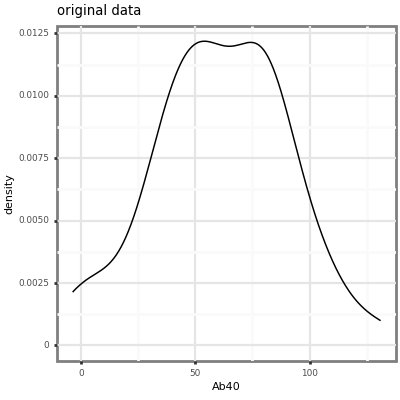

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 28 rows containing non-finite values.


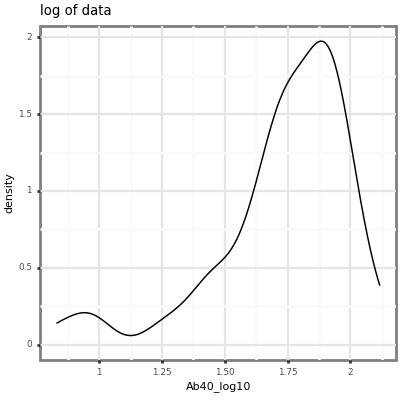

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 33 rows containing non-finite values.


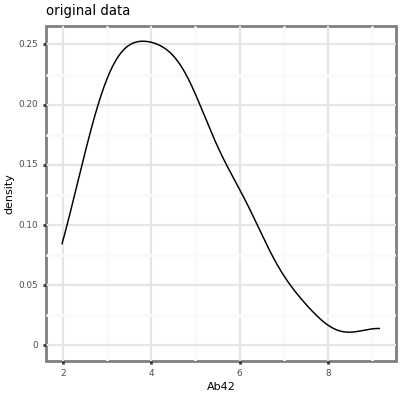

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 33 rows containing non-finite values.


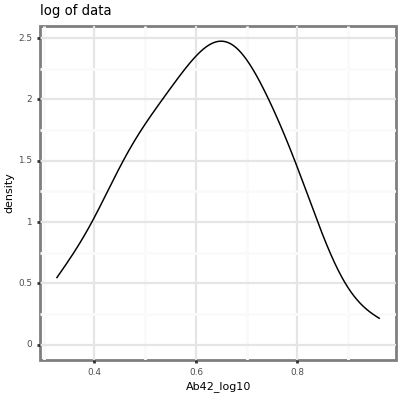

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 33 rows containing non-finite values.


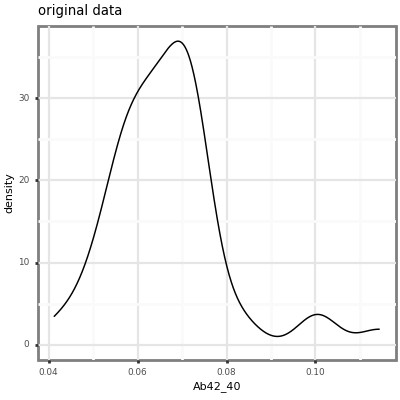

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 33 rows containing non-finite values.


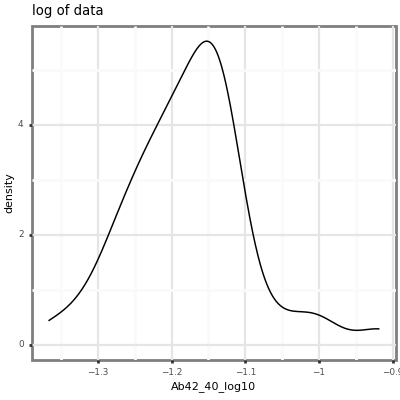

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 26 rows containing non-finite values.


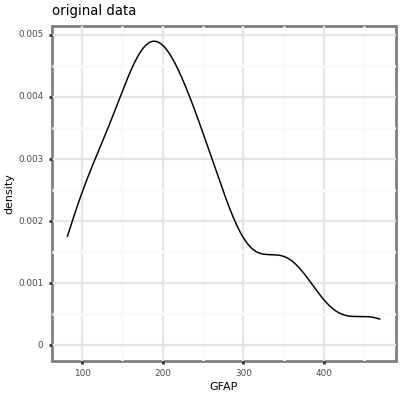

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 26 rows containing non-finite values.


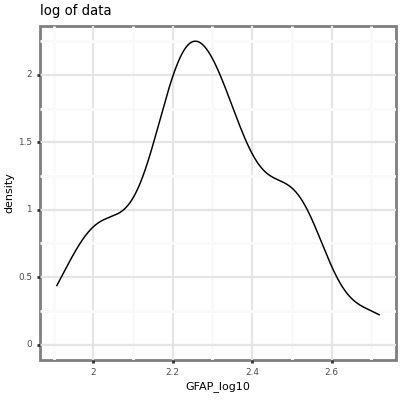

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 26 rows containing non-finite values.


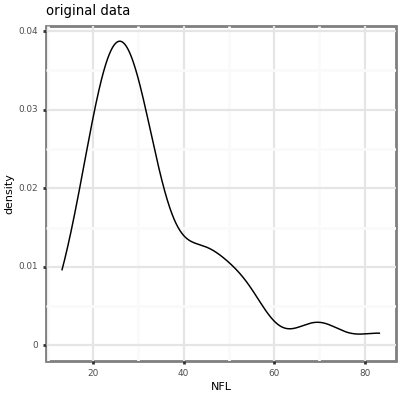

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 26 rows containing non-finite values.


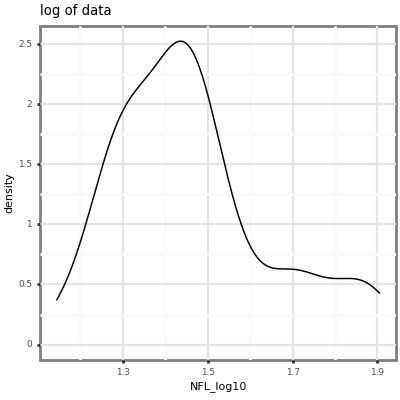

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 25 rows containing non-finite values.


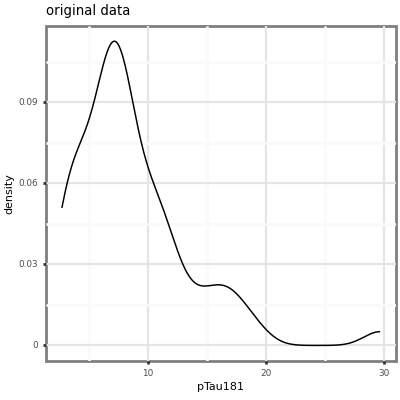

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 25 rows containing non-finite values.


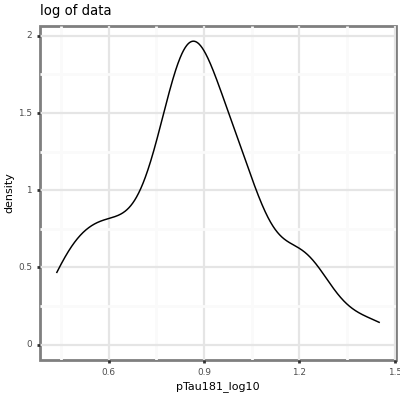

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 29 rows containing non-finite values.


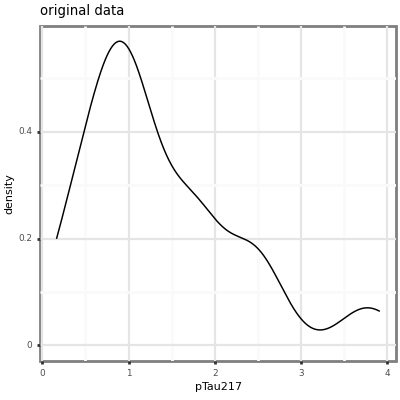

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 29 rows containing non-finite values.


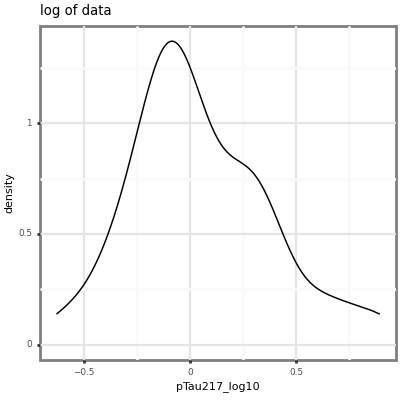

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 31 rows containing non-finite values.


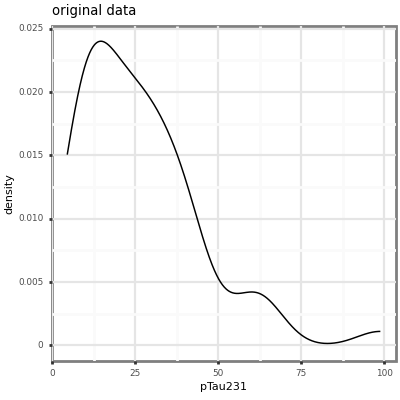

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 31 rows containing non-finite values.


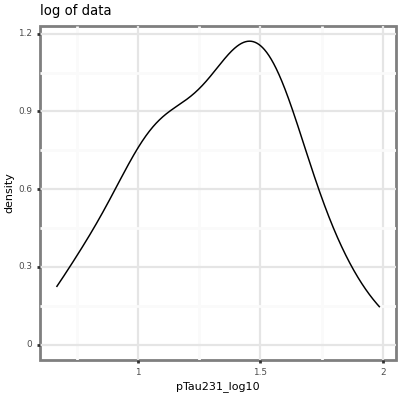

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 33 rows containing non-finite values.


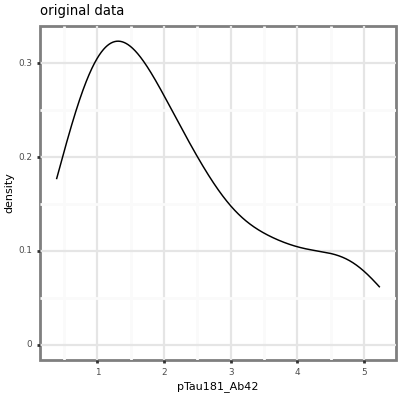

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_density : Removed 33 rows containing non-finite values.


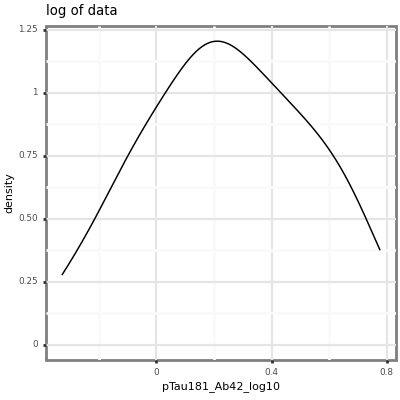

In [16]:
p9.options.figure_size = (2,2)

for var in plasma_columns:

    plot = (
            p9.ggplot(placebo_baseline_data, p9.aes(x = var))
            + p9.theme_bw(base_size = 4)
            + p9.geom_density(size = 0.3)
            + p9.labs(title = 'original data')
        )
    print(plot)
    plot = (
            p9.ggplot(placebo_baseline_data, p9.aes(x = var +'_log10'))
            + p9.theme_bw(base_size = 4)
            + p9.geom_density(size = 0.3)
            + p9.labs(title = 'log of data')
        )
    print(plot)

# Which plasma markers show Aging Effects

## original/raw plasma
GFAP, NFL, ptau-231 (but 231 is in wrong direction)

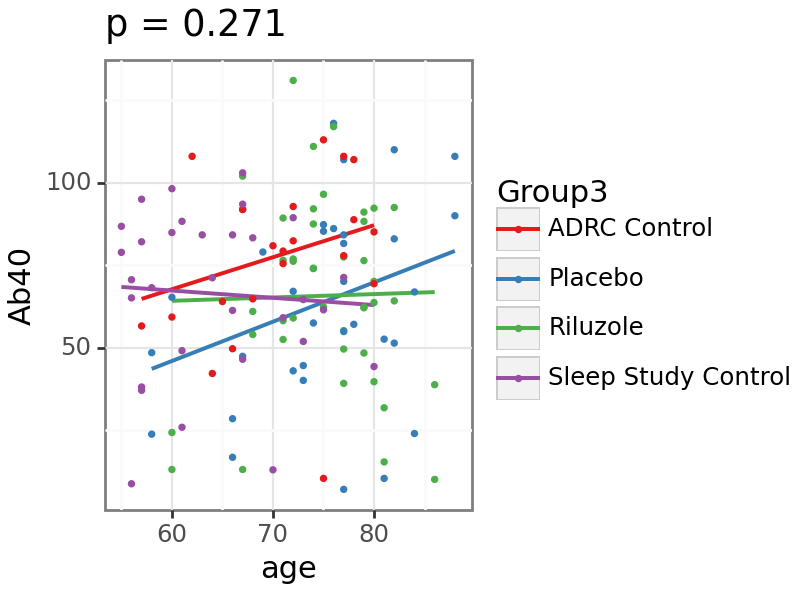

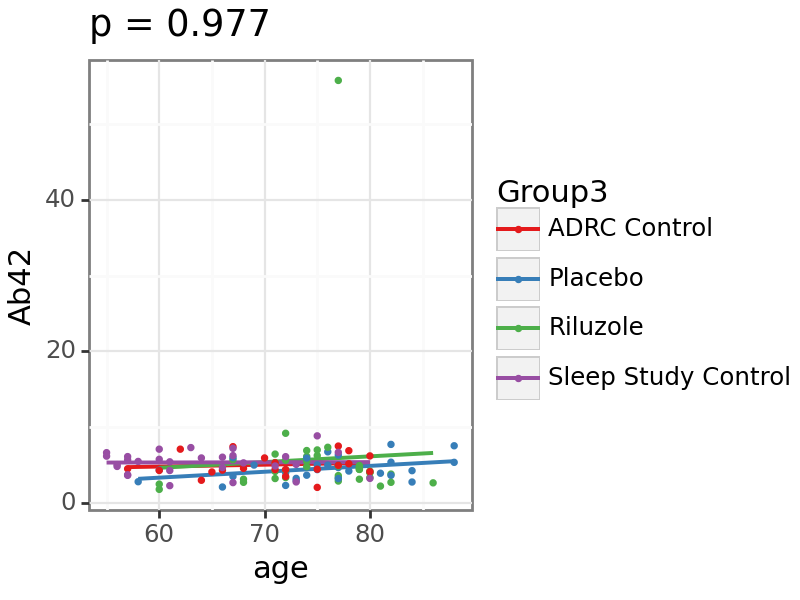

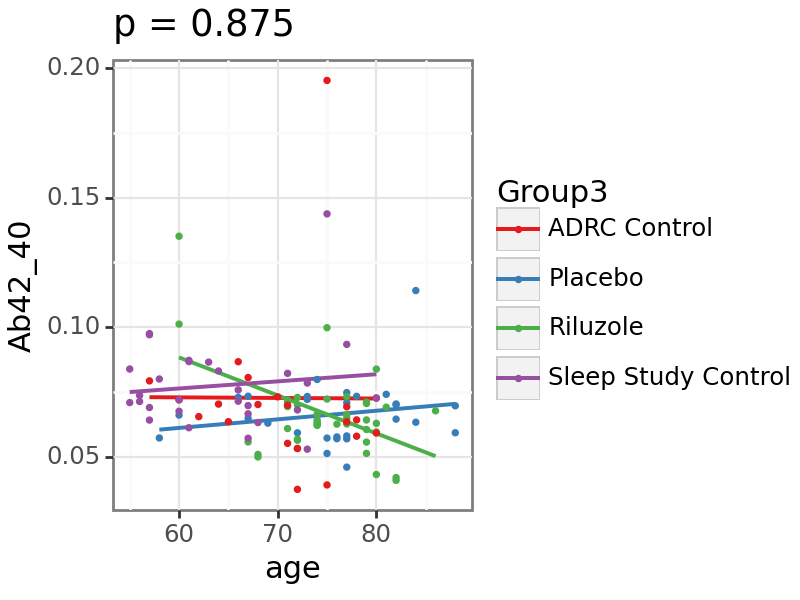

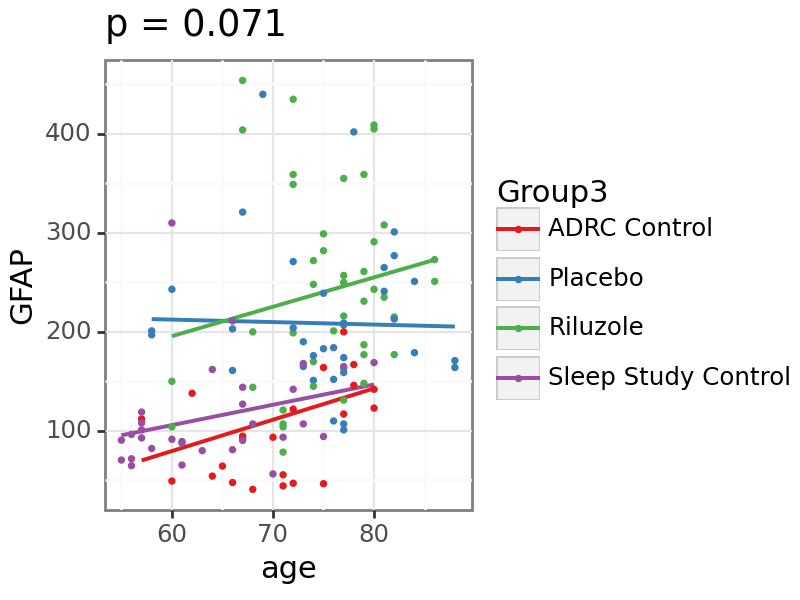

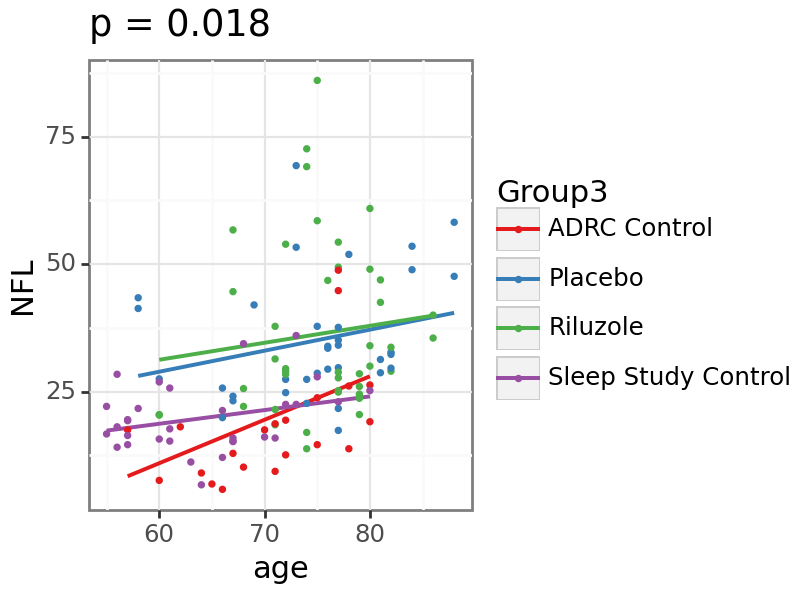

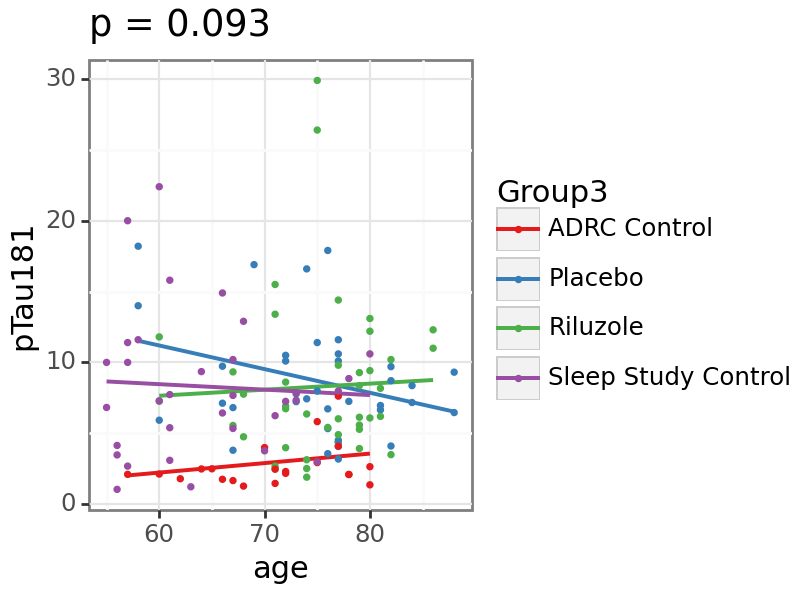

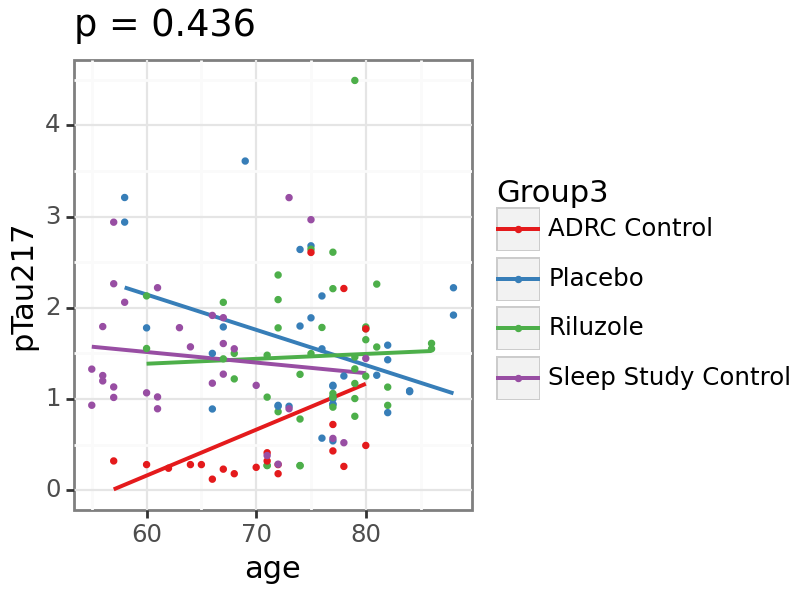

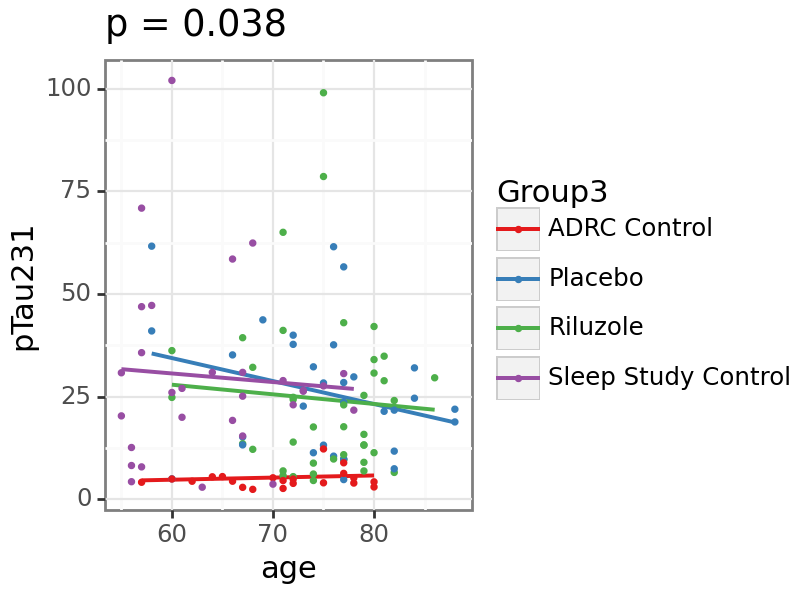

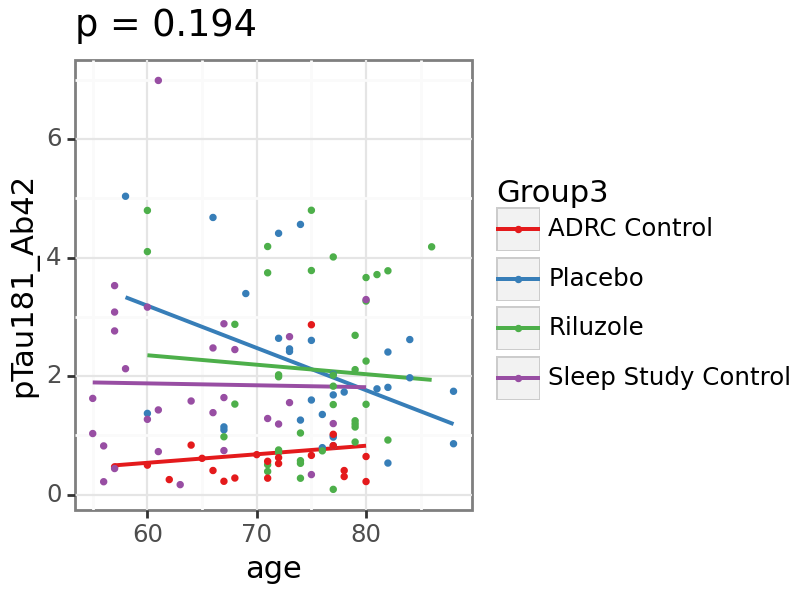

In [17]:
p9.options.figure_size = (4,3)
for var in plasma_columns:
    subset_data = all_data.dropna(subset = [var,'age', 'source'])
    subset_data = subset_data[subset_data['Group3'].notna()]
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('source', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    model = smf.ols(formula ='age ~ ' + var, data = subset_data[subset_data['Group'].isin(['Control'])]).fit(disp = 0);
    pval = model.pvalues[var].round(3).astype('str')
    title = ''.join(['p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group3'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_brewer(type="qual", palette="Set1")

    )
    print(plot)

## log10
GFAP, NFL


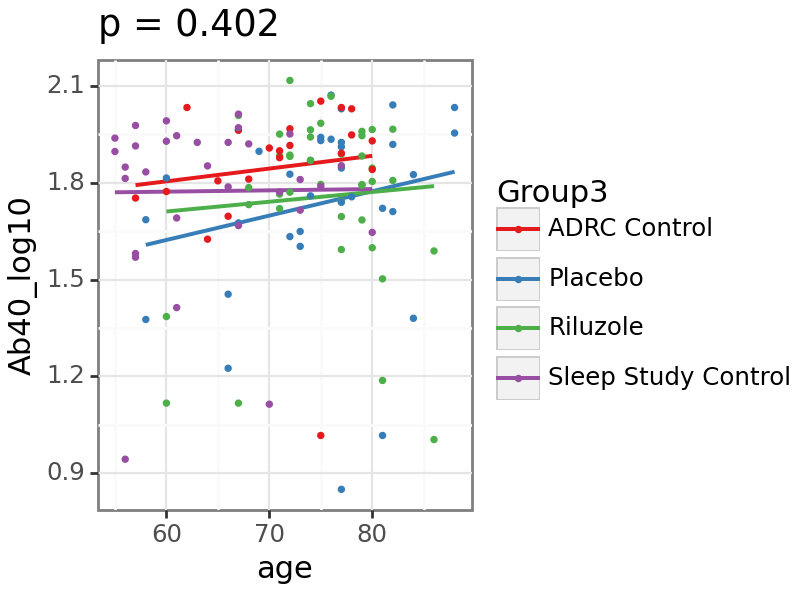

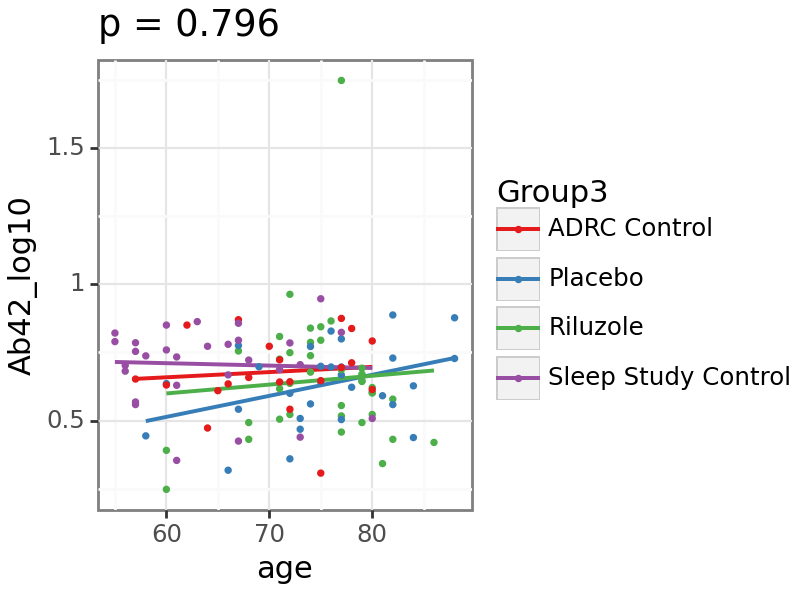

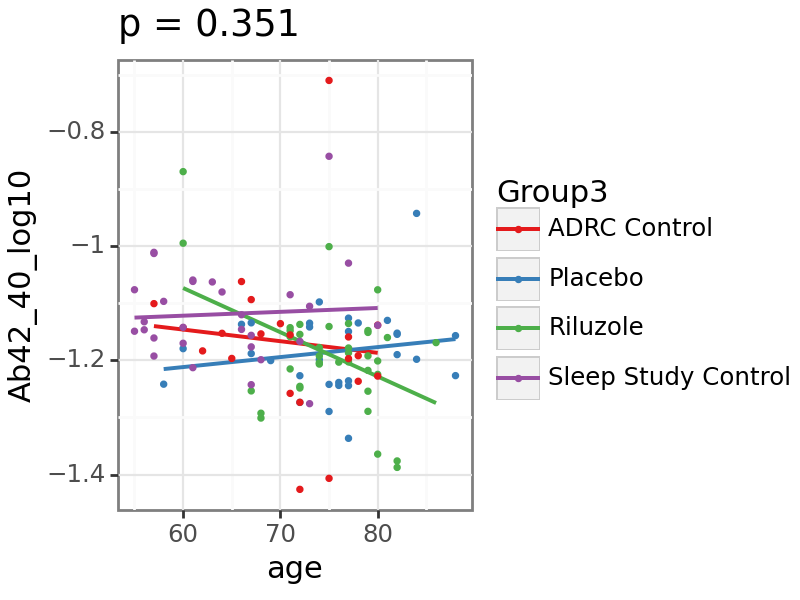

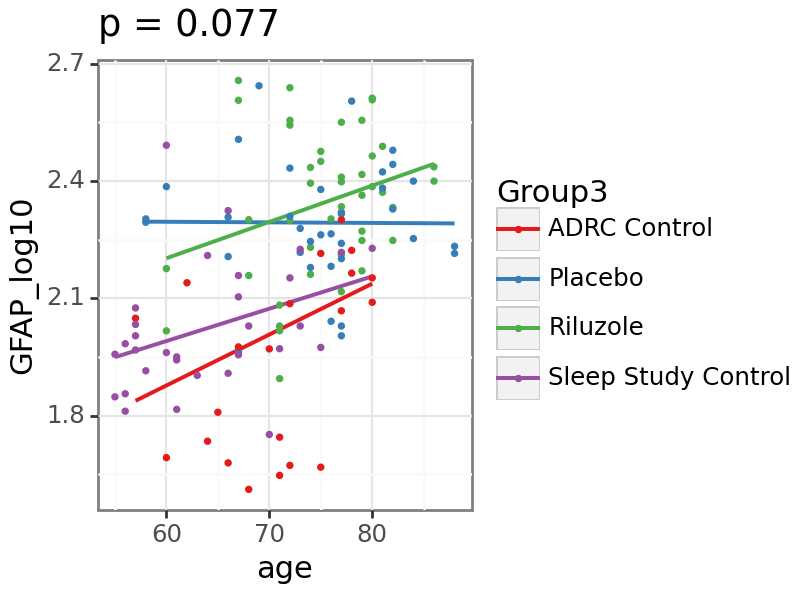

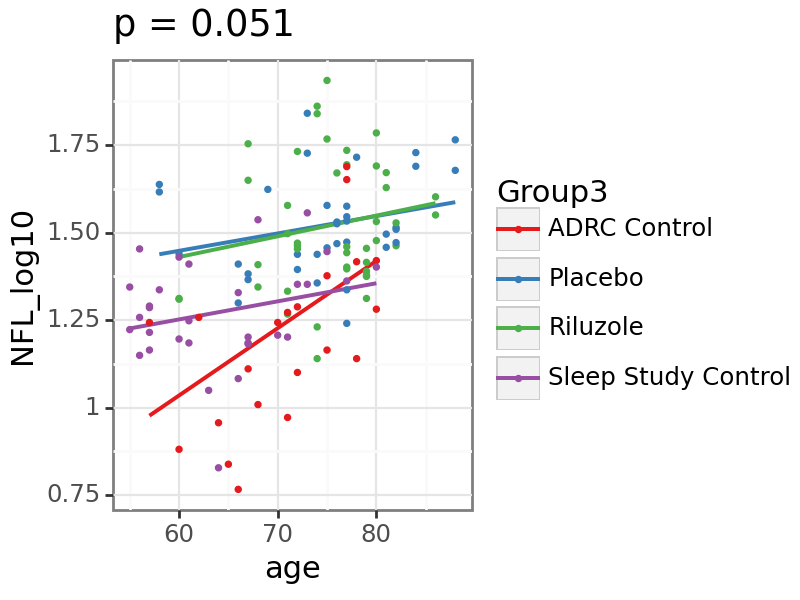

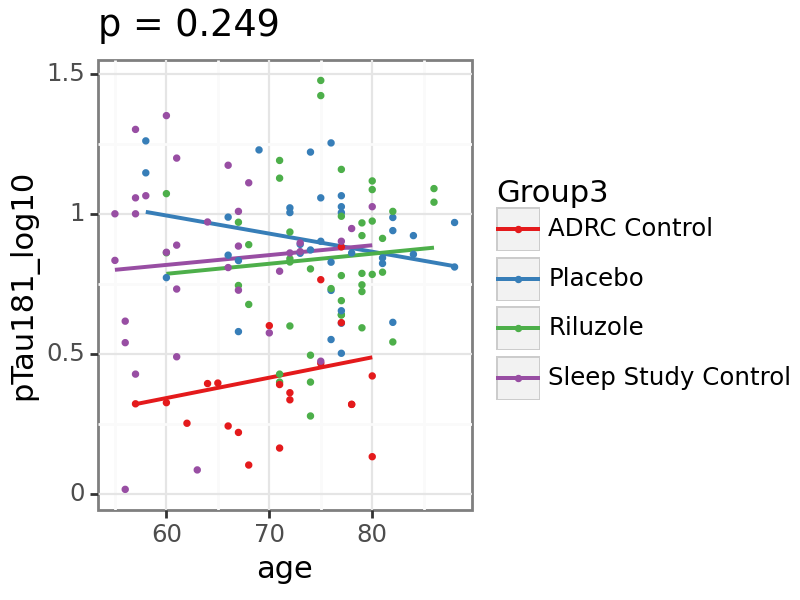

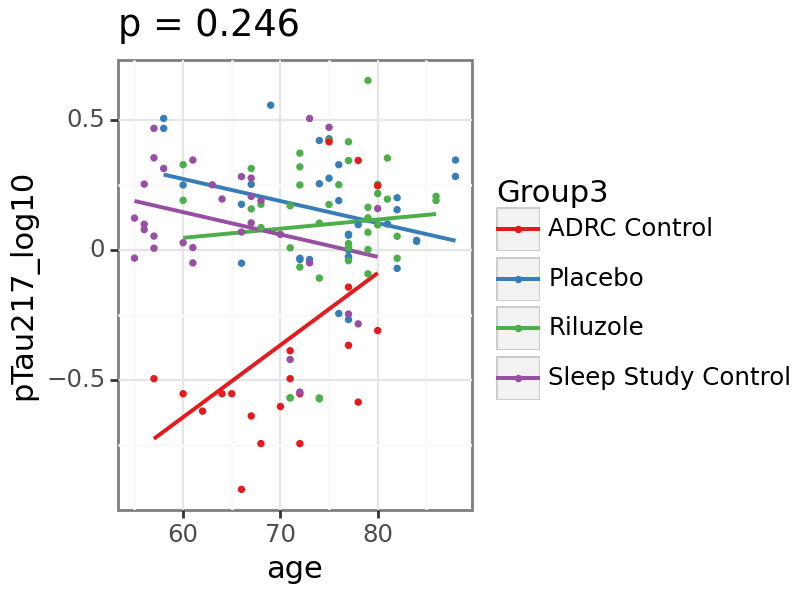

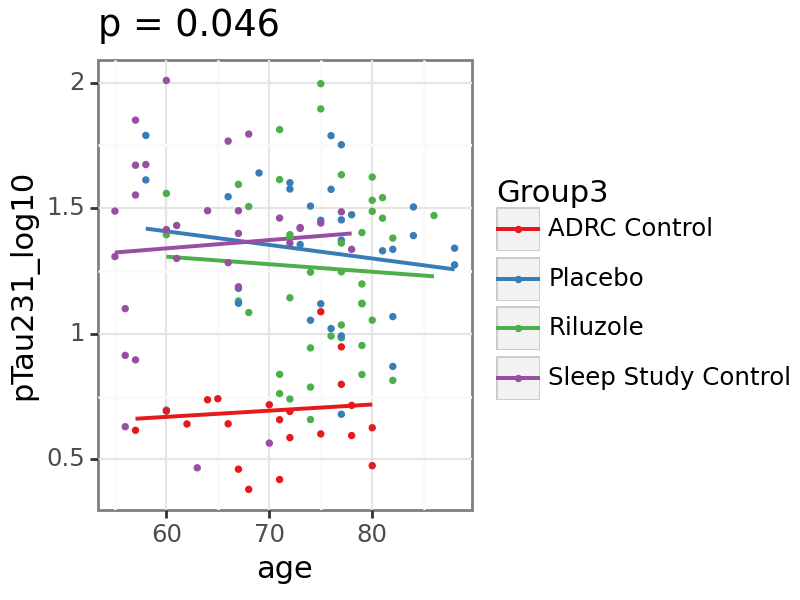

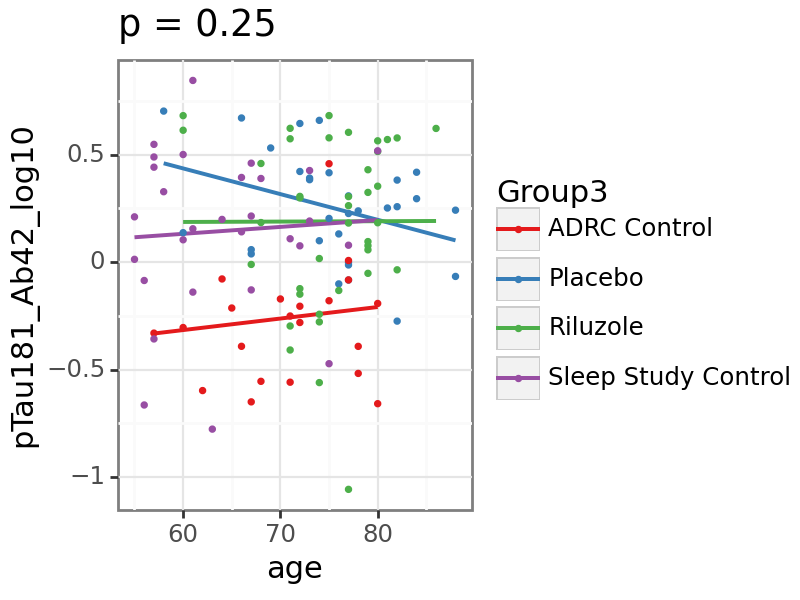

In [18]:
p9.options.figure_size = (4,3)
for var in log10_plasma_columns:
    subset_data = all_data.dropna(subset = [var,'age', 'source'])
    subset_data = subset_data[subset_data['Group3'].notna()]
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('source', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    model = smf.ols(formula ='age ~ ' + var, data = subset_data[subset_data['Group'].isin(['Control'])]).fit(disp = 0);
    pval = model.pvalues[var].round(3).astype('str')
    title = ''.join(['p = ', pval])
    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group3'))
            + p9.theme_bw(base_size=11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.labs(title = title)
            + p9.scale_color_brewer(type="qual", palette="Set1")

    )
    print(plot)

# ptau relationships before outliers removed

In [19]:
baseline_data[['pTau231_log10', 'pTau217_log10', 'pTau181_log10']].describe()

,pTau231_log10,pTau217_log10,pTau181_log10
count,34.000000,35.000000,38.000000
mean,1.332761,0.044841,0.896586
std,0.310349,0.326248,0.247575
min,0.725872,-0.629566,0.435033
25%,1.114127,-0.148445,0.712236
50%,1.385541,-0.005724,0.904726
75%,1.570272,0.281099,1.033020
max,1.988118,0.893259,1.453505


In [20]:
baseline_data[['pTau231', 'pTau217', 'pTau181']].describe()

,pTau231,pTau217,pTau181
count,34.000000,35.000000,38.000000
mean,27.437060,1.412851,9.388162
std,19.728642,0.925404,5.546274
min,5.590298,0.164221,2.743623
25%,13.098447,0.785681,5.508680
50%,24.611717,1.166743,7.956082
75%,35.698030,1.790858,11.584951
max,98.841848,3.912405,29.695558


c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\pandas\core\indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\pandas\core\indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 10 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\

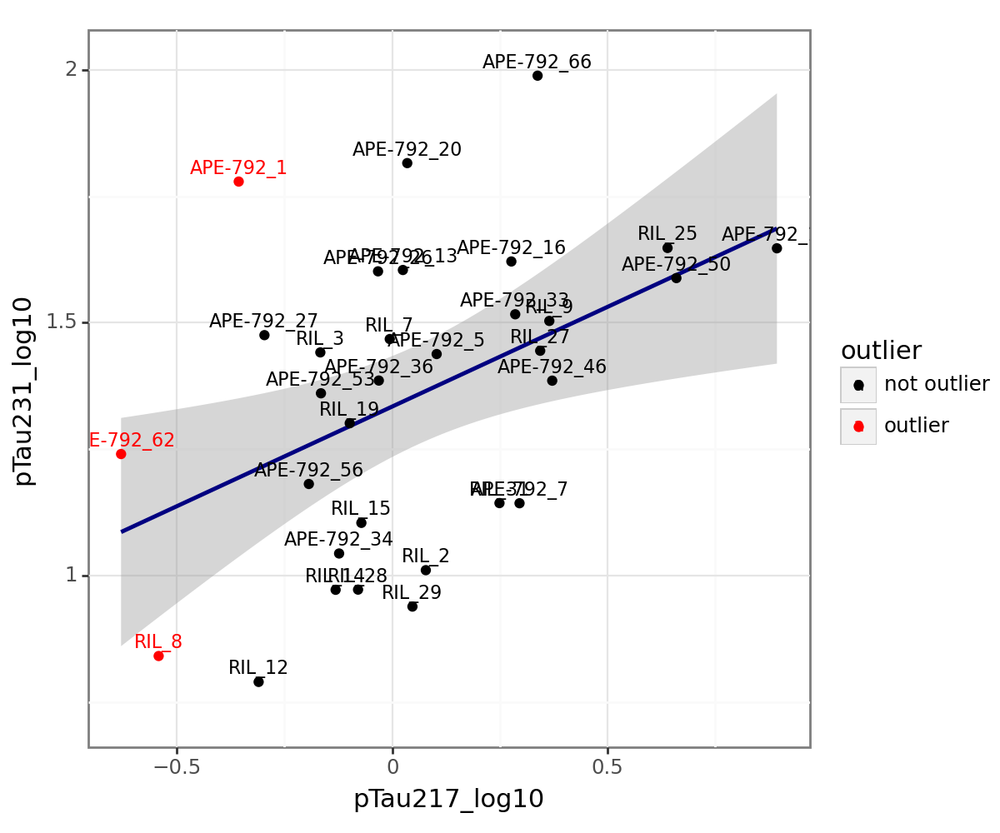

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 9 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 9 rows containing missing values.


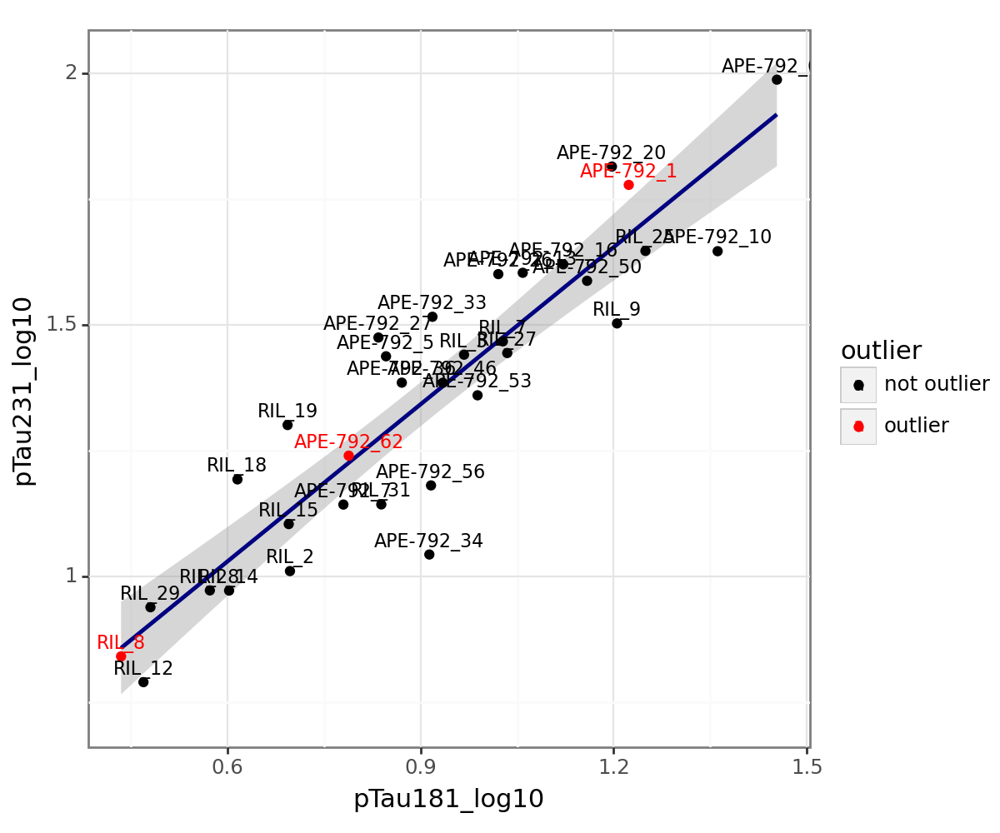

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 7 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 7 rows containing missing values.


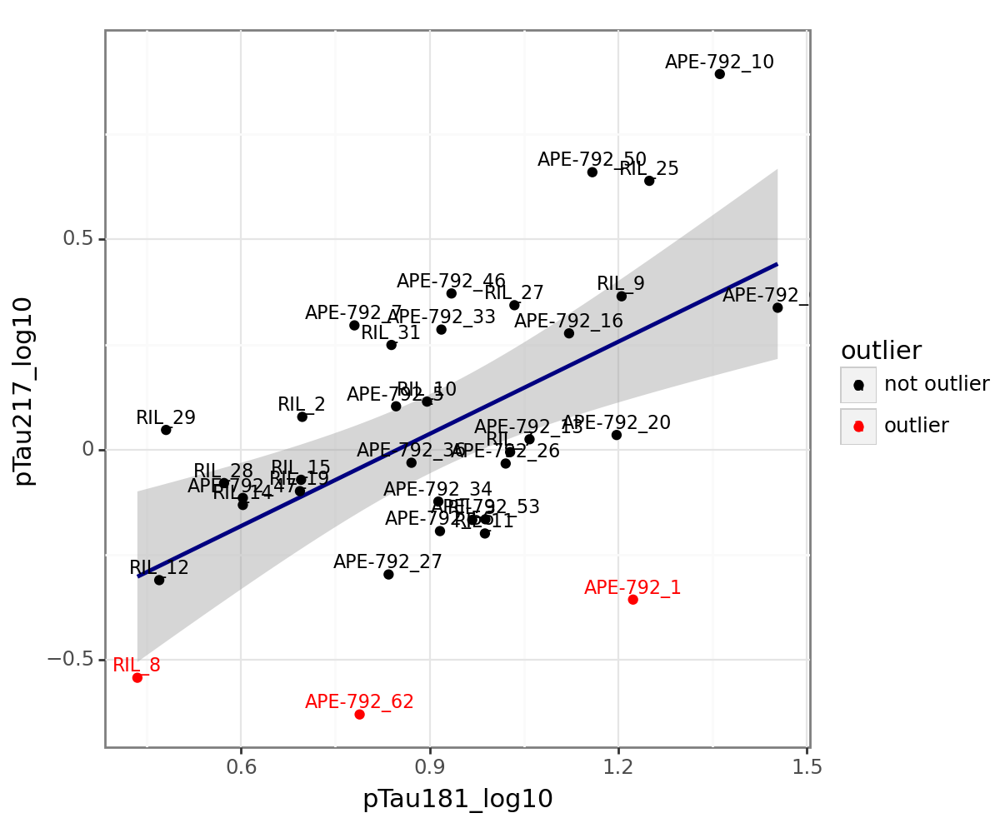

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 10 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 10 rows containing missing values.


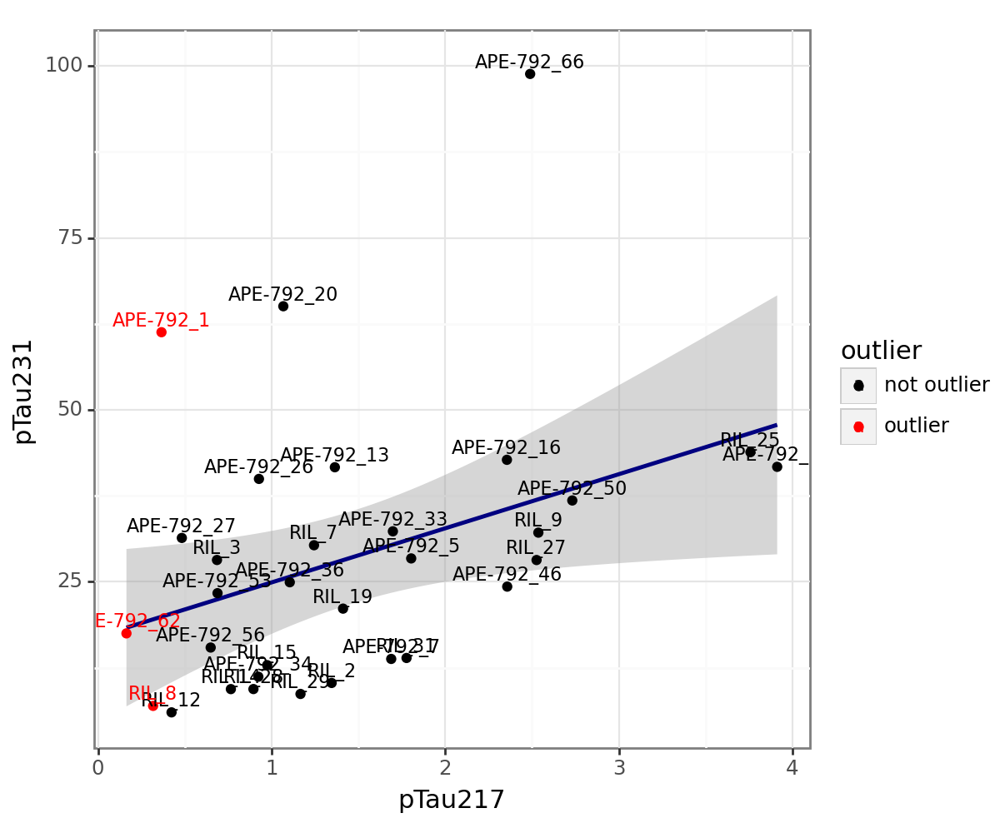

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 9 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 9 rows containing missing values.


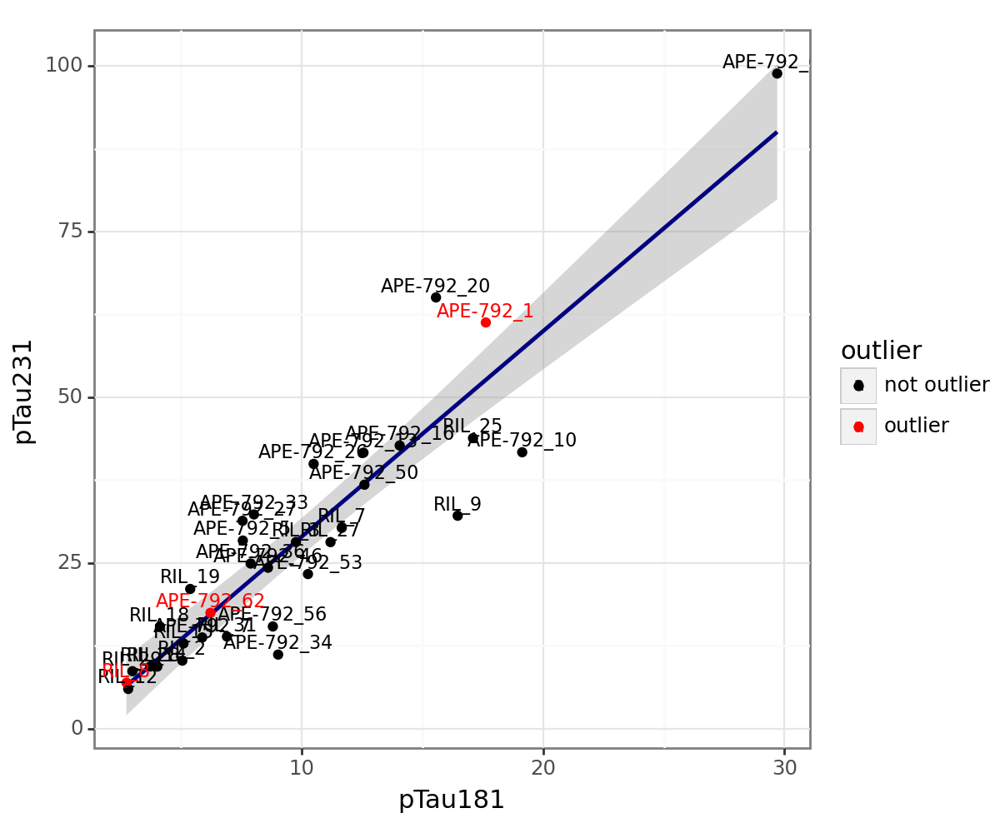

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 7 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 7 rows containing missing values.


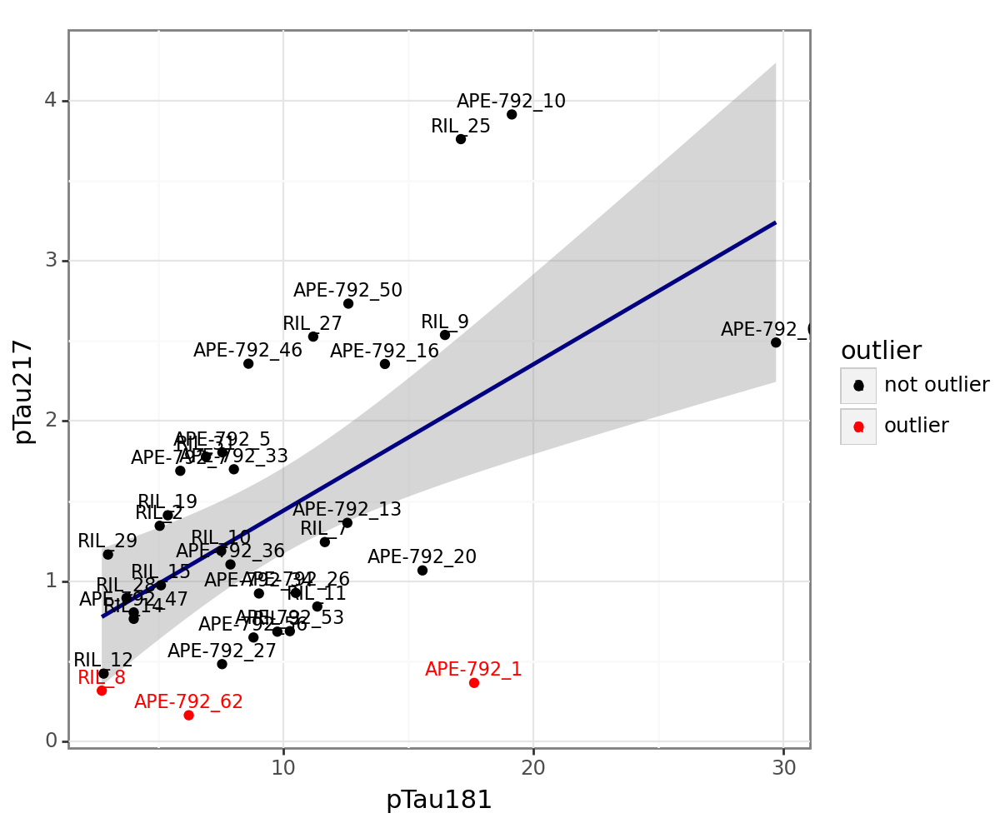

In [21]:
p9.options.figure_size = (6,5)  

baseline_data.loc[:, 'outlier'] = 'outlier'
baseline_data.loc[~baseline_data['ID_ADM'].isin(['APE-792_1', 'APE-792_62', 'RIL_8']), 'outlier'] = 'not outlier'

combinations = pd.DataFrame(list(itertools.combinations(['pTau231_log10', 'pTau217_log10', 'pTau181_log10'], 2)))
for idx in range(combinations[0].size):
    var = combinations[1][idx]
    var1 = combinations[0][idx]

    plot = (p9.ggplot(baseline_data, p9.aes(x = var, y = var1, label = 'ID_ADM', color = 'outlier'))
    + p9.theme_bw(base_size = 11)
    + p9.geom_smooth(method = 'lm', size = 1, color = 'navy')
    + p9.geom_point()
    + p9.geom_text(size = 8, nudge_x = 0, nudge_y =baseline_data[var1].std()/12)
    + p9.scale_color_manual(values = ['black', 'red']) )
    print(plot)


combinations = pd.DataFrame(list(itertools.combinations(['pTau231', 'pTau217', 'pTau181'], 2)))
for idx in range(combinations[0].size):
    var = combinations[1][idx]
    var1 = combinations[0][idx]

    plot = (p9.ggplot(baseline_data, p9.aes(x = var, y = var1, label = 'ID_ADM', color = 'outlier'))
    + p9.theme_bw(base_size = 11)
    + p9.geom_smooth(method = 'lm', size = 1, color = 'navy')
    + p9.geom_point()
    + p9.geom_text(size = 8, nudge_x = 0, nudge_y =baseline_data[var1].std()/12)
    + p9.scale_color_manual(values = ['black', 'red']) )

    print(plot)

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 7 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 7 rows containing missing values.


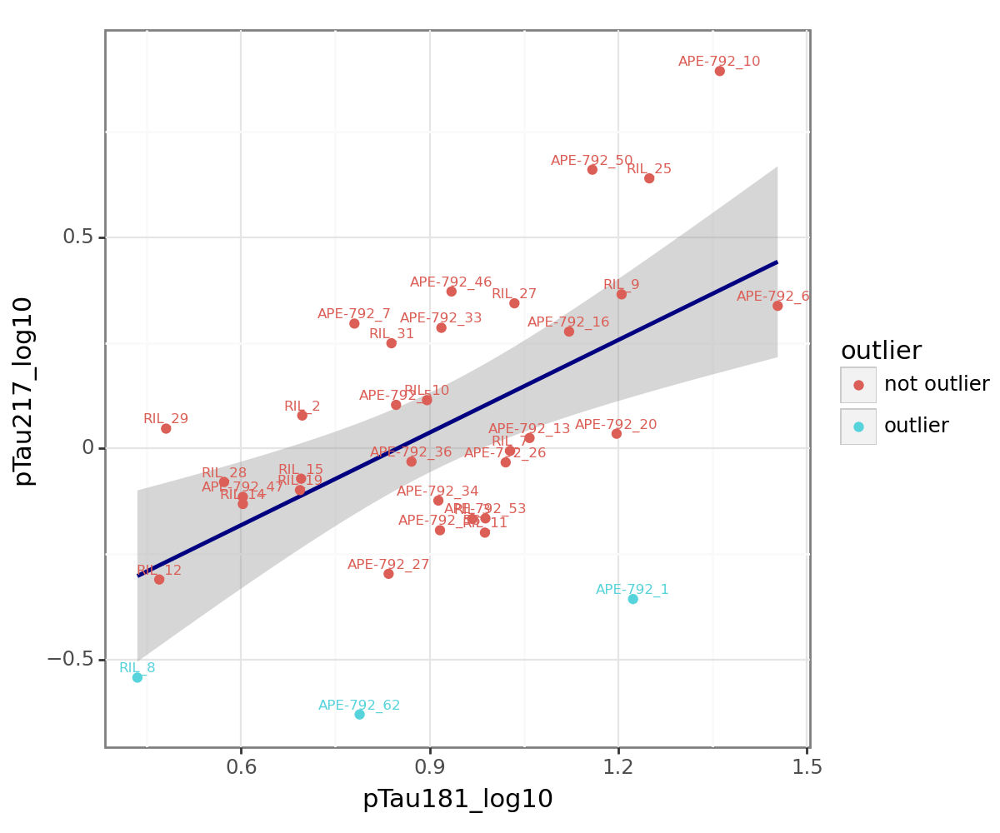

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 7 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 7 rows containing missing values.


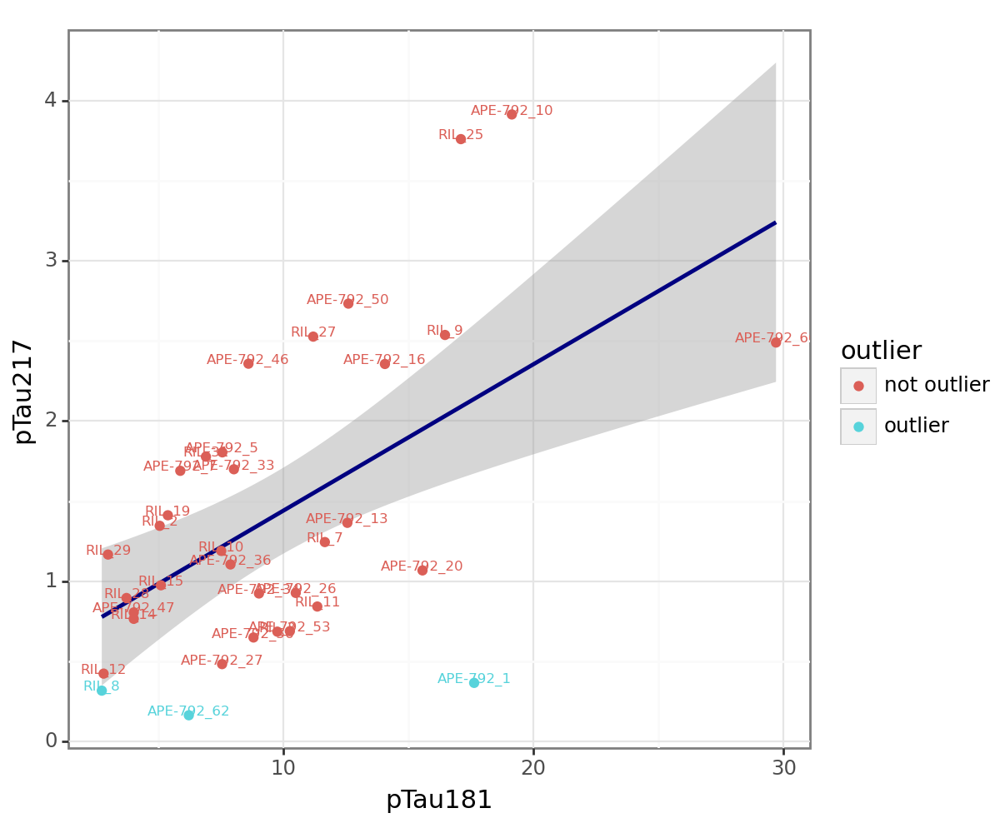

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 7 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 7 rows containing missing values.


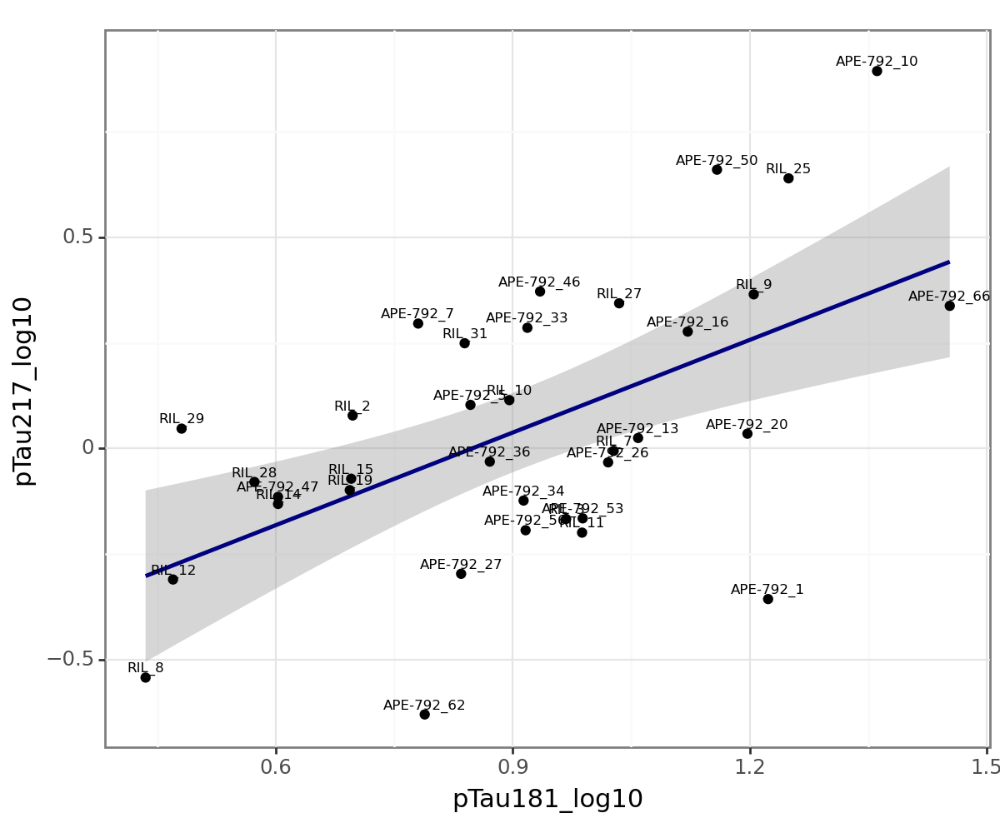

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 7 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 7 rows containing missing values.


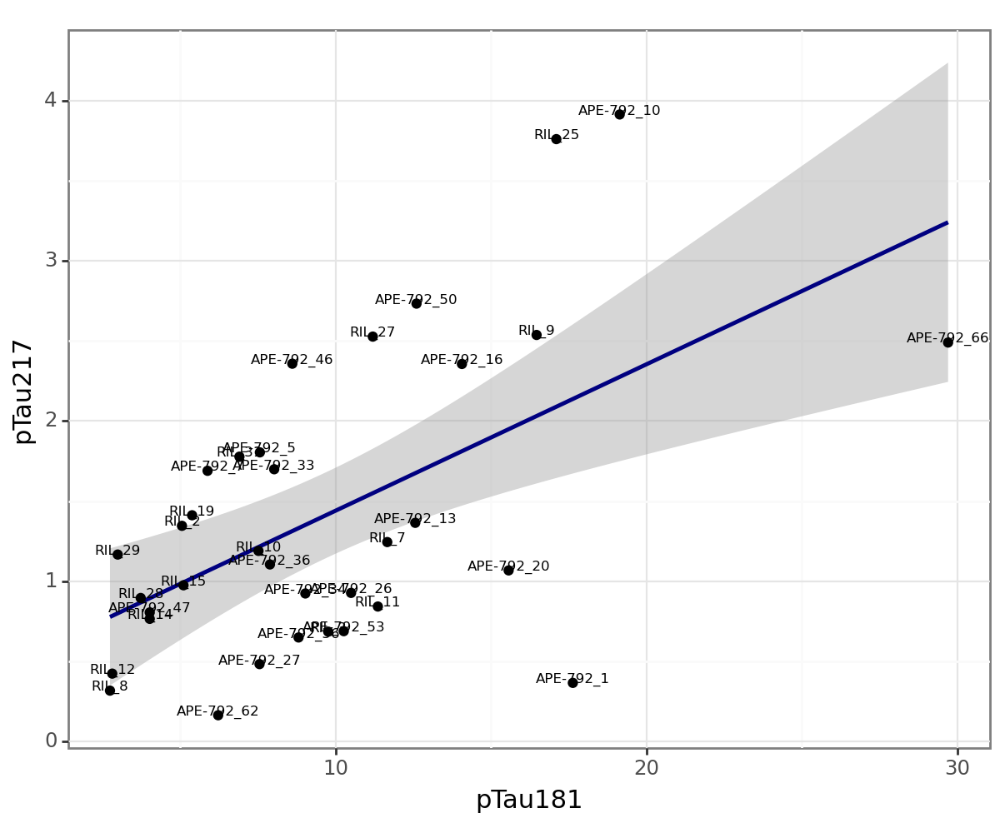

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 7 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 7 rows containing missing values.


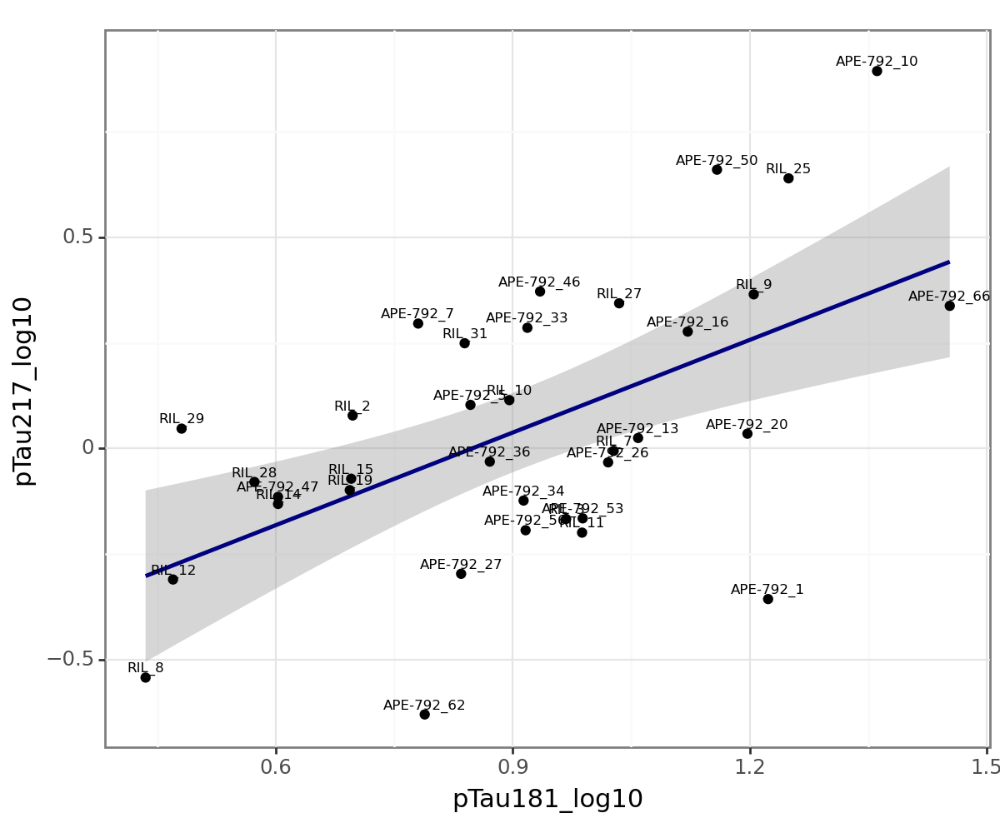

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 7 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 7 rows containing missing values.


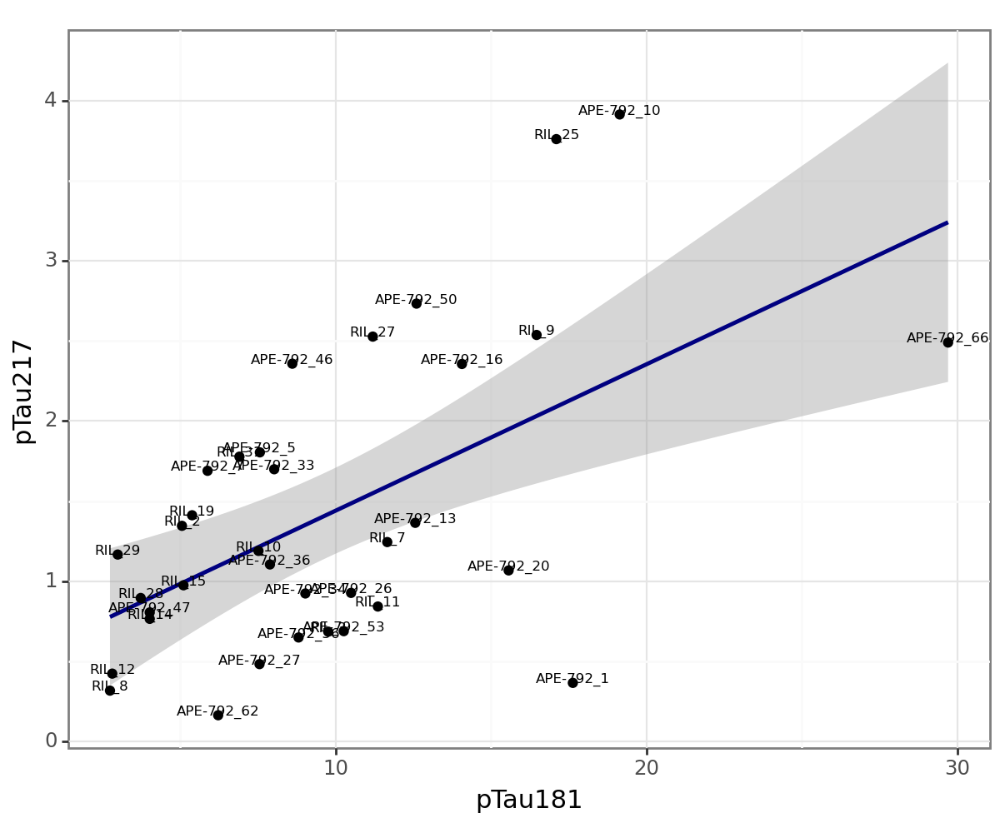

In [22]:


print(p9.ggplot(baseline_data, p9.aes(x = 'pTau181_log10', y = 'pTau217_log10', label = 'ID_ADM', color = 'outlier'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 1, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )


print(p9.ggplot(baseline_data, p9.aes(x = 'pTau181', y = 'pTau217', label = 'ID_ADM', color = 'outlier'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 1, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )


print(p9.ggplot(baseline_data, p9.aes(x = 'pTau181_log10', y = 'pTau217_log10', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 1, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )


print(p9.ggplot(baseline_data, p9.aes(x = 'pTau181', y = 'pTau217', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 1, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )

print(p9.ggplot(baseline_data, p9.aes(x = 'pTau181_log10', y = 'pTau217_log10', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 1, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )


print(p9.ggplot(baseline_data, p9.aes(x = 'pTau181', y = 'pTau217', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 1, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )

## V2: calculate change from baseline to followup then model the delta

In [23]:
p9.options.figure_size = (3,3)
graphing_vars = ['Group']
for var in plasma_columns:
    temp_df = all_data[all_data['Group'].isin(['Placebo', 'Riluzole']) & all_data['timepoint'].isin(['base', 'end'])].dropna(subset = [var, 'Group'])
    ppts_with_multiple_visits = temp_df['ID_ADM'].value_counts()[temp_df['ID_ADM'].value_counts()>1].index
    temp_df = temp_df[temp_df['ID_ADM'].isin(ppts_with_multiple_visits)]
    temp_df = temp_df.sort_values(['ID_ADM', 'timepoint'])
    temp_df = pd.merge(temp_df[['ID_ADM', 'Group']], temp_df.groupby(['ID_ADM'])[var].diff(), left_index=True, right_index=True).dropna()
    temp_df['Group'] = temp_df['Group'].replace({'Placebo':'0', 'Riluzole':'1'}).astype('int')
    model = smf.logit(formula ='Group ~ ' + var, data = temp_df).fit(disp = 0);
    placebo_p = model.pvalues[var].round(2).astype('str')
    print(var, placebo_p)
    if (model.pvalues[var] < 0.05):
        #print(model.summary(), '\n\n')
        print('\n\n', var, placebo_p)
        plot = (p9.ggplot(all_data[all_data['Group'].isin(['Placebo', 'Riluzole'])], p9.aes(x = 'timepoint', y = var)) 
            + p9.theme_bw(base_size=11) 
            + p9.geom_violin(p9.aes(fill = graphing_vars[0]), alpha = 0.6, style="left-right") 
            + p9.geom_point(size = 0.4)
            + p9.geom_line(p9.aes(group="ID_ADM"), size = 0.4)                
            + p9.facet_grid('~' + graphing_vars[0])
            + p9.theme(legend_position = "none", axis_text_x = p9.element_text(rotation = 0), plot_title = p9.element_text(size = 10), plot_subtitle = p9.element_text(size = 8))
            )  
        print(plot)
        print('\n')

Ab40 0.3
Ab42 0.93
Ab42_40 0.19
GFAP 0.12
NFL 0.28
pTau181 0.73
pTau217 0.27
pTau231 0.91
pTau181_Ab42 0.77


# all plasma change over time

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 25 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\geoms\geom_path.py:98: PlotnineWarning: geom_path: Removed 2 rows containing missing values.


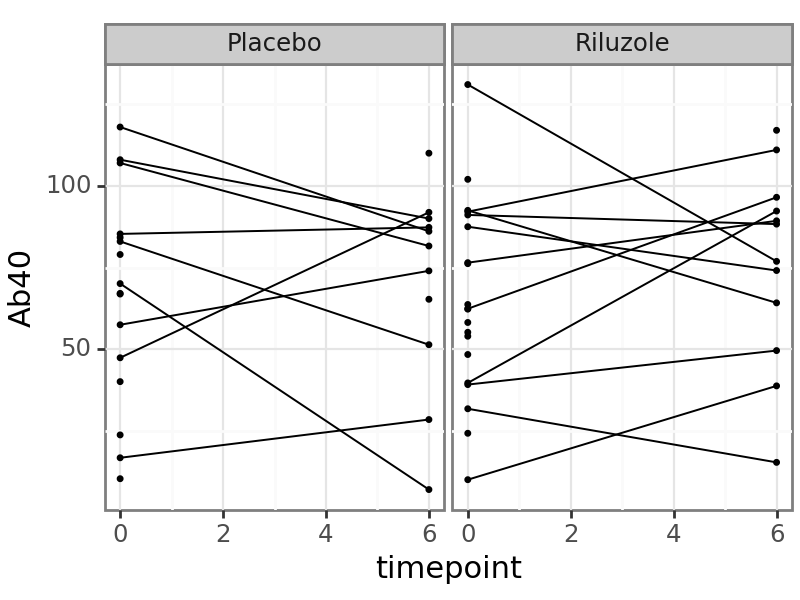

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 30 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\geoms\geom_path.py:98: PlotnineWarning: geom_path: Removed 6 rows containing missing values.


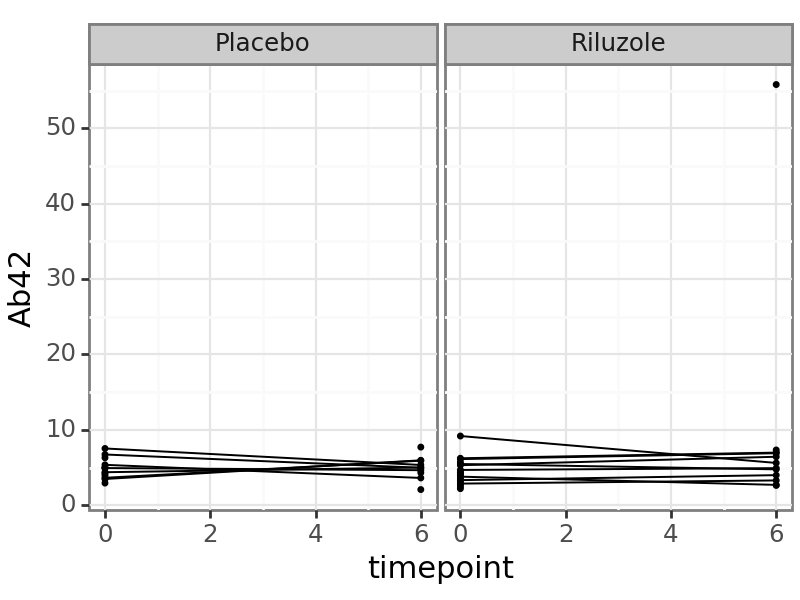

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 31 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\geoms\geom_path.py:98: PlotnineWarning: geom_path: Removed 6 rows containing missing values.


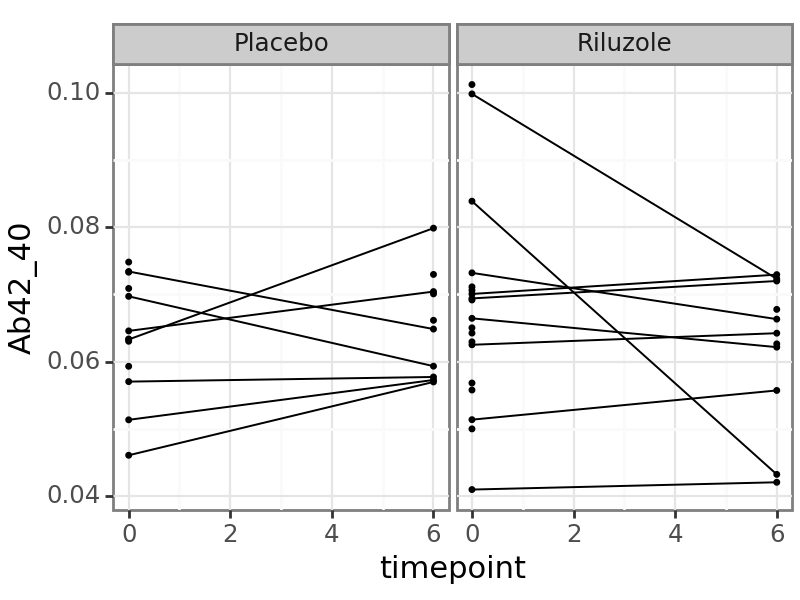

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 22 rows containing missing values.


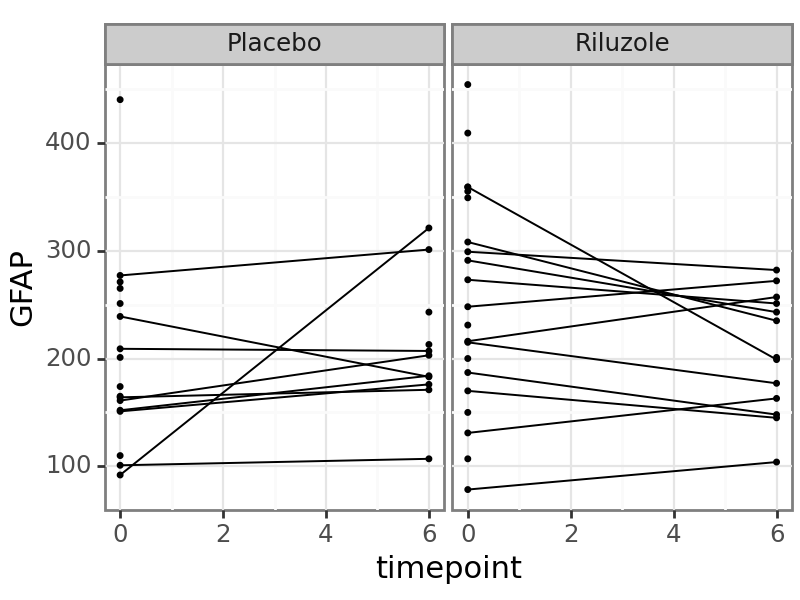

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 22 rows containing missing values.


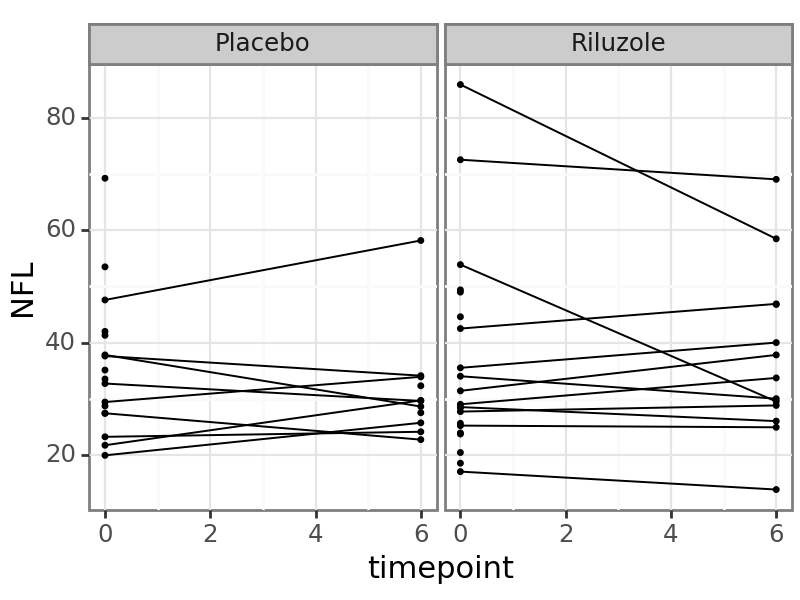

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 21 rows containing missing values.


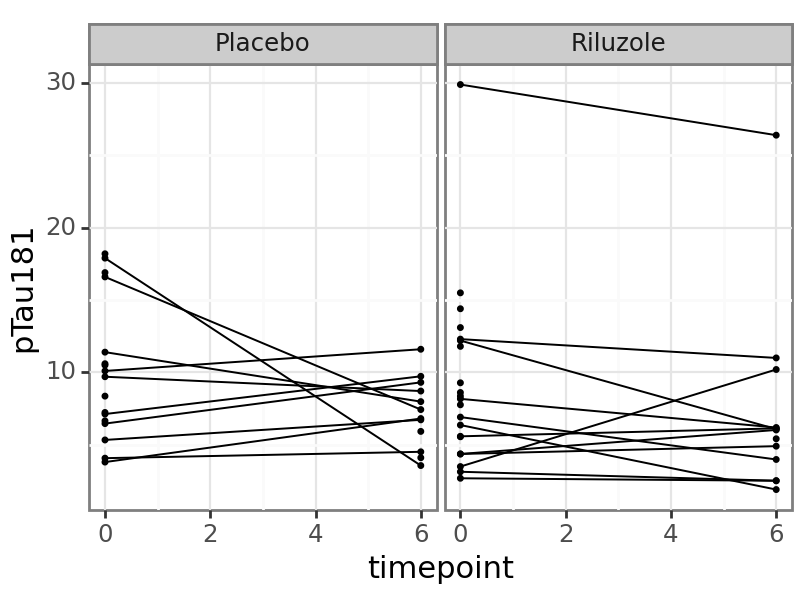

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 25 rows containing missing values.


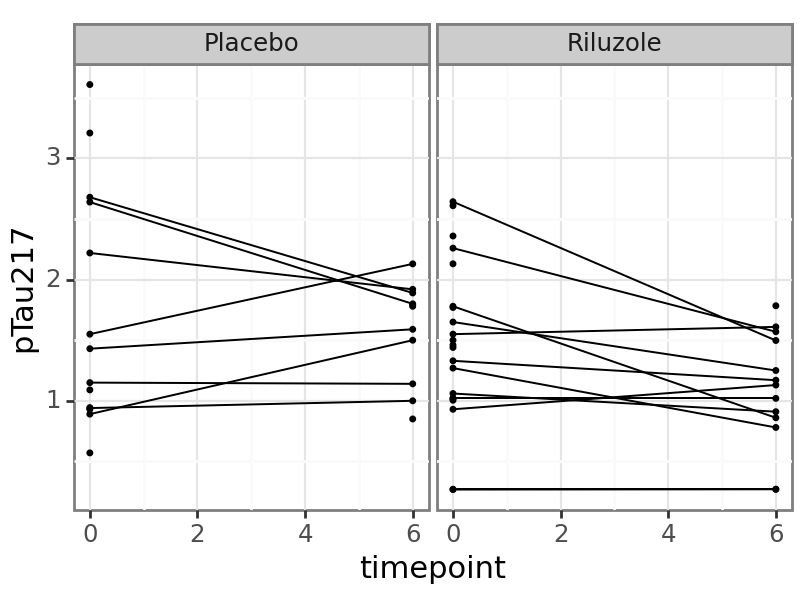

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 28 rows containing missing values.


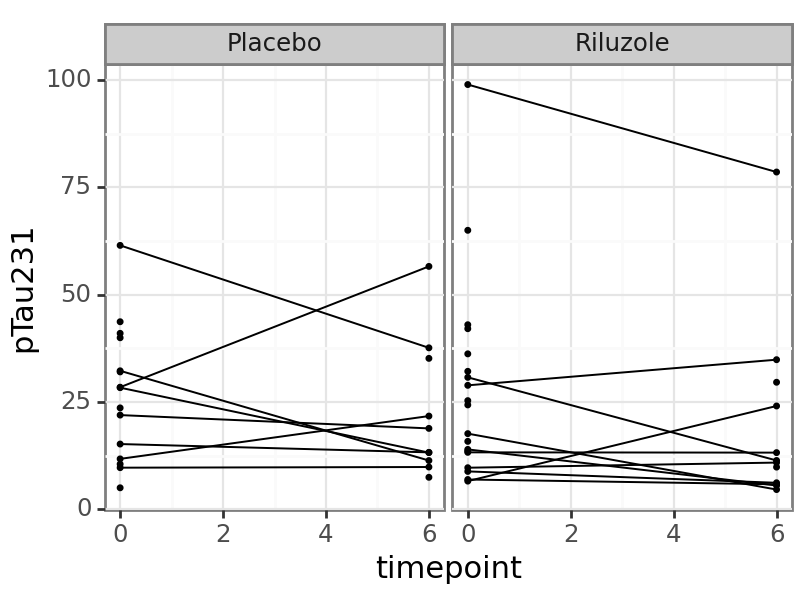

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 30 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\geoms\geom_path.py:98: PlotnineWarning: geom_path: Removed 6 rows containing missing values.


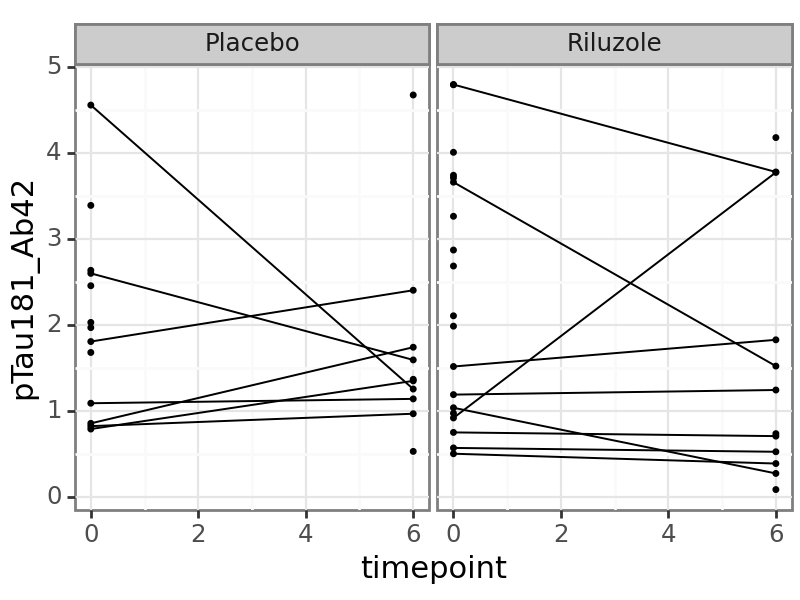

In [24]:
graphing_vars = ['Group']
p9.options.figure_size = (4,3)
for var in plasma_columns:
    
    temp_df = all_data[all_data['Group'].isin(['Placebo', 'Riluzole'])].copy()
    temp_df['timepoint'] = temp_df['timepoint'].replace({'base':'0', 'mid':'3', 'end':'6'}).astype('float64')
    temp_df = temp_df[temp_df['timepoint'].isin([0, 6])]
    plot = (p9.ggplot(temp_df, p9.aes(x = 'timepoint', y = var)) 
                + p9.theme_bw(base_size=11) 
                + p9.geom_point(size = 0.4)
                + p9.geom_line(p9.aes(group="ID_ADM"), size = 0.4)                
                + p9.facet_grid('~' + graphing_vars[0])
                + p9.theme(legend_position = "none", axis_text_x = p9.element_text(rotation = 0), plot_title = p9.element_text(size = 10), plot_subtitle = p9.element_text(size = 8))
                )  
    print(plot)

# Changes over time in the Clinical Trial

## V1 : timepoint in a mixed model

Ab40 0.4893
Ab42 0.9835


c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.


Ab42_40 0.1577
GFAP 0.0262
                Mixed Linear Model Regression Results
Model:                 MixedLM      Dependent Variable:      GFAP     
No. Observations:      78           Method:                  REML     
No. Groups:            42           Scale:                   1920.7156
Min. group size:       1            Log-Likelihood:          -420.7921
Max. group size:       3            Converged:               Yes      
Mean group size:       1.9                                            
----------------------------------------------------------------------
                        Coef.   Std.Err.   z    P>|z|  [0.025   0.975]
----------------------------------------------------------------------
Intercept               209.985   21.480  9.776 0.000  167.885 252.085
timepoint[T.end]         26.308   19.623  1.341 0.180  -12.152  64.769
timepoint[T.mid]        -13.495   23.926 -0.564 0.573  -60.389  33.400
Group                    45.796   29.330  1.561 0.118  -11.690 103.

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_ydensity : Removed 48 rows containing non-finite values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 48 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\geoms\geom_path.py:98: PlotnineWarning: geom_path: Removed 1 rows containing missing values.


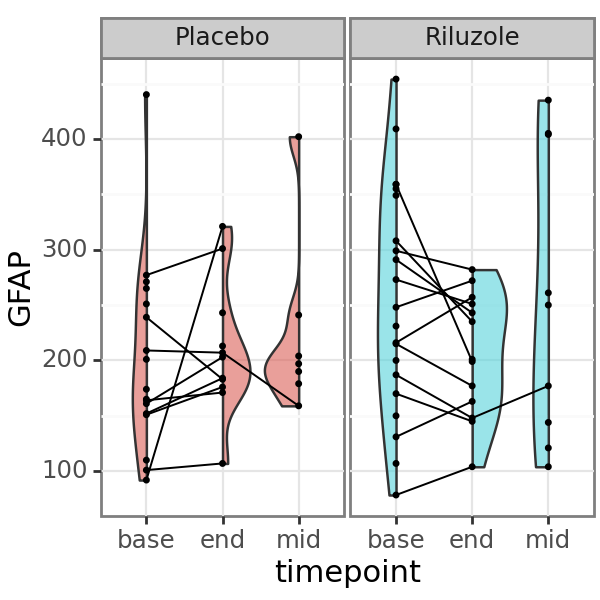


NFL 0.4474
pTau181 0.6837
pTau217 0.4262
pTau231 0.6937
pTau181_Ab42 0.7845


In [25]:
p9.options.figure_size = (3,3)

graphing_vars = ['Group']
for var in plasma_columns:

    temp_df = all_data[all_data['Group'].isin(['Placebo', 'Riluzole'])].dropna(subset = [var, 'Group'])
    temp_df['Group'] = temp_df['Group'].replace({'Placebo':'0', 'Riluzole':'1'}).astype('int')
    model = smf.mixedlm(formula =var + '~ Group + timepoint + Group:timepoint', data = temp_df, groups = temp_df['ID_ADM']).fit(disp = 0);
    placebo_p = model.pvalues['Group:timepoint[T.end]'].round(4).astype('str')
    print(var, placebo_p)
    if (model.pvalues['Group:timepoint[T.end]'] < 0.05):
        print(model.summary(), '\n\n')
        plot = (p9.ggplot(all_data[all_data['Group'].isin(['Placebo', 'Riluzole'])], p9.aes(x = 'timepoint', y = var)) 
                + p9.theme_bw(base_size=11) 
                + p9.geom_violin(p9.aes(fill = graphing_vars[0]), alpha = 0.6, style="left-right") 
                + p9.geom_point(size = 0.4)
                + p9.geom_line(p9.aes(group="ID_ADM"), size = 0.4)                
                + p9.facet_grid('~' + graphing_vars[0])
                + p9.theme(legend_position = "none", axis_text_x = p9.element_text(rotation = 0), plot_title = p9.element_text(size = 10), plot_subtitle = p9.element_text(size = 8))
                )  
        print(plot)

## V2: calculate change from baseline to followup then model the delta

In [26]:
p9.options.figure_size = (3,3)
graphing_vars = ['Group']
for var in plasma_columns :
    temp_df = all_data[all_data['Group'].isin(['Placebo', 'Riluzole']) & all_data['timepoint'].isin(['base', 'end'])].dropna(subset = [var, 'Group'])
    ppts_with_multiple_visits = temp_df['ID_ADM'].value_counts()[temp_df['ID_ADM'].value_counts()>1].index
    temp_df = temp_df[temp_df['ID_ADM'].isin(ppts_with_multiple_visits)]
    temp_df = temp_df.sort_values(['ID_ADM', 'timepoint'])
    temp_df = pd.merge(temp_df[['ID_ADM', 'Group']], temp_df.groupby(['ID_ADM'])[var].diff(), left_index=True, right_index=True).dropna()
    temp_df['Group'] = temp_df['Group'].replace({'Placebo':'0', 'Riluzole':'1'}).astype('int')
    model = smf.logit(formula ='Group ~ ' + var, data = temp_df).fit(disp = 0);
    placebo_p = model.pvalues[var].round(2).astype('str')
    print(var, placebo_p)
    if (model.pvalues[var] < 0.05):
        #print(model.summary(), '\n\n')
        print('\n\n', var, placebo_p)
        plot = (p9.ggplot(all_data[all_data['Group'].isin(['Placebo', 'Riluzole'])], p9.aes(x = 'timepoint', y = var)) 
            + p9.theme_bw(base_size=11) 
            + p9.geom_violin(p9.aes(fill = graphing_vars[0]), alpha = 0.6, style="left-right") 
            + p9.geom_point(size = 0.4)
            + p9.geom_line(p9.aes(group="ID_ADM"), size = 0.4)                
            + p9.facet_grid('~' + graphing_vars[0])
            + p9.theme(legend_position = "none", axis_text_x = p9.element_text(rotation = 0), plot_title = p9.element_text(size = 10), plot_subtitle = p9.element_text(size = 8))
            )  
        print(plot)
        print('\n')

Ab40 0.3
Ab42 0.93
Ab42_40 0.19
GFAP 0.12
NFL 0.28
pTau181 0.73
pTau217 0.27
pTau231 0.91
pTau181_Ab42 0.77


# Original Analyses of Baseline data

## merging baseline data

In [27]:
bl_merge = all_data[all_data['timepoint'].isin(['base', 'not part of trial'])]
bl_merge

,Subject_ID,L_Hip,R_Hip,Avg_Hip,Temp,Temp_gm,MTL_gm,PostCing_gm,Precun_gm,Avg_PCC,...,Aseg_vol_R_LATVENT,Aseg_vol_R_PALLIDUM,Aseg_vol_R_PUTAMEN,Aseg_vol_R_THALAMUS,Aseg_vol_R_VENTRALDC,Aseg_vol_R_VESSEL,Aseg_vol_B_WM_HYPOINT,source,Group2,Group3
0,APE-792-018,0.515,0.397,0.456,0.746,0.808,0.619,0.731,0.925,0.878,...,49617.5,2552.9,2792.8,7919.0,4099.3,0.0,8957.3,Riluzole Trial Participants,Riluzole Trial Participants,Placebo
1,APE-792-026,0.586,0.632,0.609,0.720,0.764,0.649,0.934,0.932,0.918,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Riluzole Trial Participants,Riluzole Trial Participants,Placebo
2,RIL-001,0.658,0.588,0.623,0.666,0.713,0.686,0.818,0.700,0.703,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Riluzole Trial Participants,Riluzole Trial Participants,Placebo
3,RIL-018,0.609,0.633,0.621,0.785,0.818,0.693,0.907,0.932,0.932,...,30004.4,1557.7,3916.6,5666.2,3268.6,56.7,3992.2,Riluzole Trial Participants,Riluzole Trial Participants,Placebo
4,RIL-019,0.566,0.418,0.492,0.637,0.697,0.538,0.848,0.902,0.905,...,23185.4,1029.6,2849.0,4318.4,2754.3,64.9,7965.9,Riluzole Trial Participants,Riluzole Trial Participants,Placebo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Control,Control,NaN
255,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Non-Trial AD,Control,NaN
256,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Non-Trial MCI,Control,NaN
257,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Control,Control,NaN


## Group Differences in Plasma - all groups

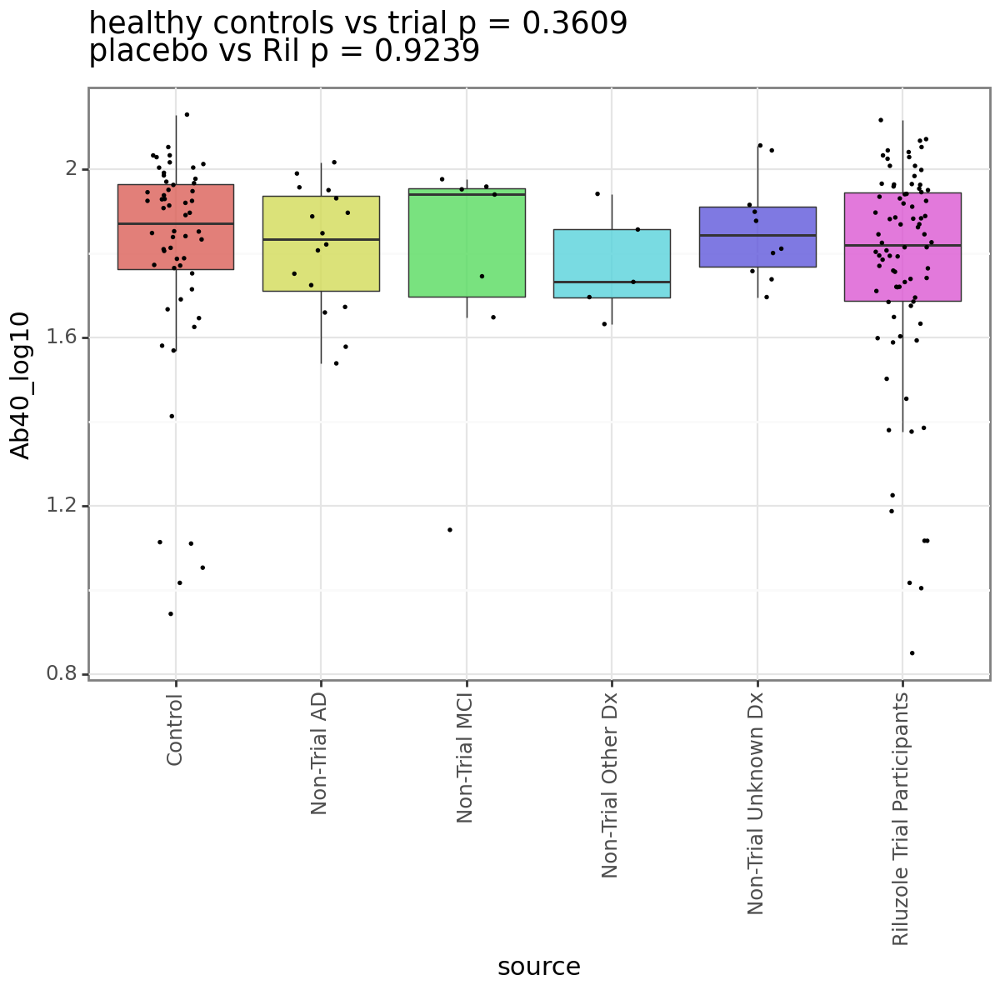

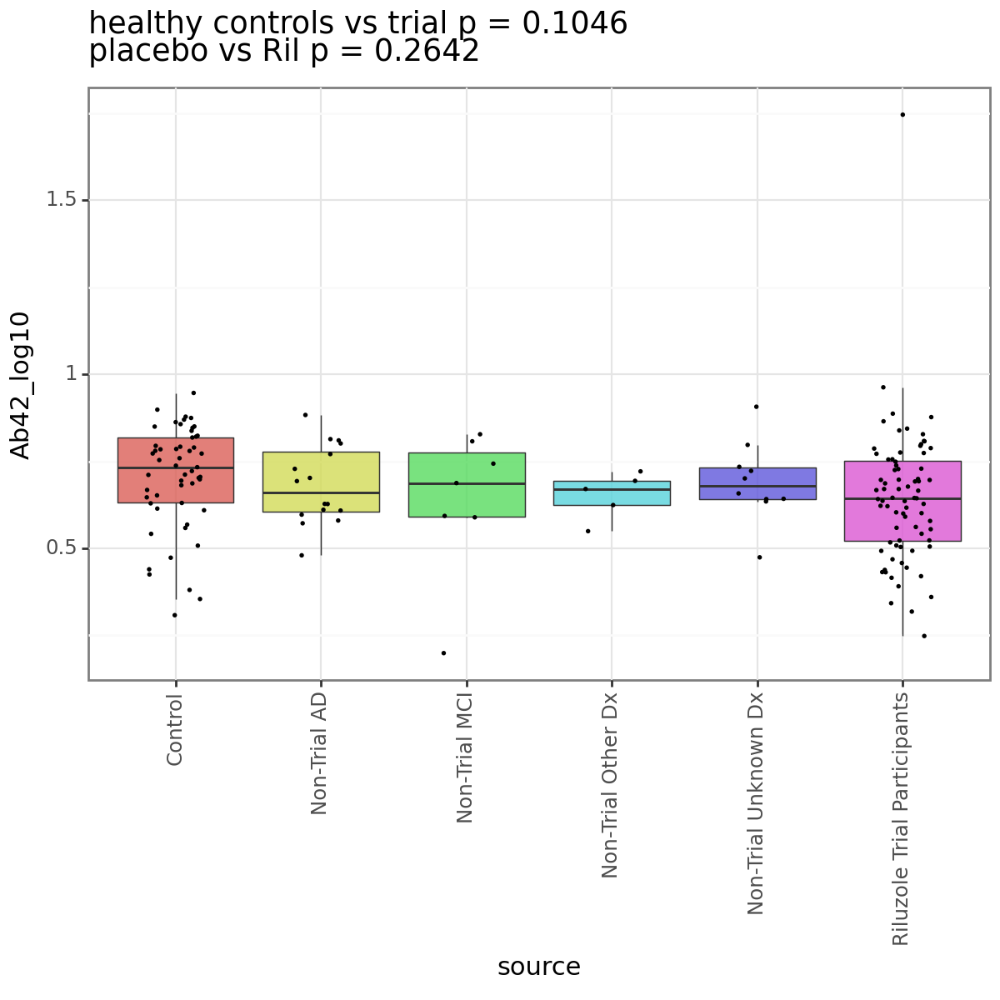

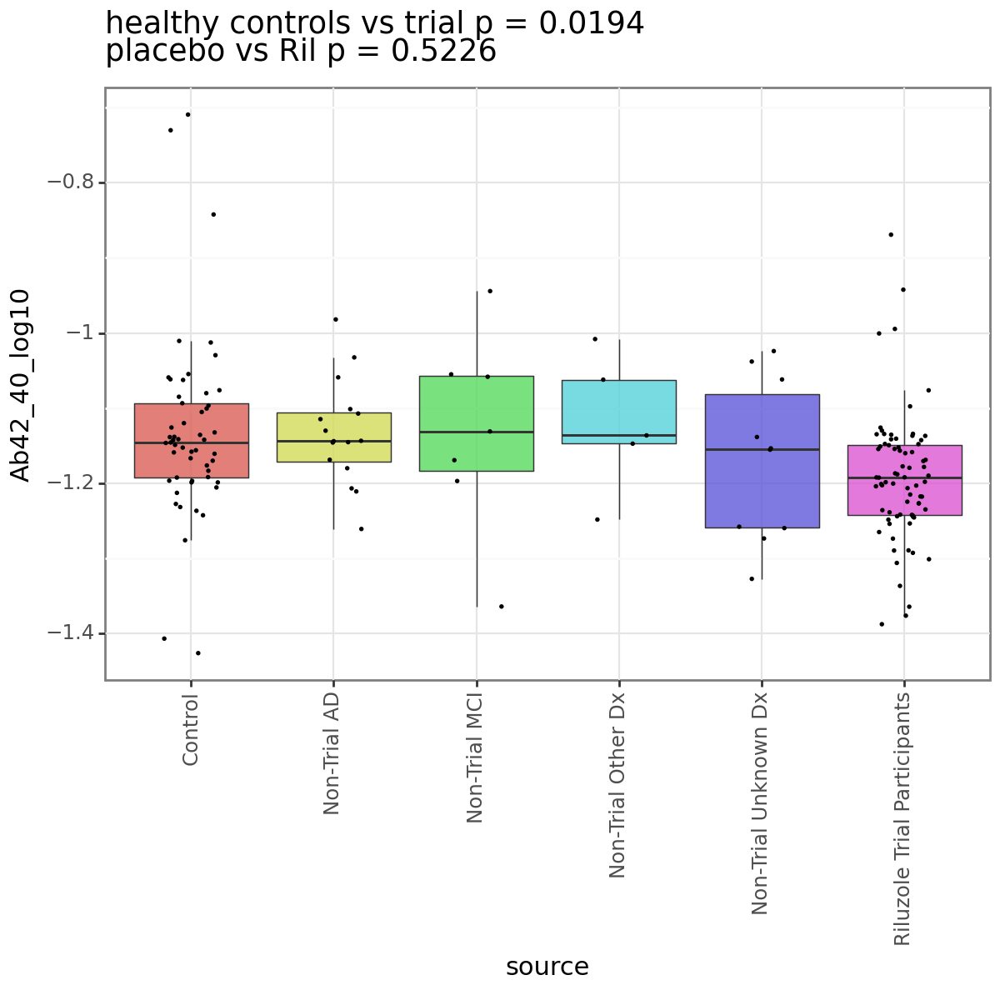

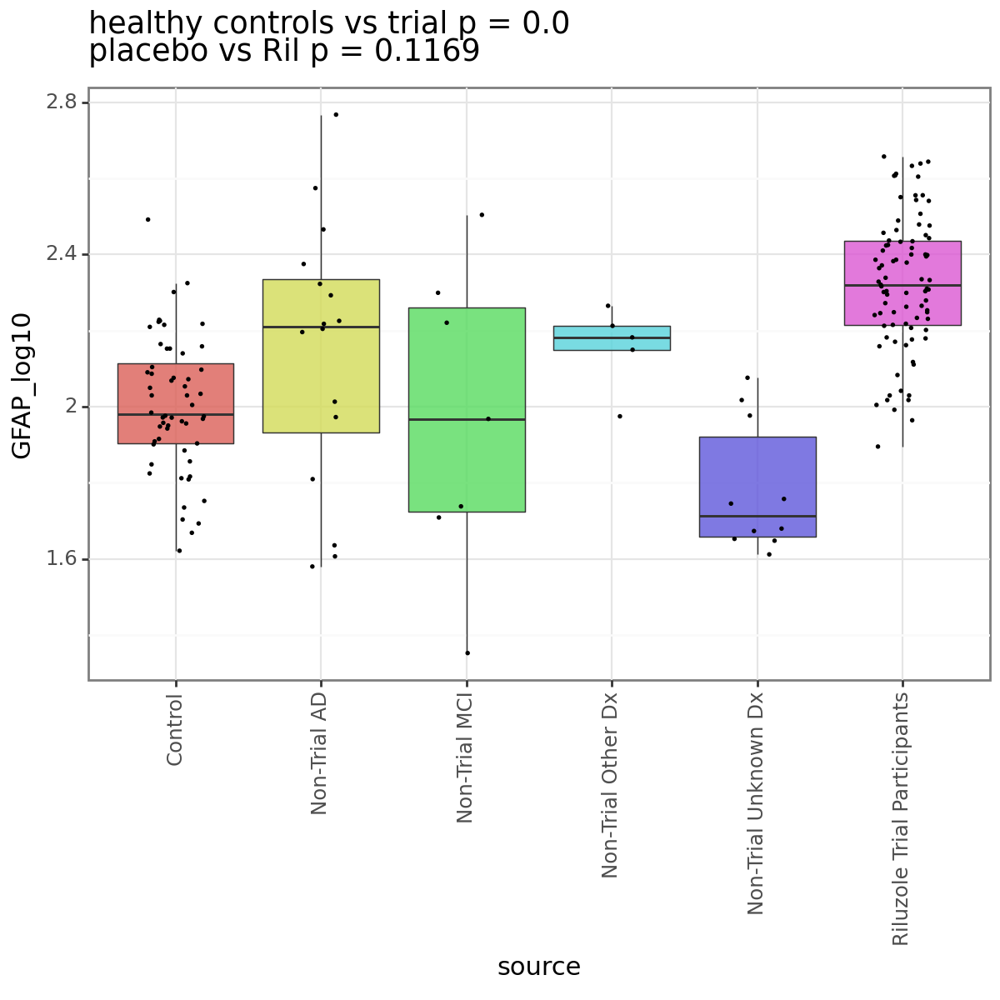

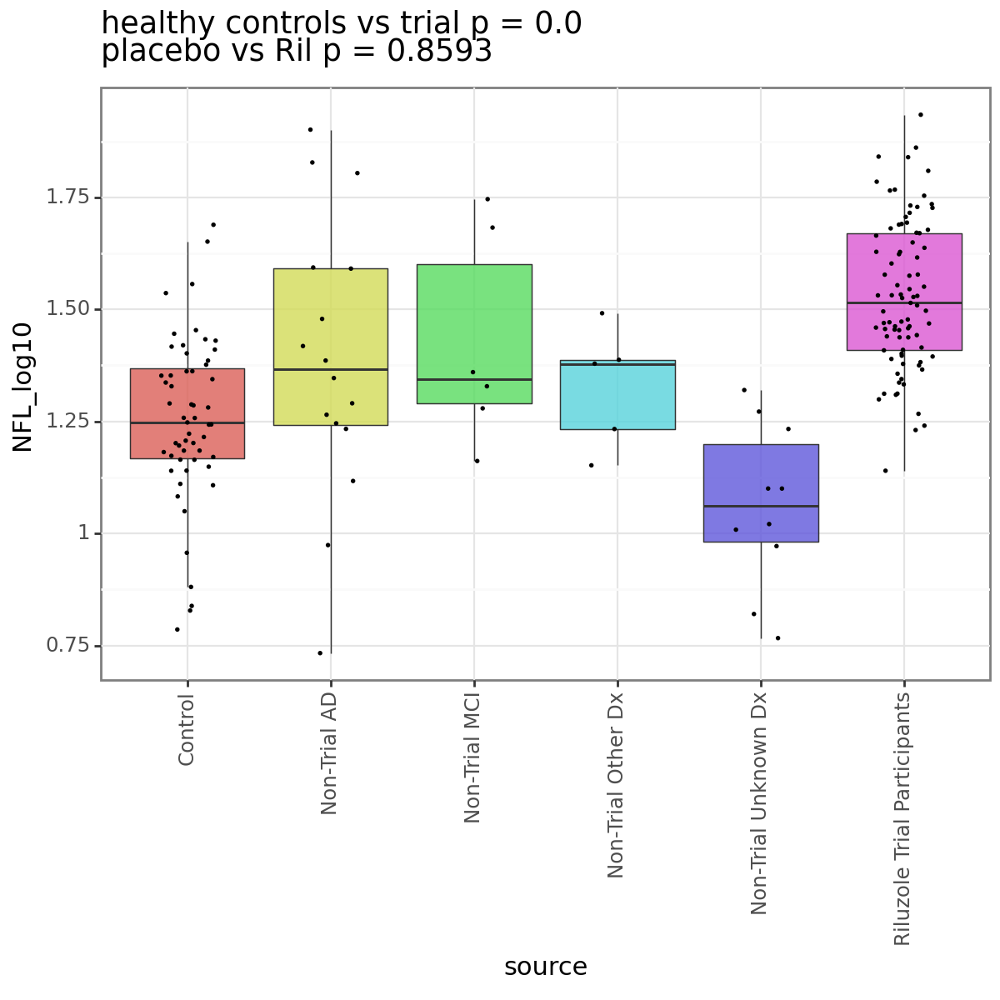

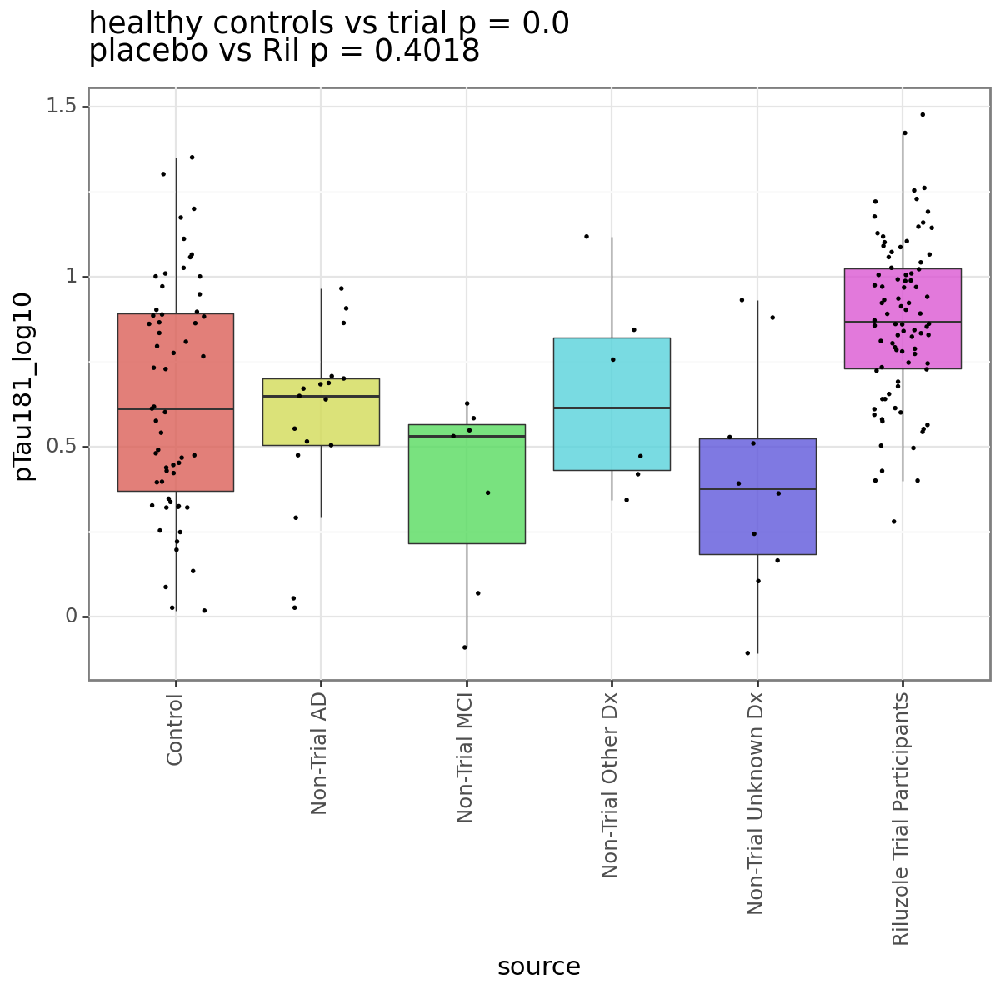

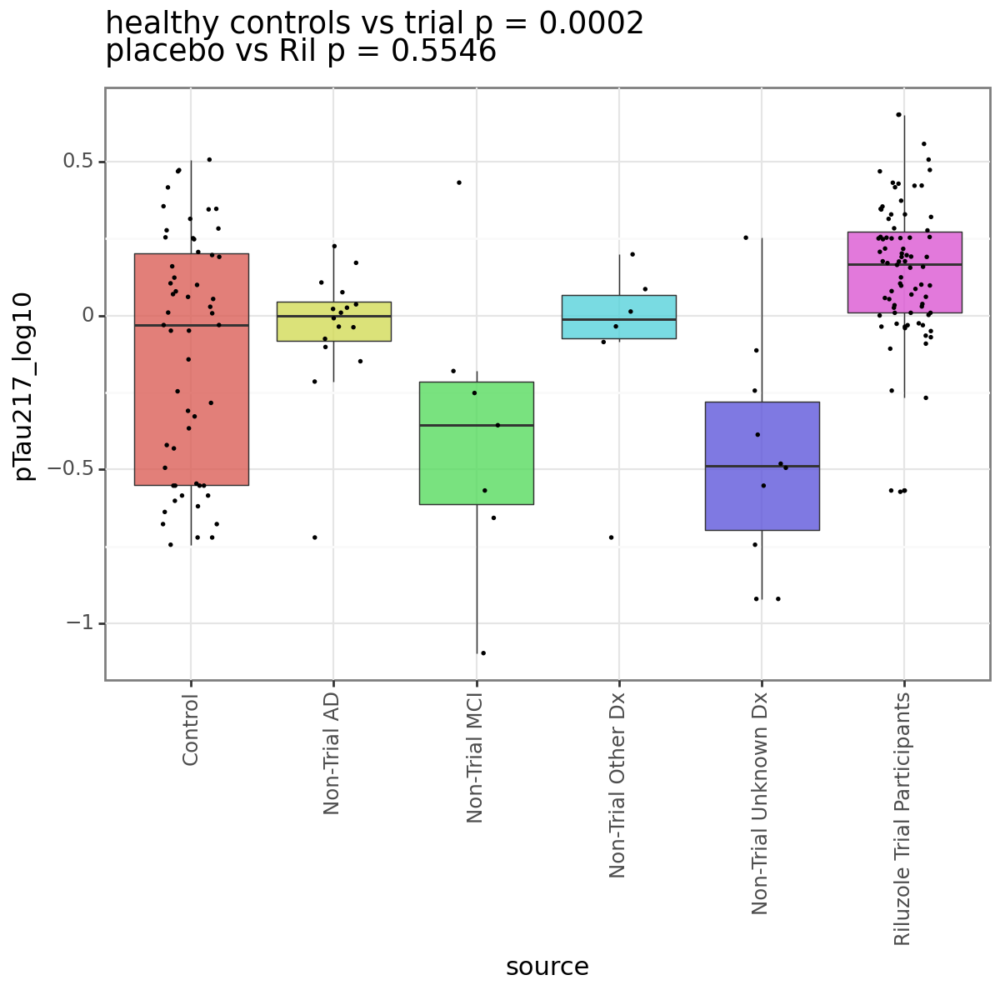

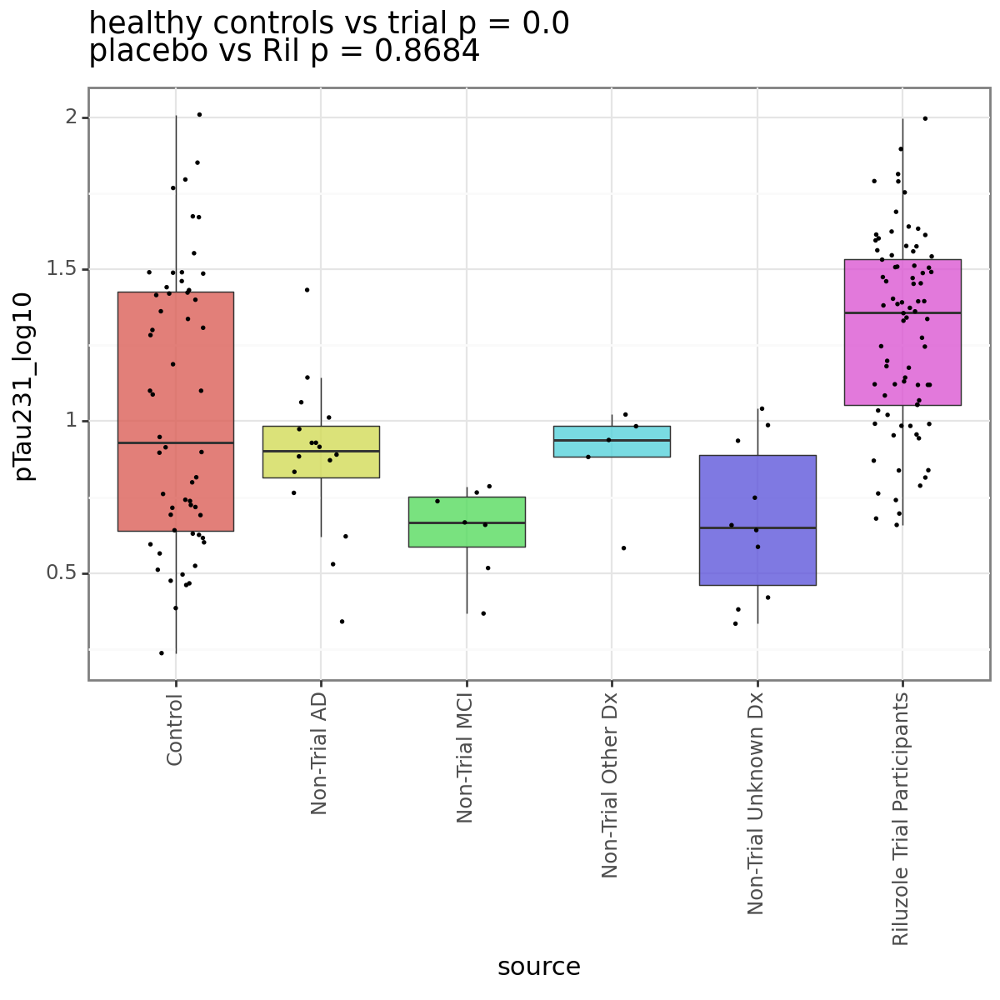

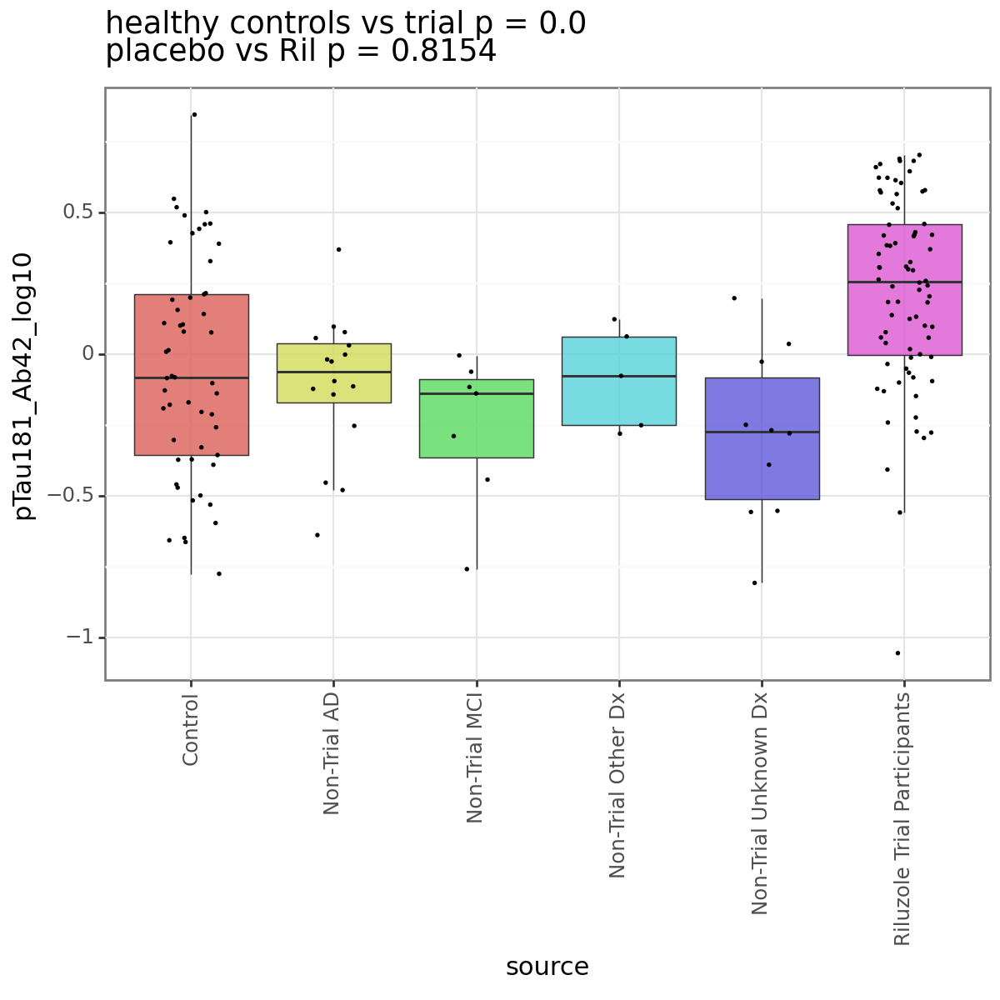

In [28]:
graphing_vars = ['source']
p9.options.figure_size = (6,6)

for var in log10_plasma_columns:
    temp_df = bl_merge[[var, 'Group2']].dropna()
    temp_df['Group2'] = temp_df['Group2'].replace({'Control':'0', 'Riluzole Trial Participants':'1'}).astype('int')
    model = smf.logit(formula ='Group2 ~ ' + var, data = temp_df).fit(disp = 0);
    controls_p = model.pvalues[var].round(4).astype('str')

    temp_df = bl_merge.loc[bl_merge['Group2'].isin(['Riluzole Trial Participants']), [var, 'Group']].dropna()
    temp_df['Group'] = temp_df['Group'].replace({'Placebo':'0', 'Riluzole':'1'}).astype('int')
    model = smf.logit(formula ='Group ~ ' + var, data = temp_df).fit(disp = 0);
    placebo_p = model.pvalues[var].round(4).astype('str')

    title = ''.join(['healthy controls vs trial p = ', controls_p, '\nplacebo vs Ril p = ', placebo_p])
    plot = (p9.ggplot(all_data[[var] + graphing_vars].dropna(), p9.aes(x = graphing_vars[0], y = var)) 
                + p9.theme_bw(base_size=11) 
                #+ p9.geom_violin(p9.aes(fill = graphing_vars[0]), alpha = 0.6, size = 0.3) 
                + p9.geom_boxplot(p9.aes(fill = graphing_vars[0]), width = 0.8, alpha = 0.8, outlier_alpha = 0, size = 0.3) 
                + p9.labs(title = title)
                + p9.geom_jitter(size = 0.1, width = 0.2, alpha = 1)
                + p9.theme(legend_position = "none", axis_text_x = p9.element_text(rotation = 90))
                )  
    print(plot)


# 2nd Pass analyses (still old)

# Distribution Plots

## Plasma

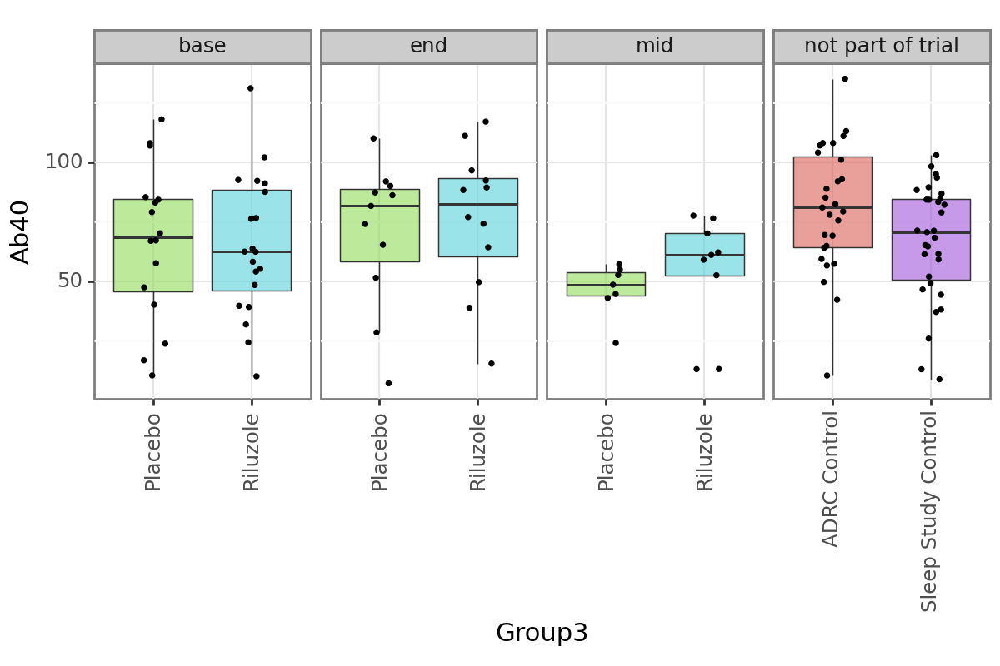

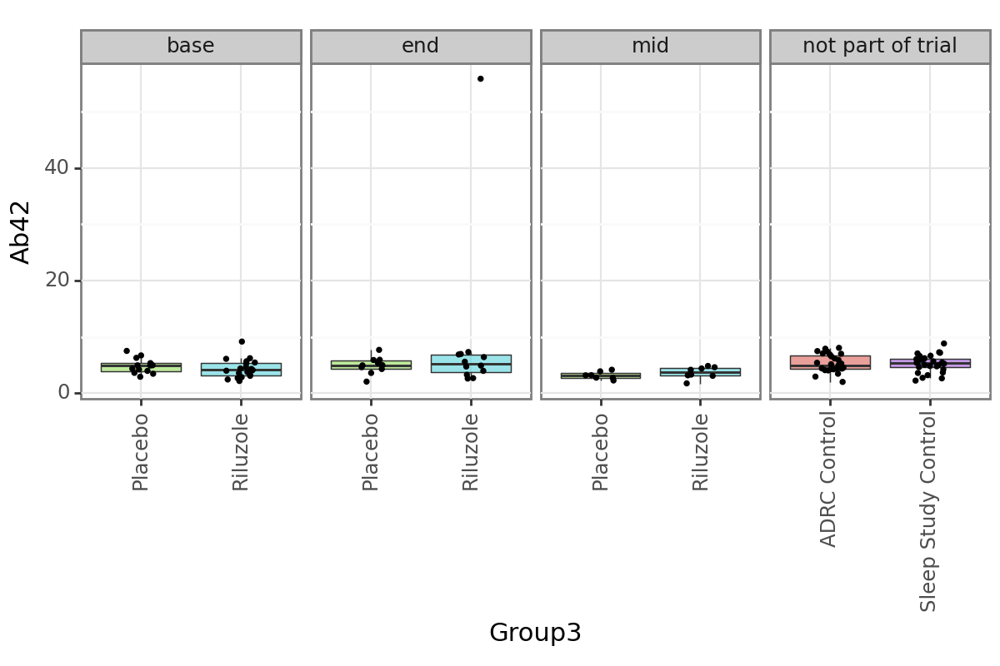

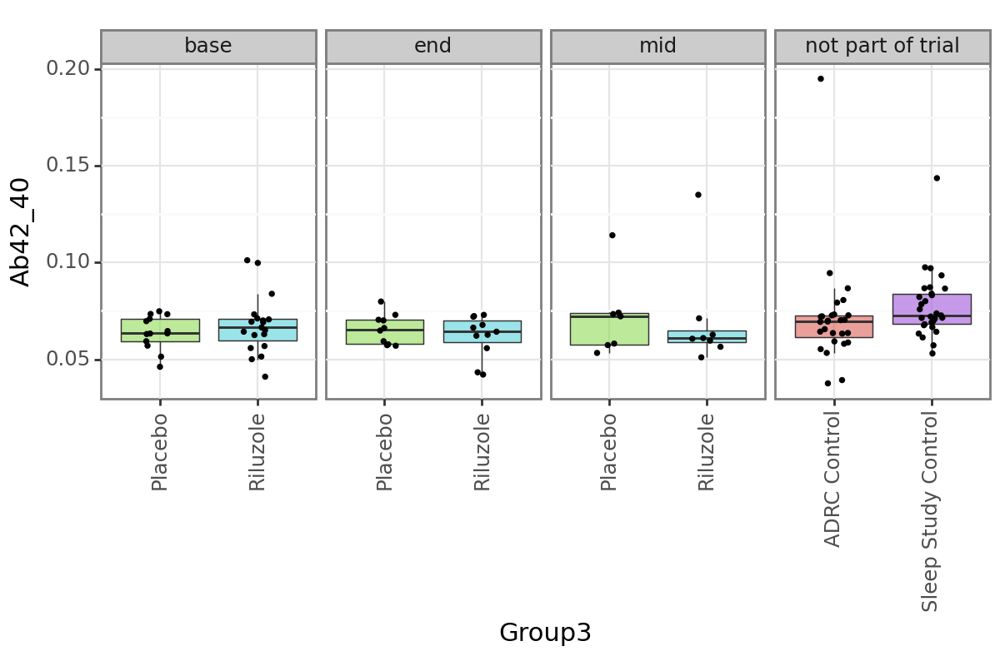

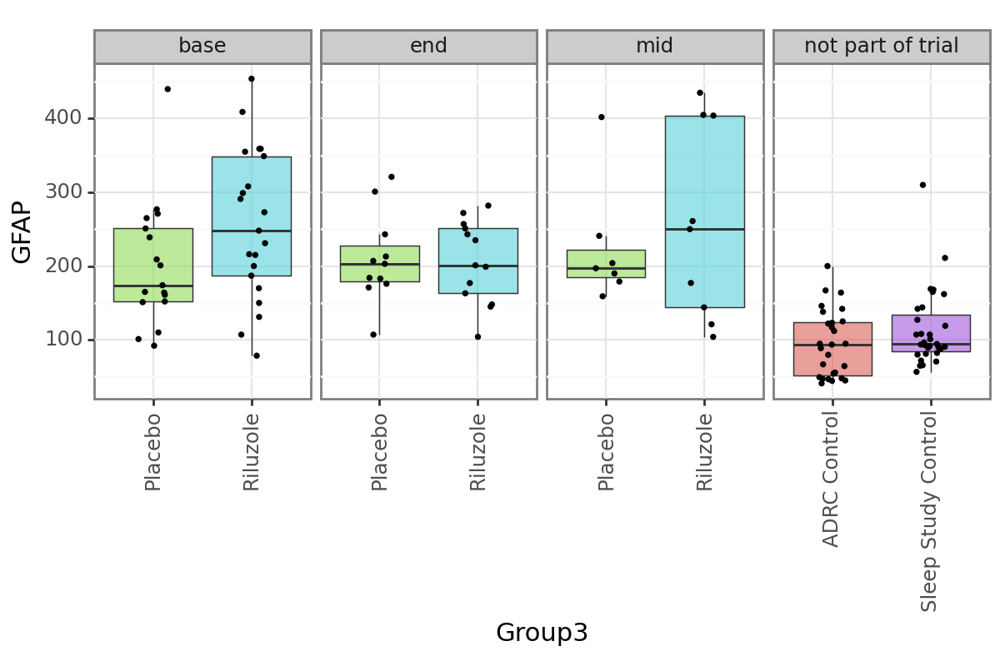

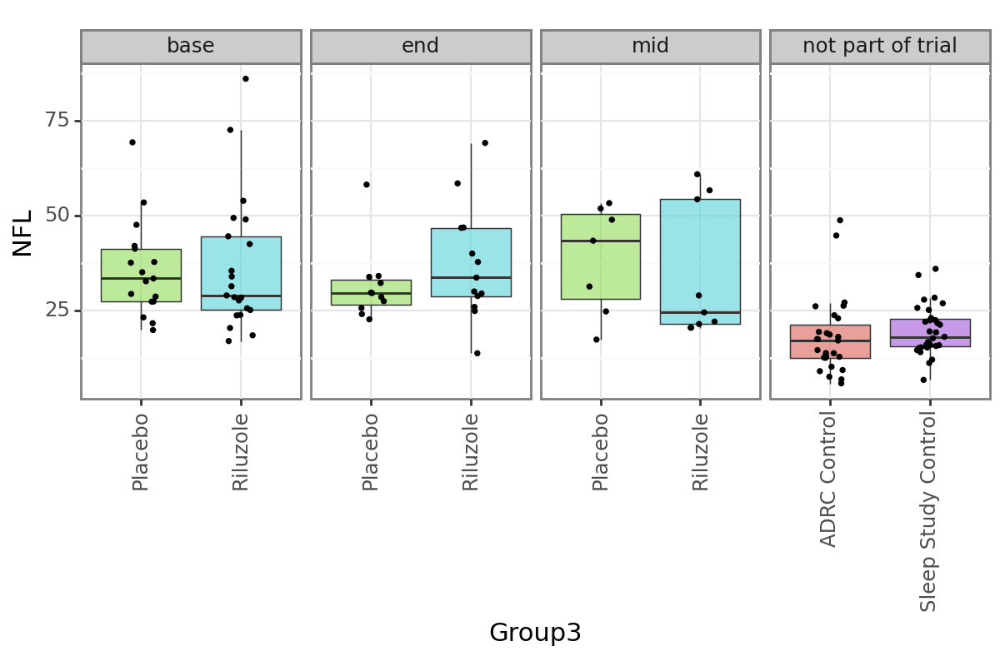

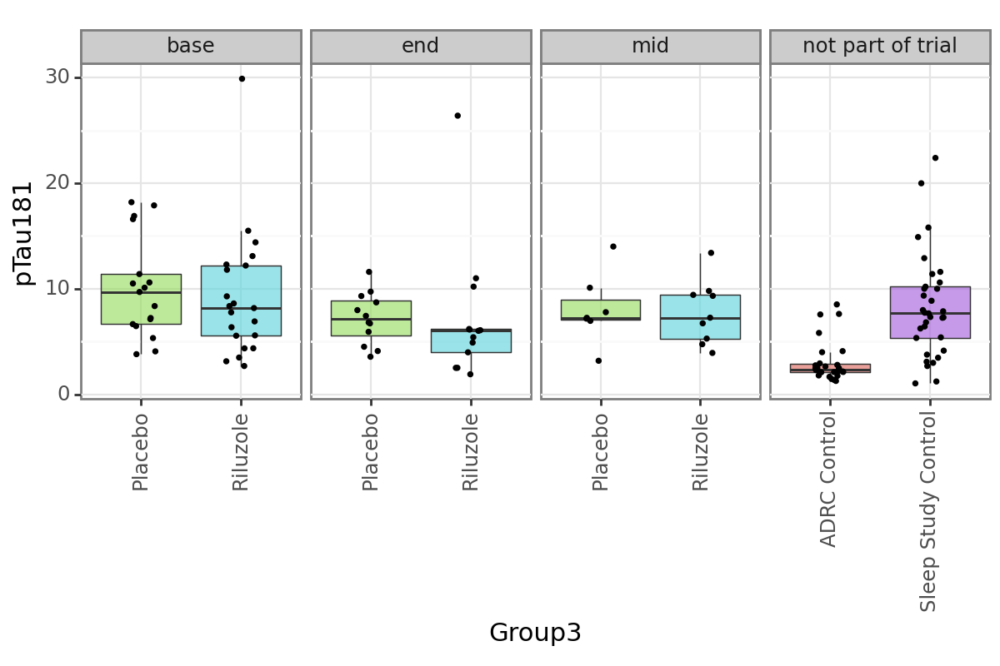

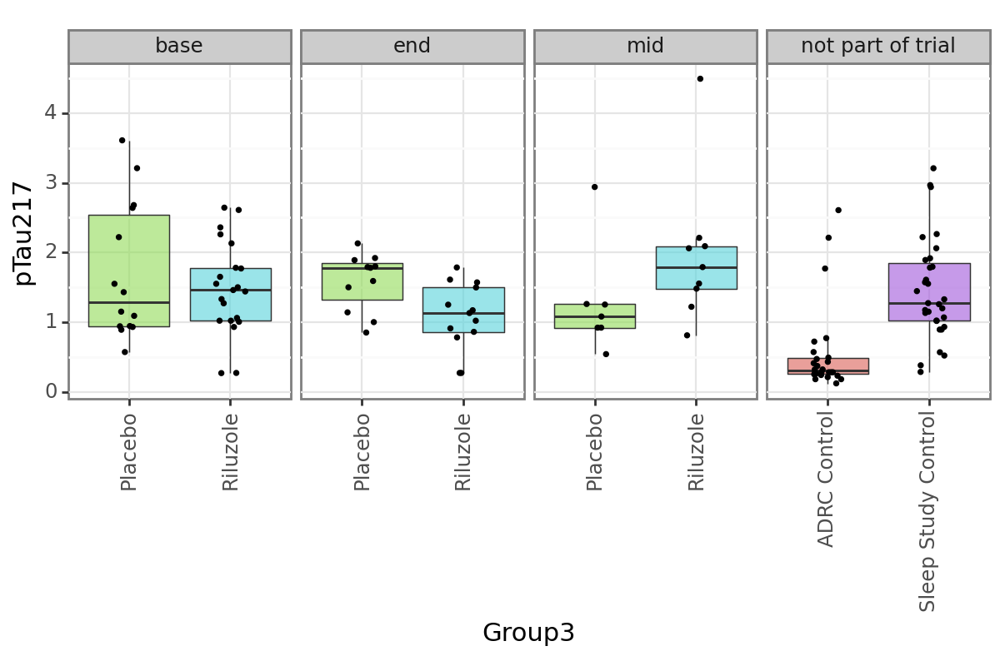

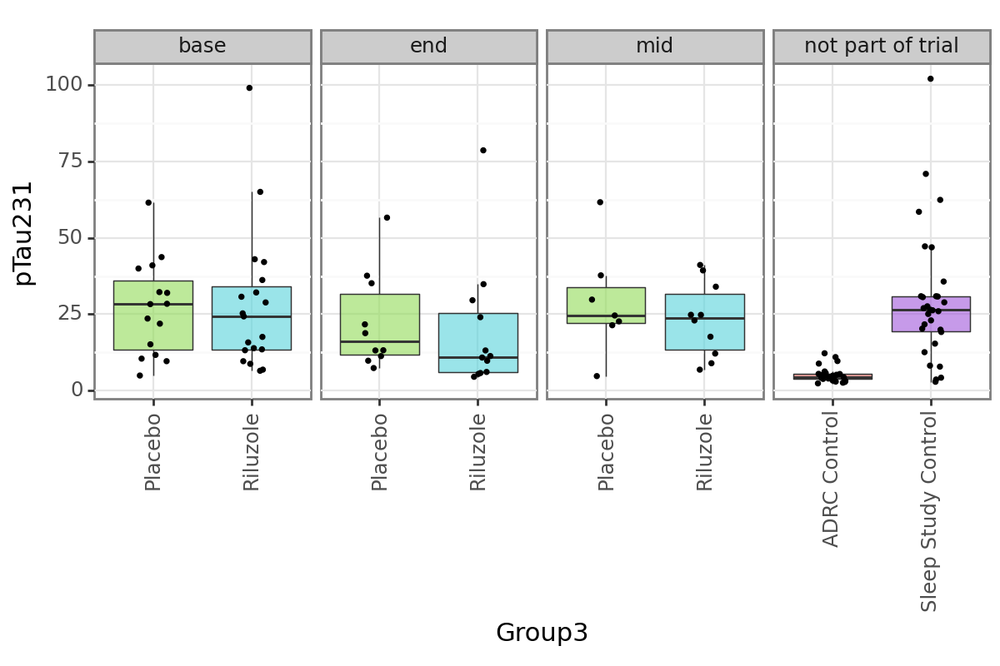

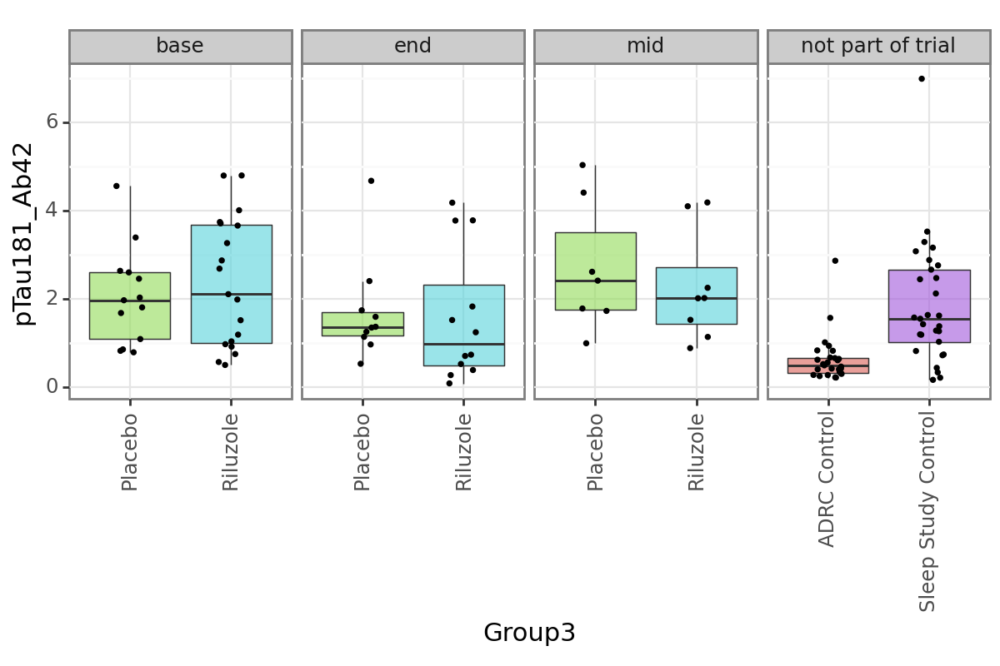

In [29]:
graphing_vars = ['Group3']
p9.options.figure_size = (6,4)  

for var in plasma_columns:
    temp_df = all_data.dropna(subset = [var] + graphing_vars)
    temp_df
    plot = (p9.ggplot(temp_df, p9.aes(x = graphing_vars[0], y = var)) 
                + p9.theme_bw(base_size = 11) 
                #+ p9.geom_violin(p9.aes(fill = graphing_vars[0]), alpha = 0.8, size = 0.3) 
                + p9.geom_boxplot(p9.aes(fill = graphing_vars[0]), width = 0.8, alpha = 0.6, outlier_alpha = 0, size = 0.3) 
                + p9.geom_jitter(size = 0.5, width = 0.15)
                + p9.theme(legend_position = "none", axis_text_x = p9.element_text(rotation = 90), plot_title = p9.element_text(size = 10), plot_subtitle = p9.element_text(size = 8))
                + p9.facet_grid('~timepoint', scales='free_x')
                )  
    print(plot)

## Volumetric

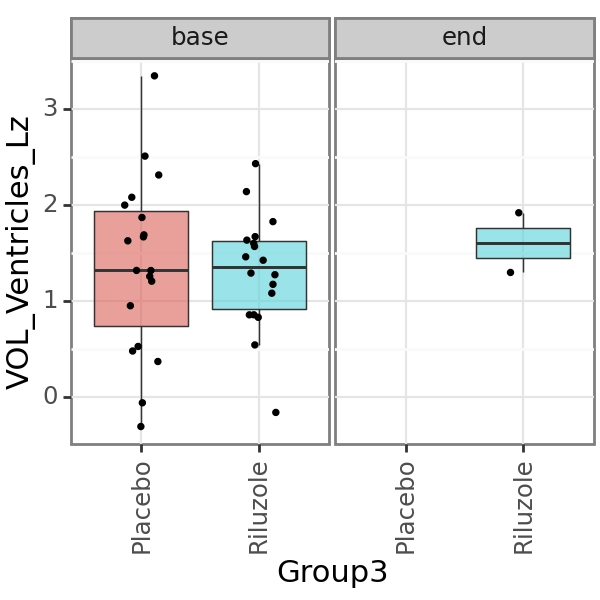

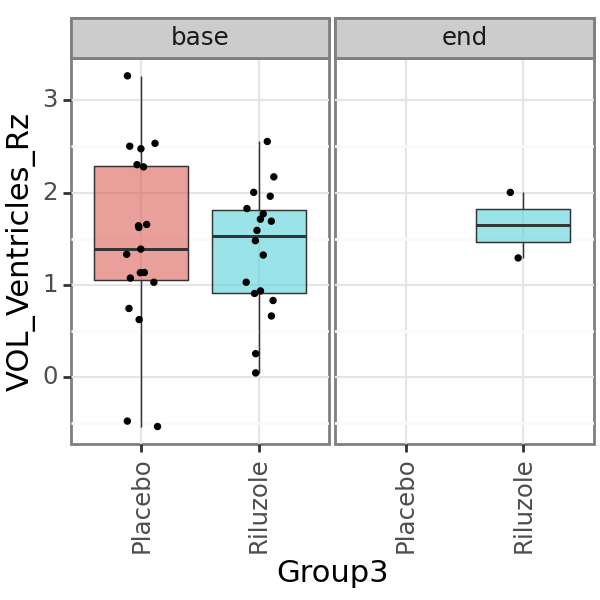

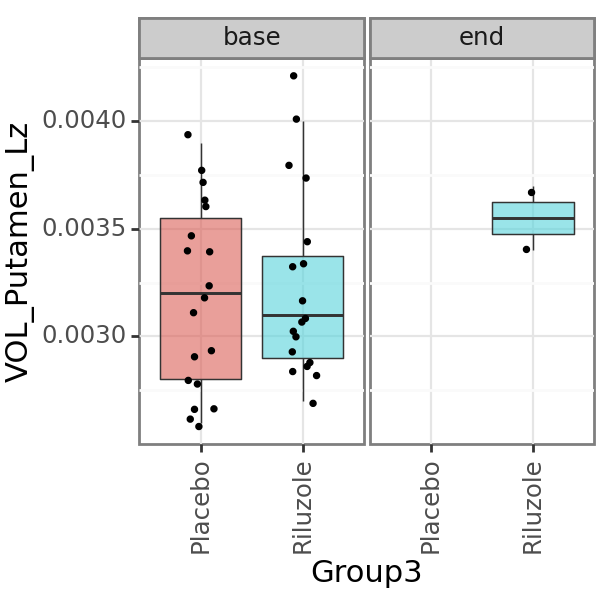

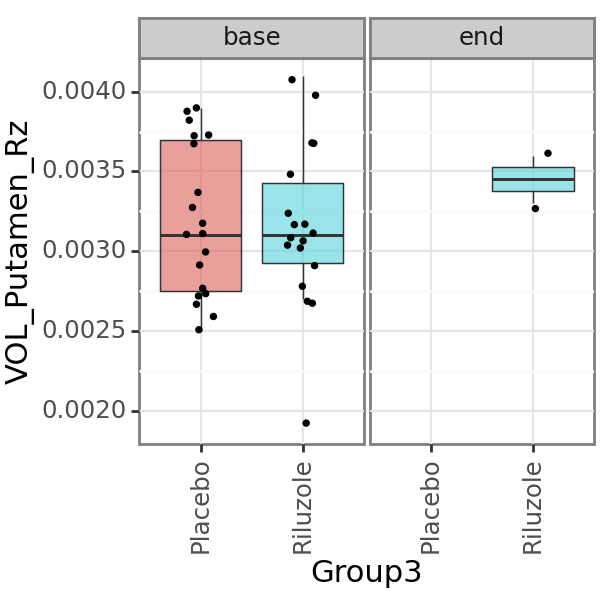

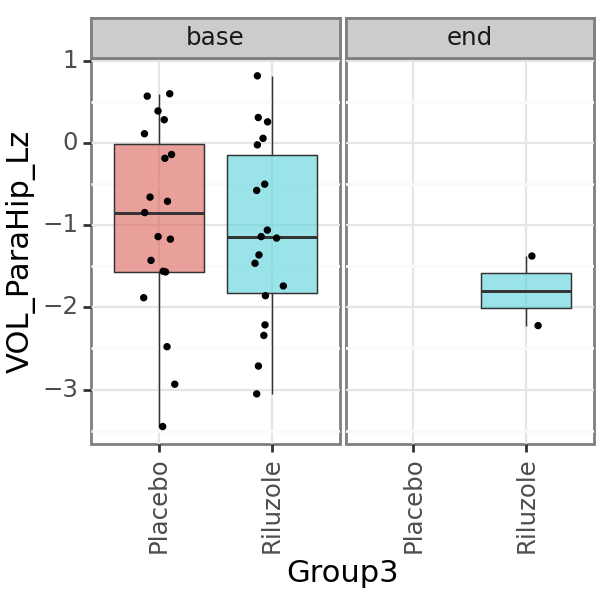

...

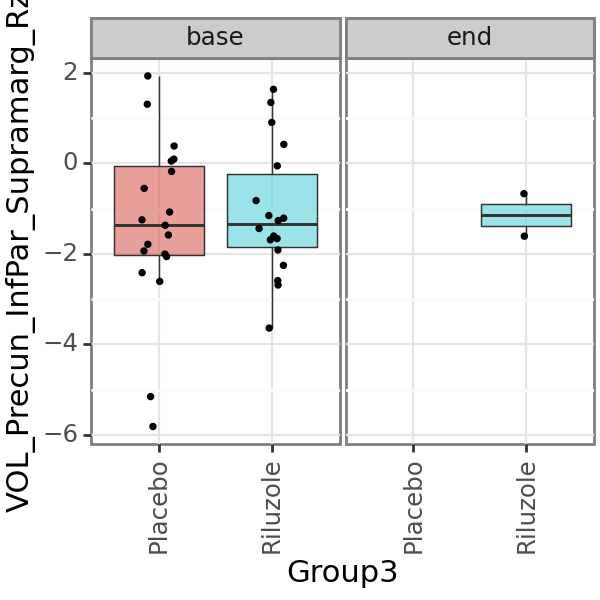

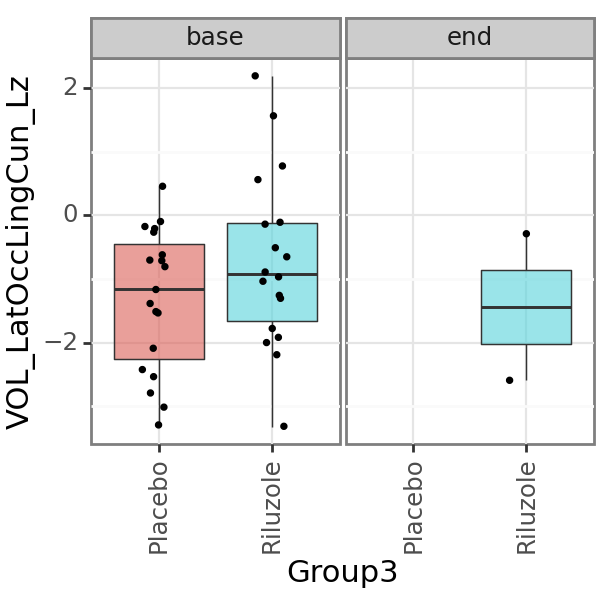

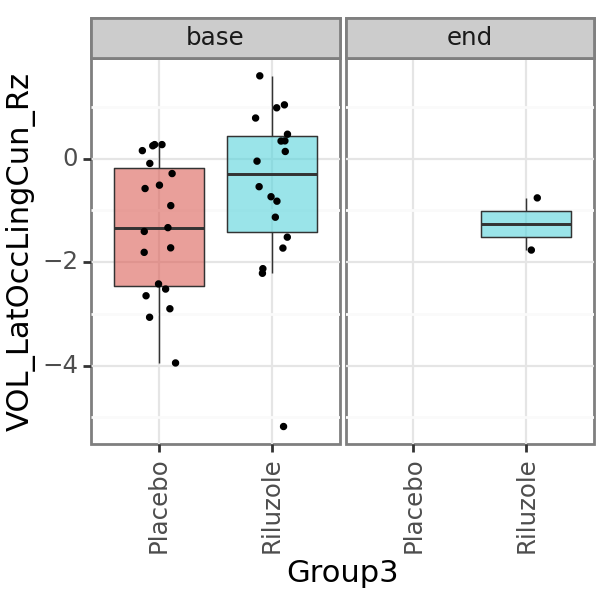

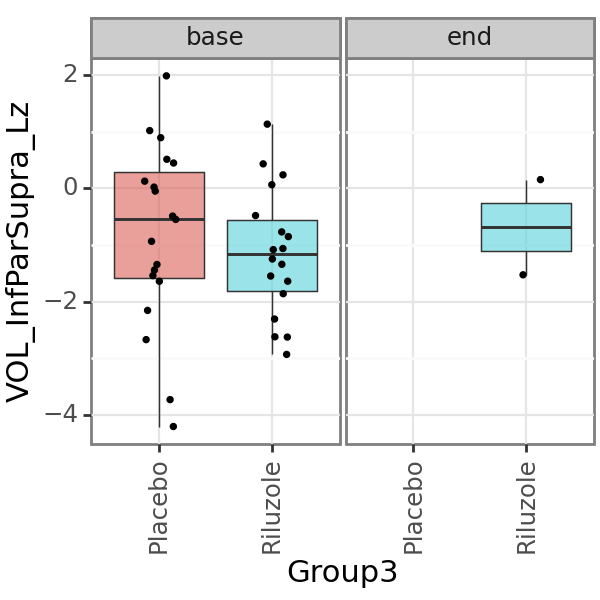

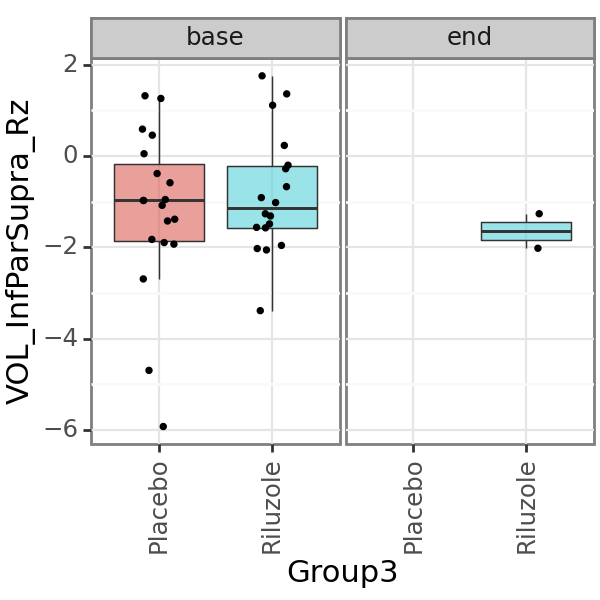

In [30]:
p9.options.figure_size = (3,3)  

graphing_vars = ['Group3']

for var in vol_columns:
    temp_df = all_data.dropna(subset = [var] + graphing_vars)
    temp_df
    plot = (p9.ggplot(temp_df, p9.aes(x = graphing_vars[0], y = var)) 
                + p9.theme_bw(base_size = 11) 
                #+ p9.geom_violin(p9.aes(fill = graphing_vars[0]), alpha = 0.8, size = 0.3) 
                + p9.geom_boxplot(p9.aes(fill = graphing_vars[0]), width = 0.8, alpha = 0.6, outlier_alpha = 0, size = 0.3) 
                + p9.geom_jitter(size = 0.5, width = 0.15)
                + p9.theme(legend_position = "none", axis_text_x = p9.element_text(rotation = 90), plot_title = p9.element_text(size = 10), plot_subtitle = p9.element_text(size = 8))
                + p9.facet_grid('~timepoint')
                )  
    print(plot)

## Cognitive

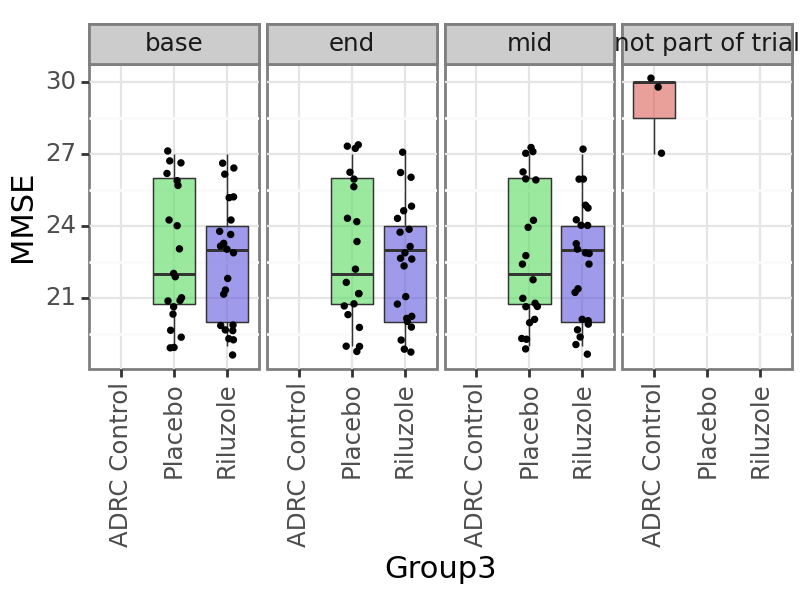

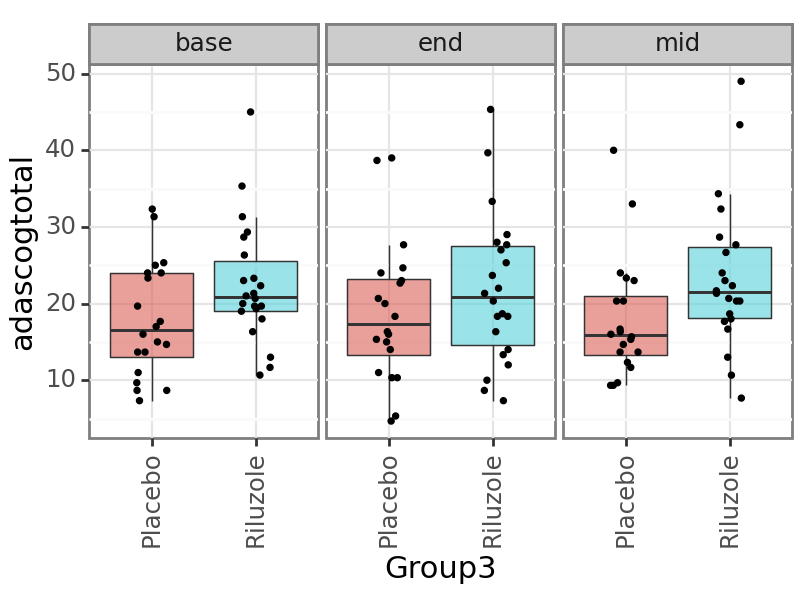

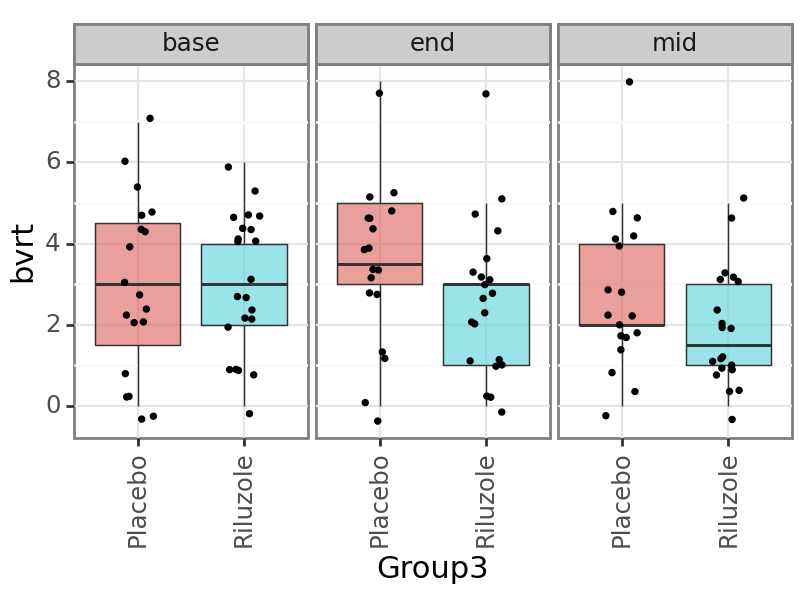

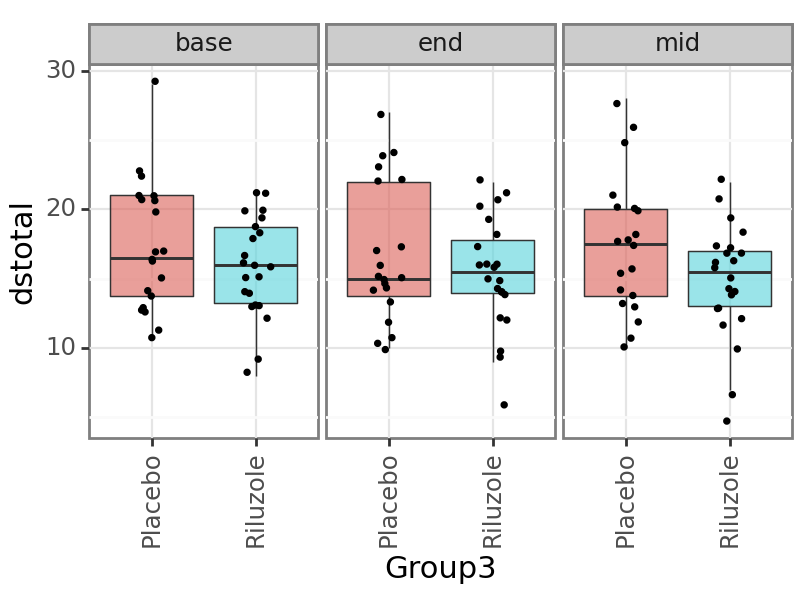

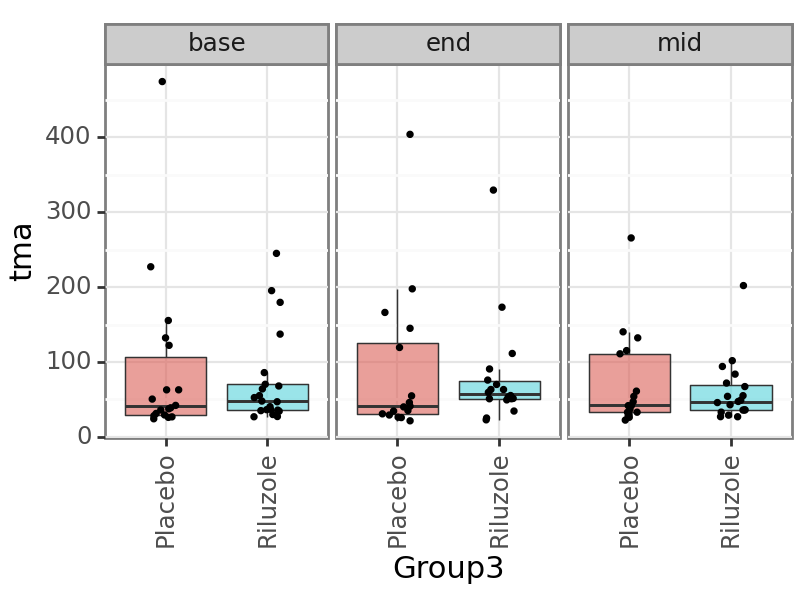

...

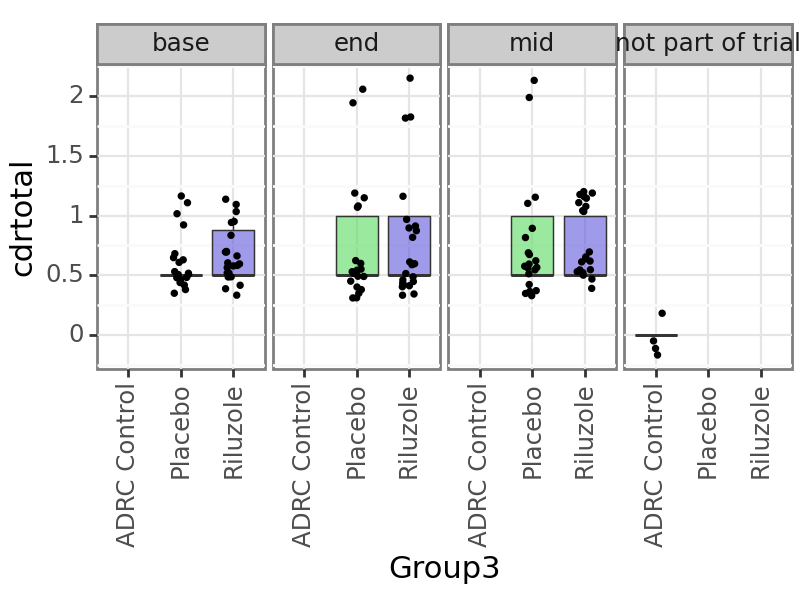

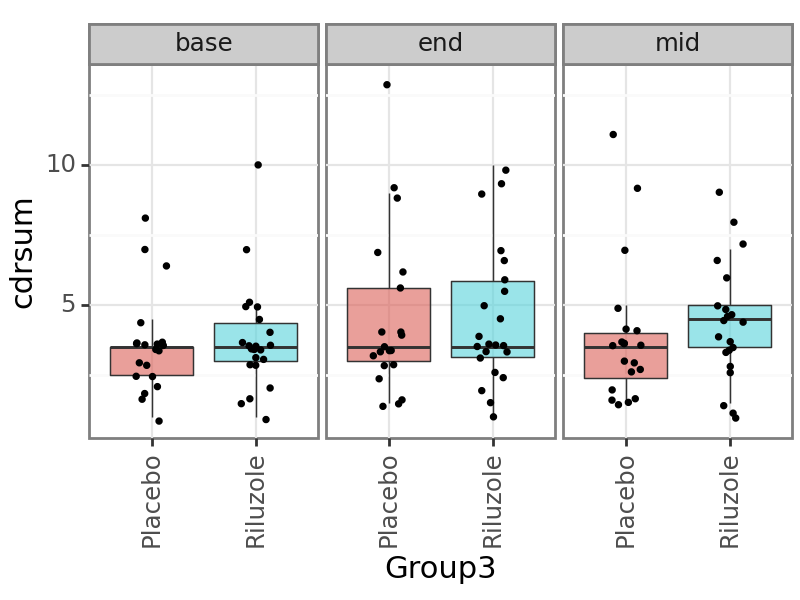

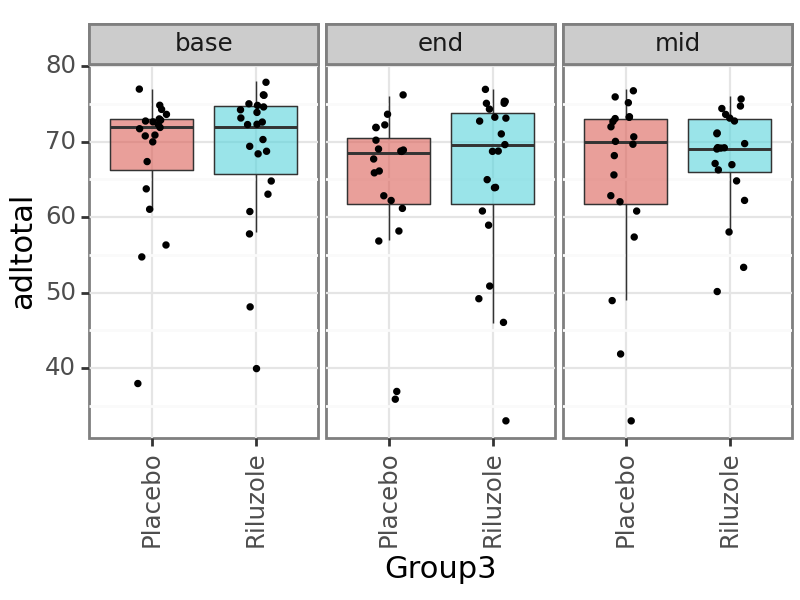

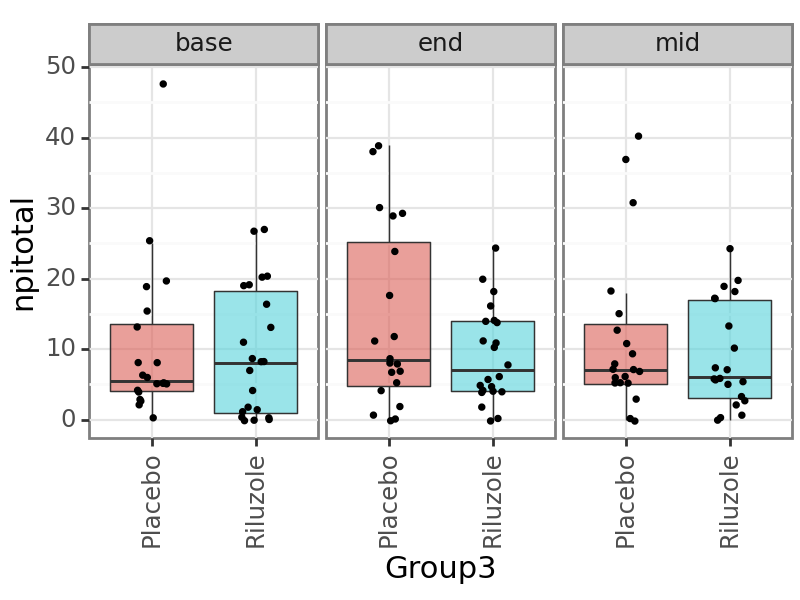

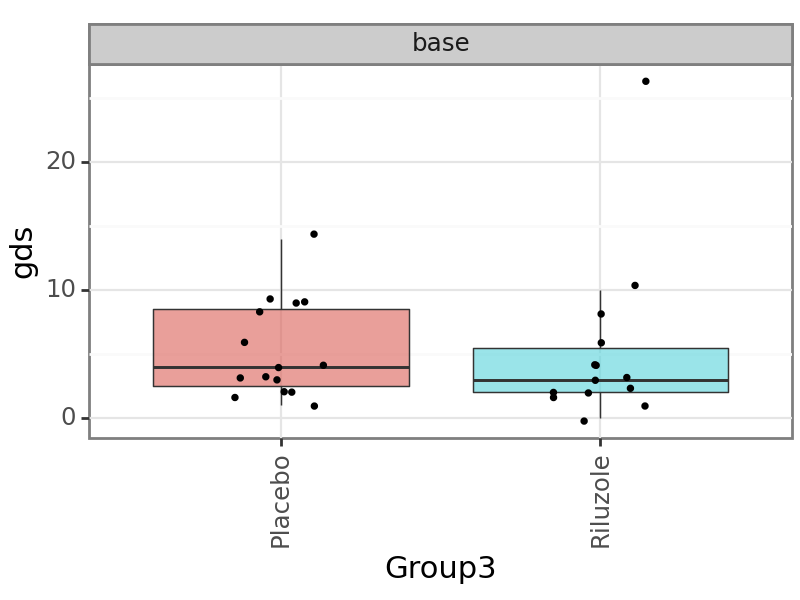

In [31]:
p9.options.figure_size = (4,3)  

graphing_vars = ['Group3']

for var in cog_columns:
    temp_df = all_data.dropna(subset = [var] + graphing_vars)
    temp_df
    plot = (p9.ggplot(temp_df, p9.aes(x = graphing_vars[0], y = var)) 
                + p9.theme_bw(base_size = 11) 
                #+ p9.geom_violin(p9.aes(fill = graphing_vars[0]), alpha = 0.8, size = 0.3) 
                + p9.geom_boxplot(p9.aes(fill = graphing_vars[0]), width = 0.8, alpha = 0.6, outlier_alpha = 0, size = 0.3) 
                + p9.geom_jitter(size = 0.5, width = 0.15)
                + p9.theme(legend_position = "none", axis_text_x = p9.element_text(rotation = 90), plot_title = p9.element_text(size = 10), plot_subtitle = p9.element_text(size = 8))
                + p9.facet_grid('~timepoint')
                )  
    print(plot)

# All data by age

## plasma

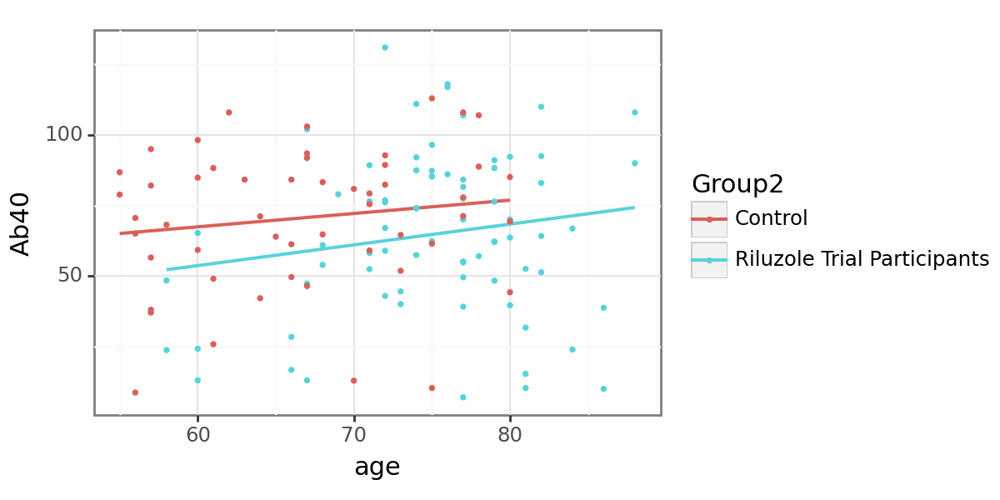

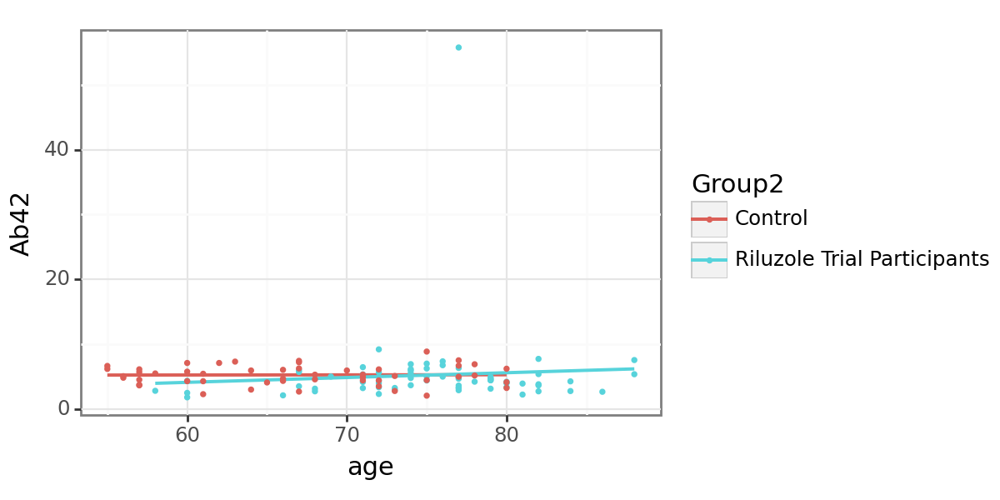

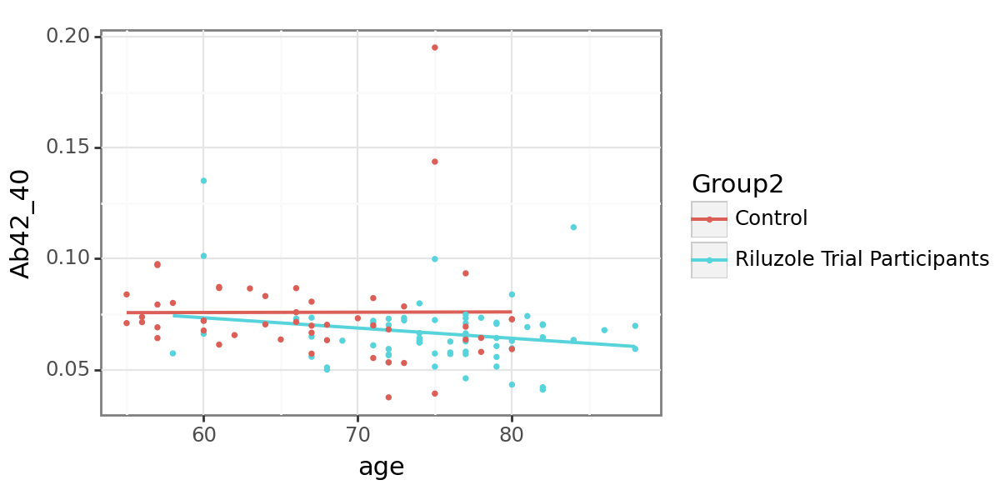

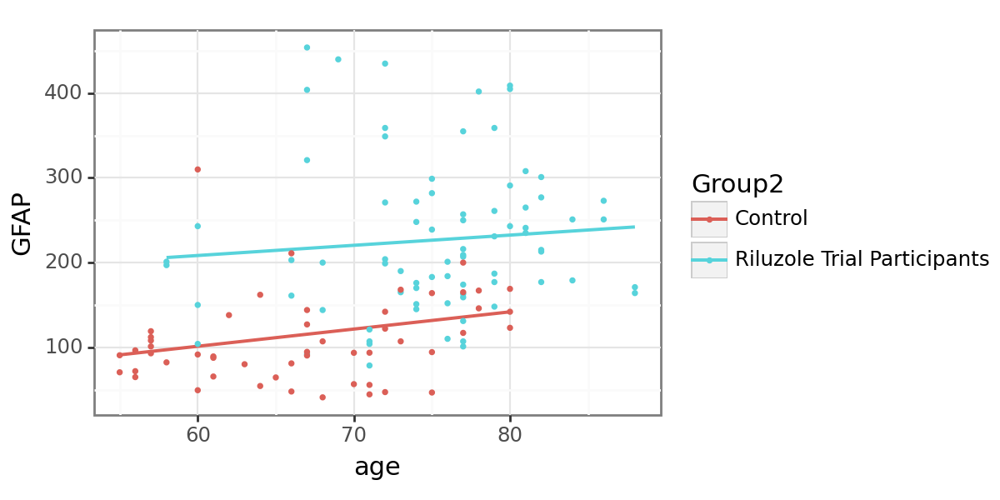

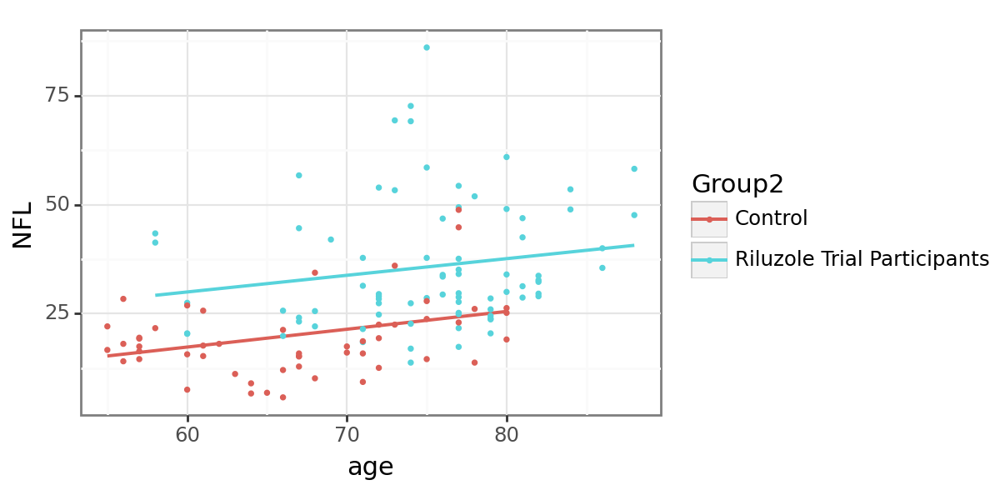

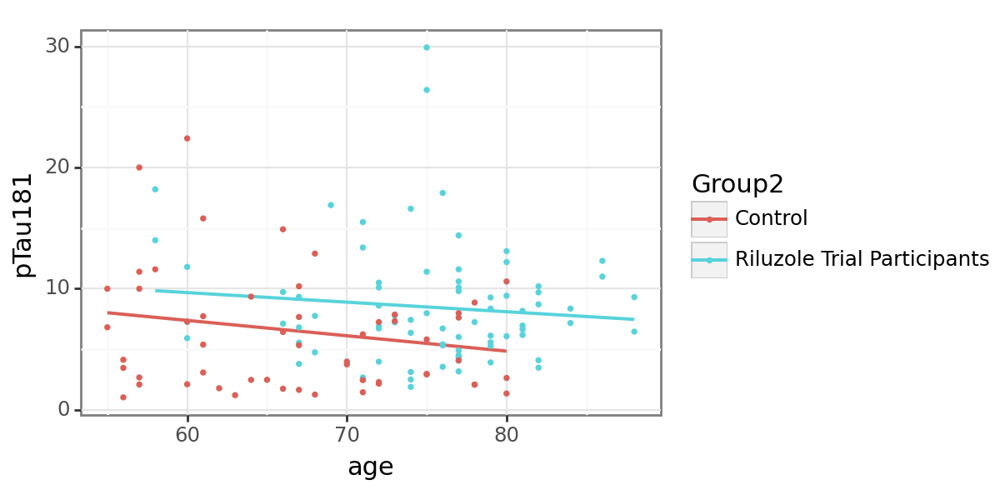

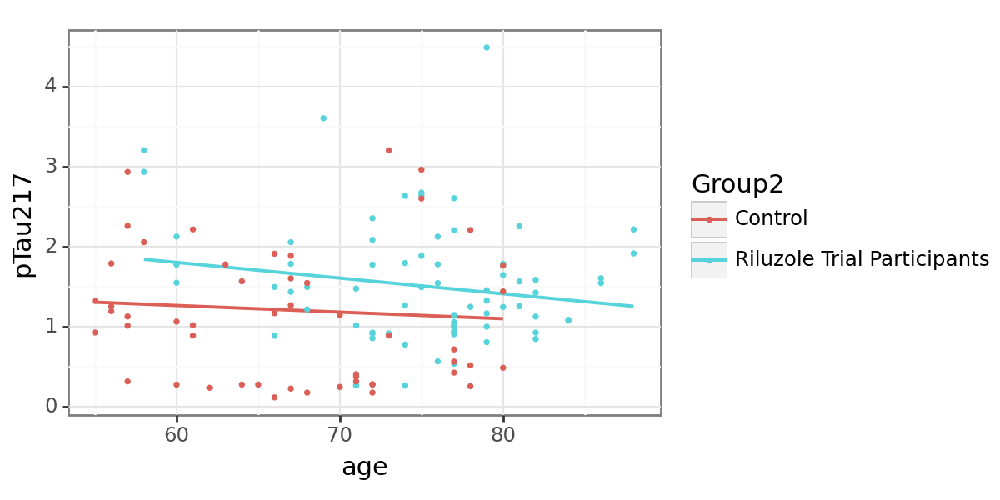

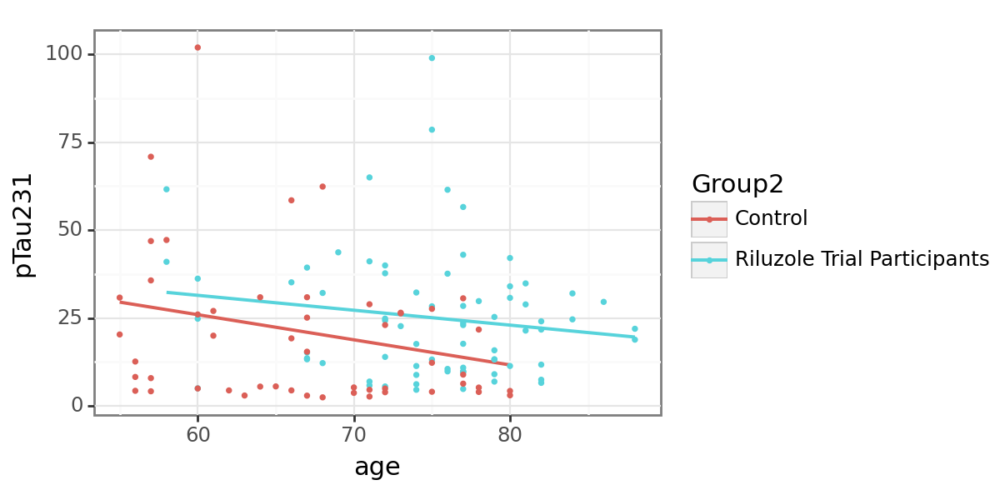

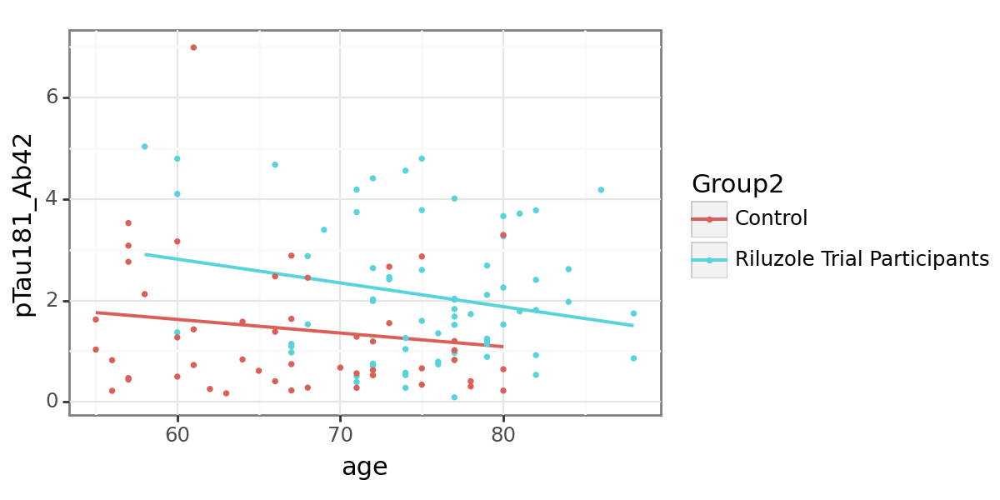

In [32]:
p9.options.figure_size = (6,3)
for var in plasma_columns:
    subset_data = all_data.dropna(subset = [var,'age', 'Group3'])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('source', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, method = 'lm')
            + p9.geom_point(size = 0.5)
    )
    print(plot)

## Volumetric

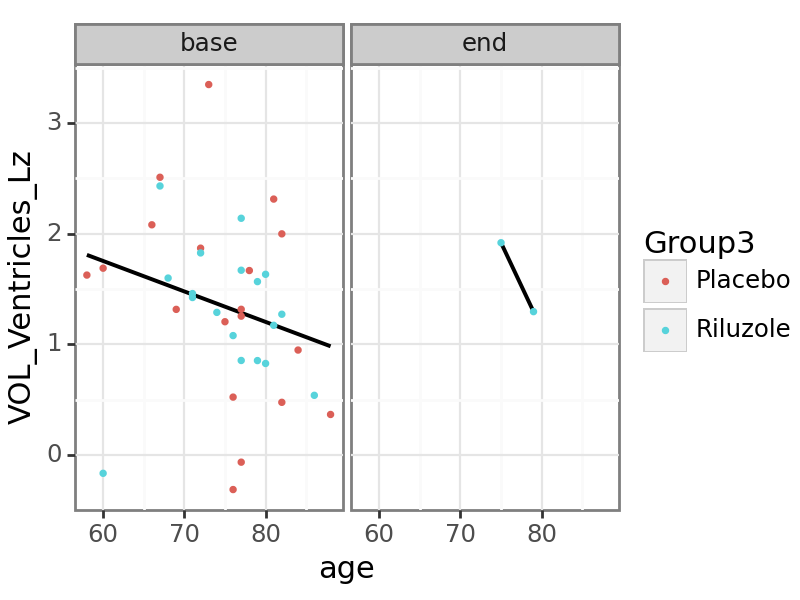

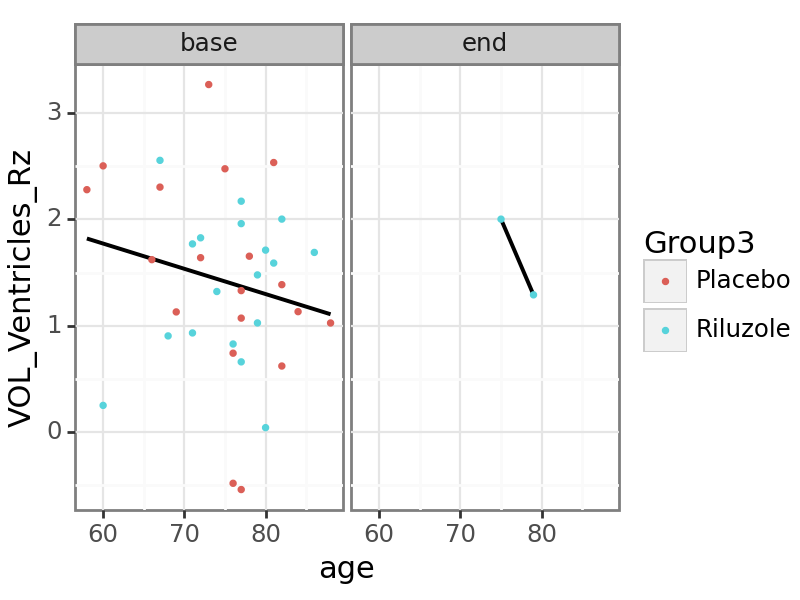

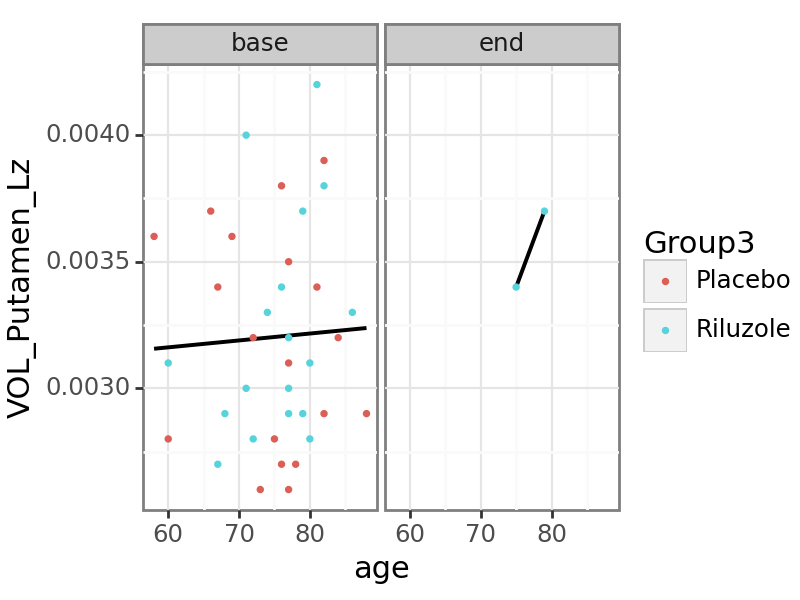

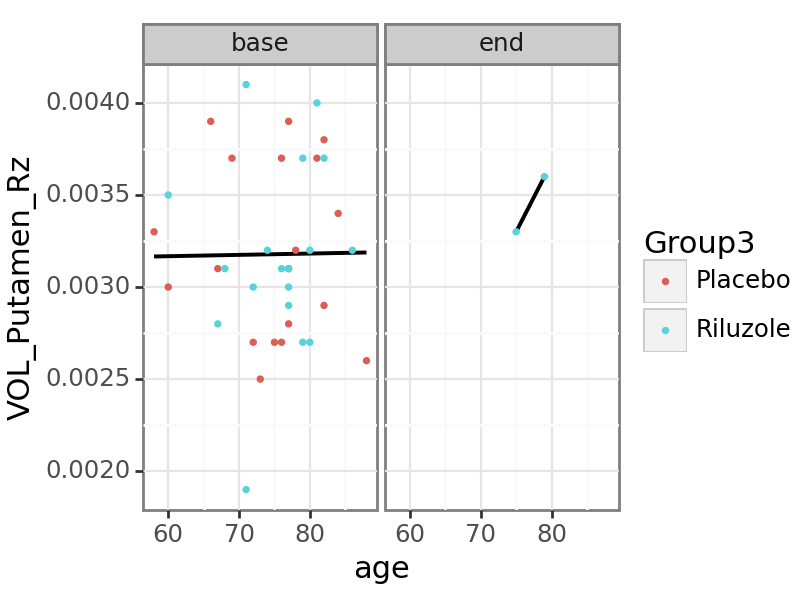

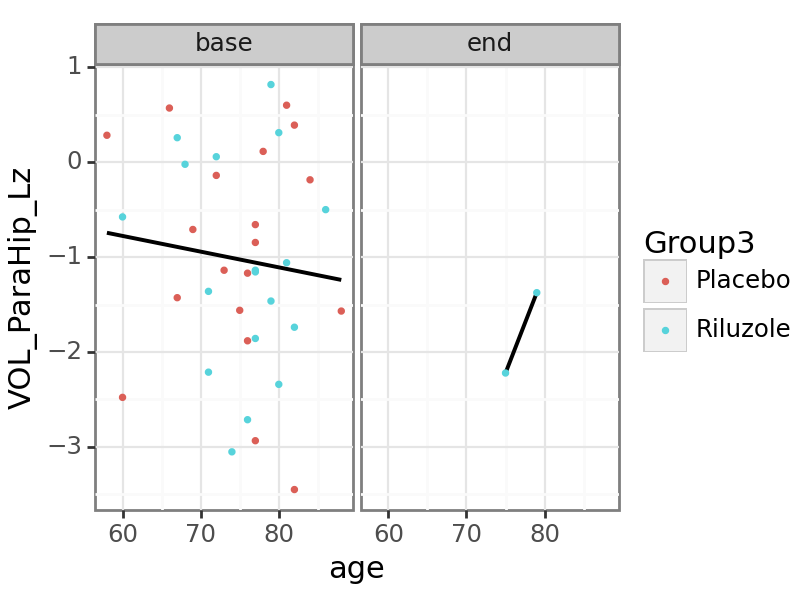

...

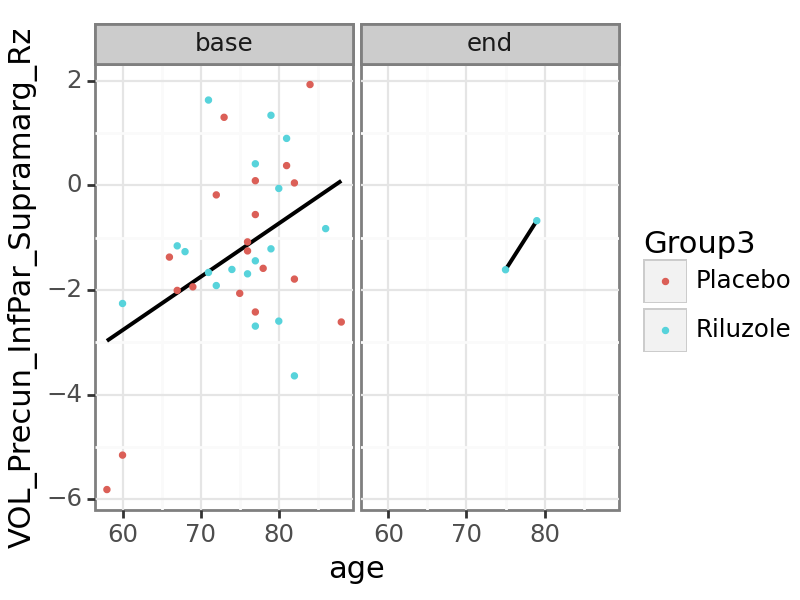

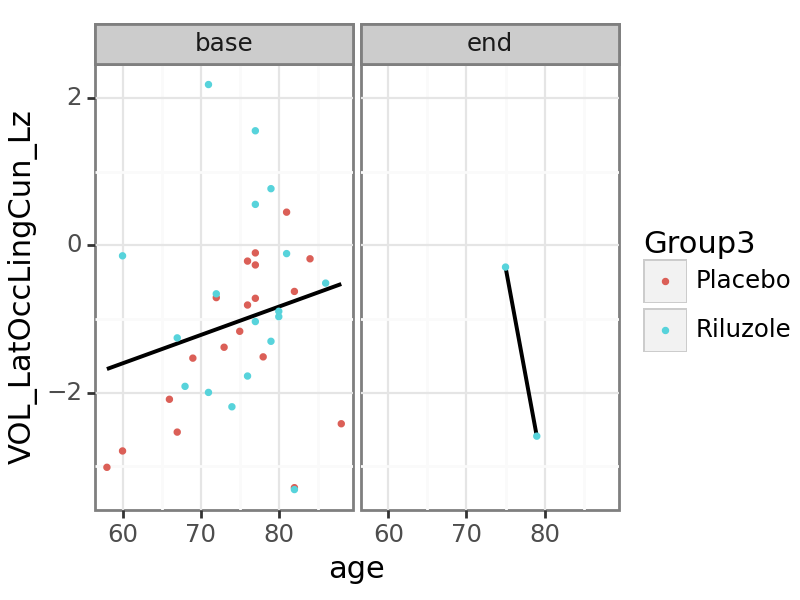

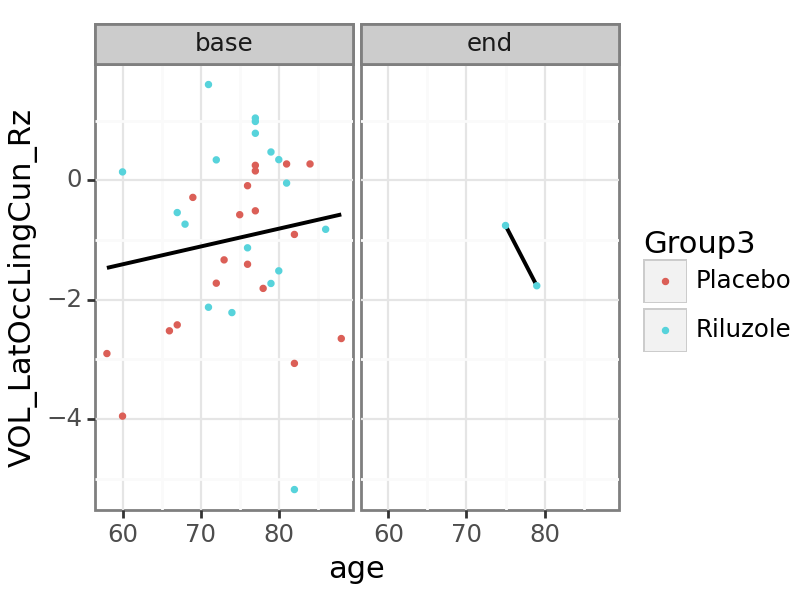

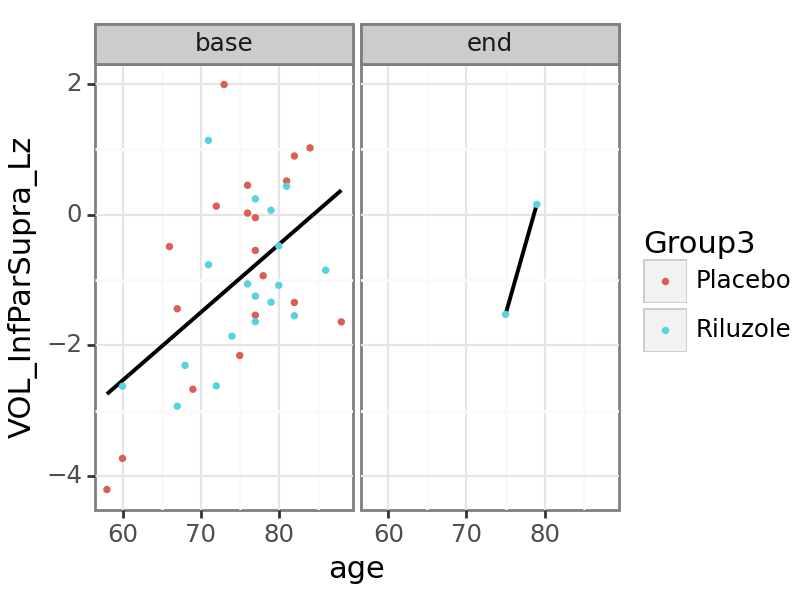

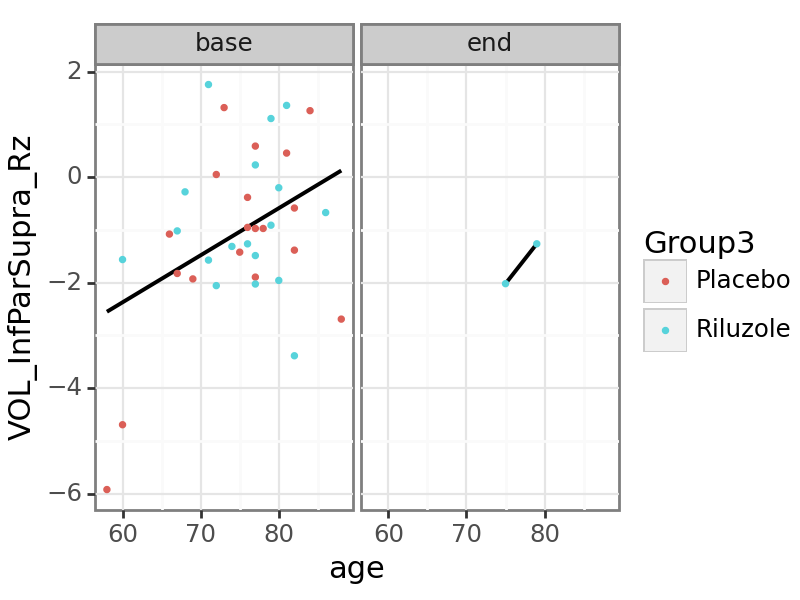

In [33]:
p9.options.figure_size = (4,3)
for var in vol_columns:
    subset_data = all_data.dropna(subset = [var,'age', 'Group3'])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('source', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group3'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, color = 'black', method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.facet_grid('~timepoint')
    )
    print(plot)

## Cognitive

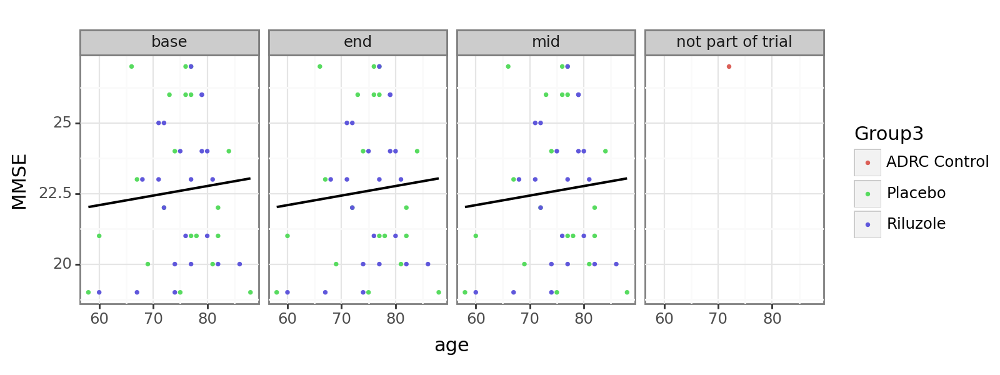

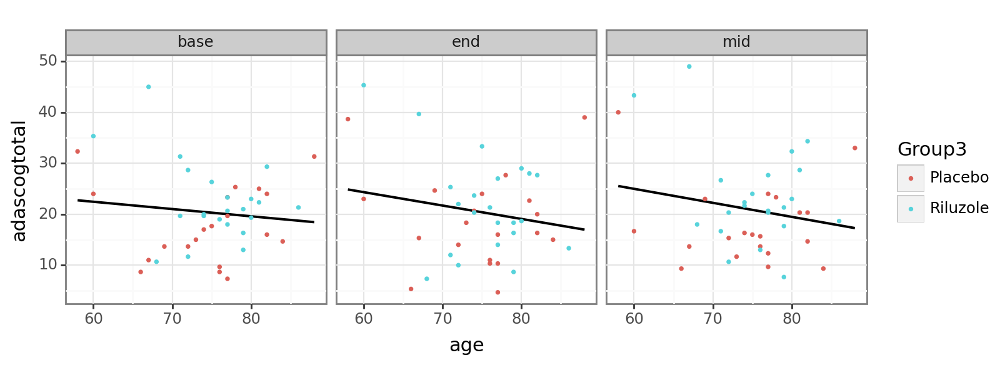

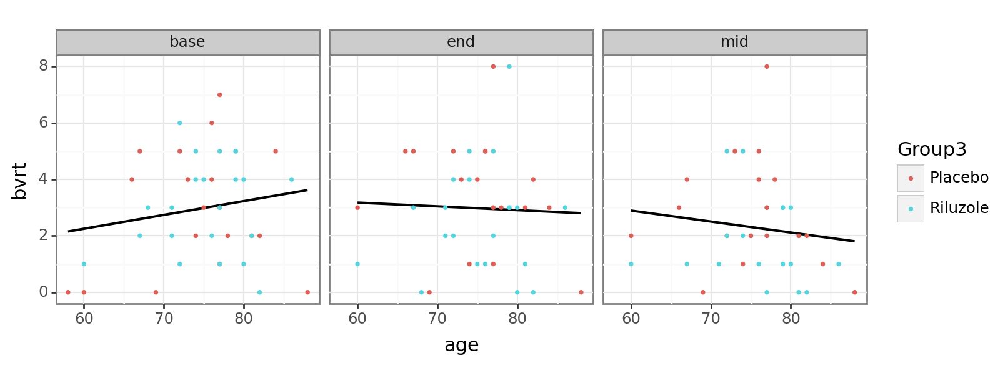

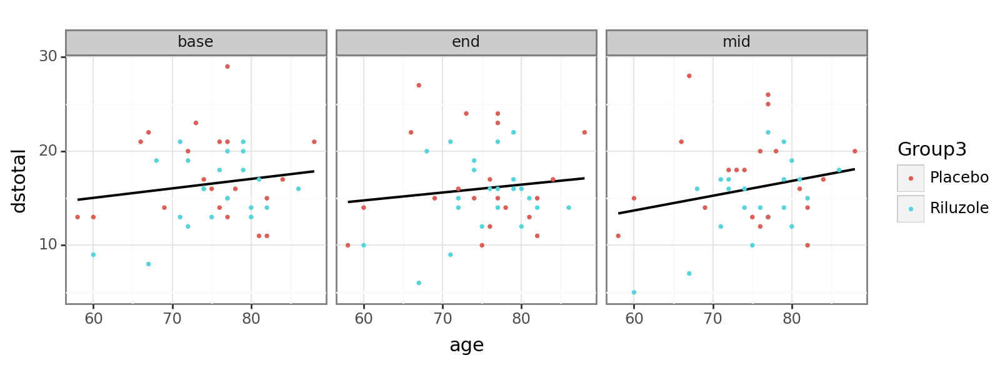

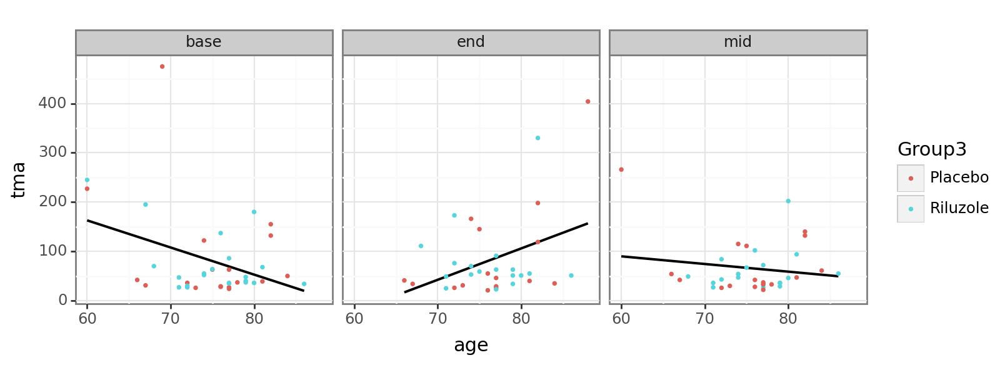

...

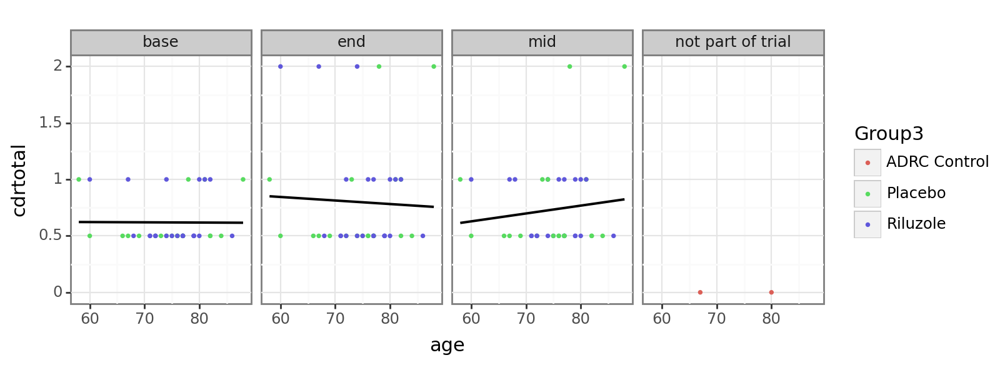

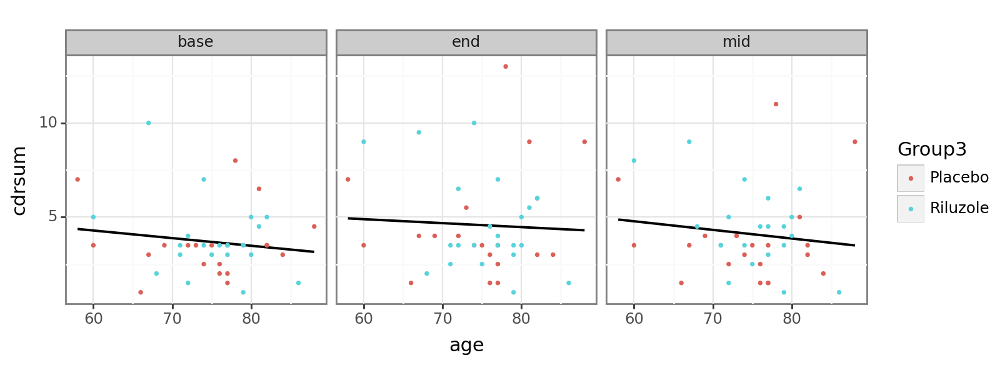

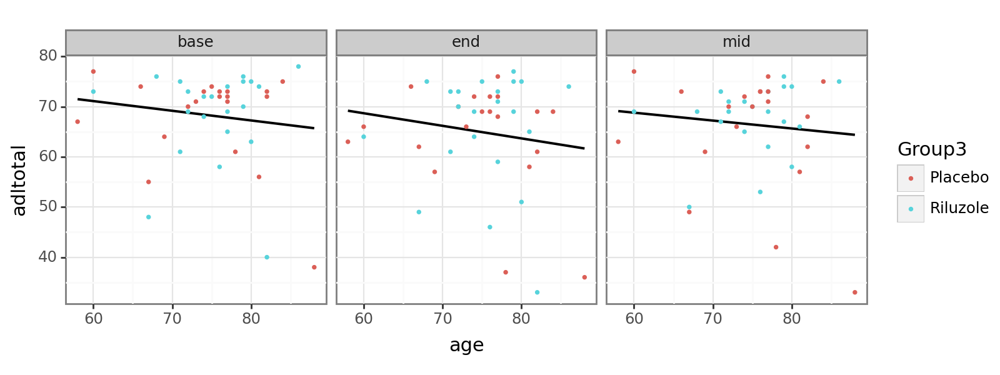

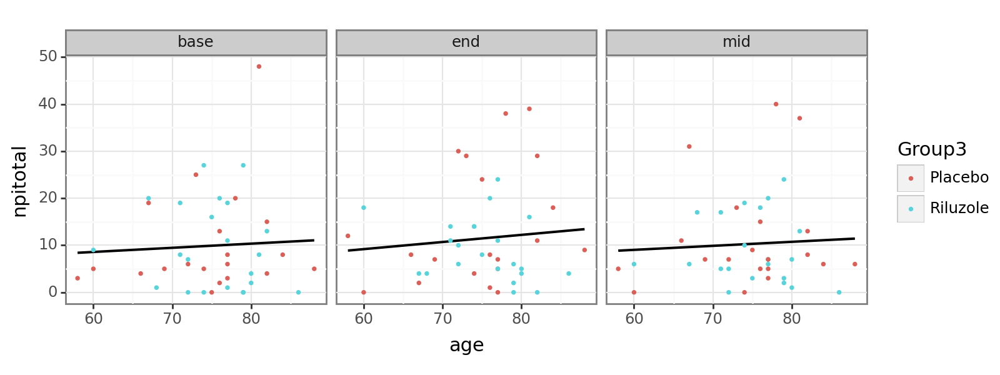

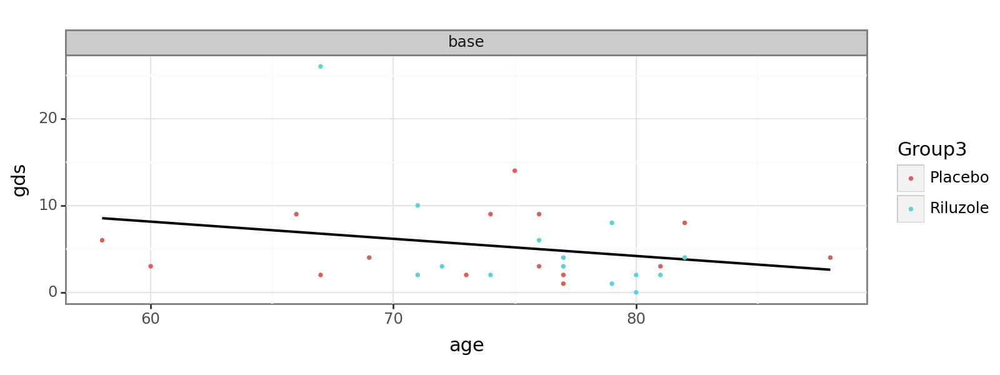

In [34]:
p9.options.figure_size = (8,3)
for var in cog_columns:
    subset_data = all_data.dropna(subset = [var,'age', 'Group3'])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('source', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)

    plot = (
            p9.ggplot(subset_data, p9.aes(x = 'age', y = var, color = 'Group3'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, color = 'black', method = 'lm')
            + p9.geom_point(size = 0.5)
            + p9.facet_grid('~timepoint')
    )
    print(plot)

# ID outliers

In [35]:
placebo_baseline_data.loc[placebo_baseline_data['ID_ADM'].isin(['APE-792_1']), ['ID_ADM', 'timepoint'] + plasma_columns]


,ID_ADM,timepoint,Ab40,Ab42,Ab42_40,GFAP,NFL,pTau181,pTau217,pTau231,pTau181_Ab42
8,APE-792_1,base,NaN,NaN,NaN,97.181777,30.049361,17.628541,0.366035,61.285746,NaN
50,APE-792_1,end,NaN,NaN,NaN,NaN,NaN,3.288541,NaN,37.400487,NaN
98,APE-792_1,mid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
placebo_baseline_data.loc[(placebo_baseline_data['pTau217']<0.8), ['ID_ADM', 'timepoint'] + plasma_columns]


,ID_ADM,timepoint,Ab40,Ab42,Ab42_40,GFAP,NFL,pTau181,pTau217,pTau231,pTau181_Ab42
8,APE-792_1,base,NaN,NaN,NaN,97.181777,30.049361,17.628541,0.366035,61.285746,NaN
11,APE-792_27,base,55.198983,3.940558,0.063645,212.865786,43.234348,7.552410,0.483204,31.370555,1.798124
12,APE-792_53,base,79.295897,6.174499,0.074934,158.017278,30.797484,10.261525,0.688814,23.338163,1.609792
15,RIL_3,base,65.195897,4.844499,0.071011,85.017278,33.297484,9.761525,0.685681,28.165723,1.959445
26,APE-792_56,base,55.453922,4.224802,0.070782,336.688280,17.893731,8.807492,0.649377,15.434479,2.007536
30,RIL_12,base,82.740958,3.540256,0.041196,183.194783,20.438101,2.816443,0.423911,6.008661,0.776078
31,RIL_14,base,NaN,NaN,NaN,200.017278,20.897484,4.021525,0.765681,9.390369,NaN
39,APE-792_62,base,90.108860,6.069045,0.066495,241.510774,70.853114,6.222574,0.164221,17.493690,1.009679
40,RIL_8,base,77.421824,5.333590,0.069391,81.504271,32.208744,2.743623,0.317804,6.951729,0.518383
57,RIL_3,end,2.175897,NaN,NaN,91.017278,29.797484,11.261525,0.745681,56.331190,NaN


In [37]:
placebo_baseline_data.loc[(placebo_baseline_data['pTau217']<0.8), ['ID_ADM', 'timepoint'] ]

,ID_ADM,timepoint
8,APE-792_1,base
11,APE-792_27,base
12,APE-792_53,base
15,RIL_3,base
26,APE-792_56,base
30,RIL_12,base
31,RIL_14,base
39,APE-792_62,base
40,RIL_8,base
57,RIL_3,end


c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 7 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 7 rows containing missing values.


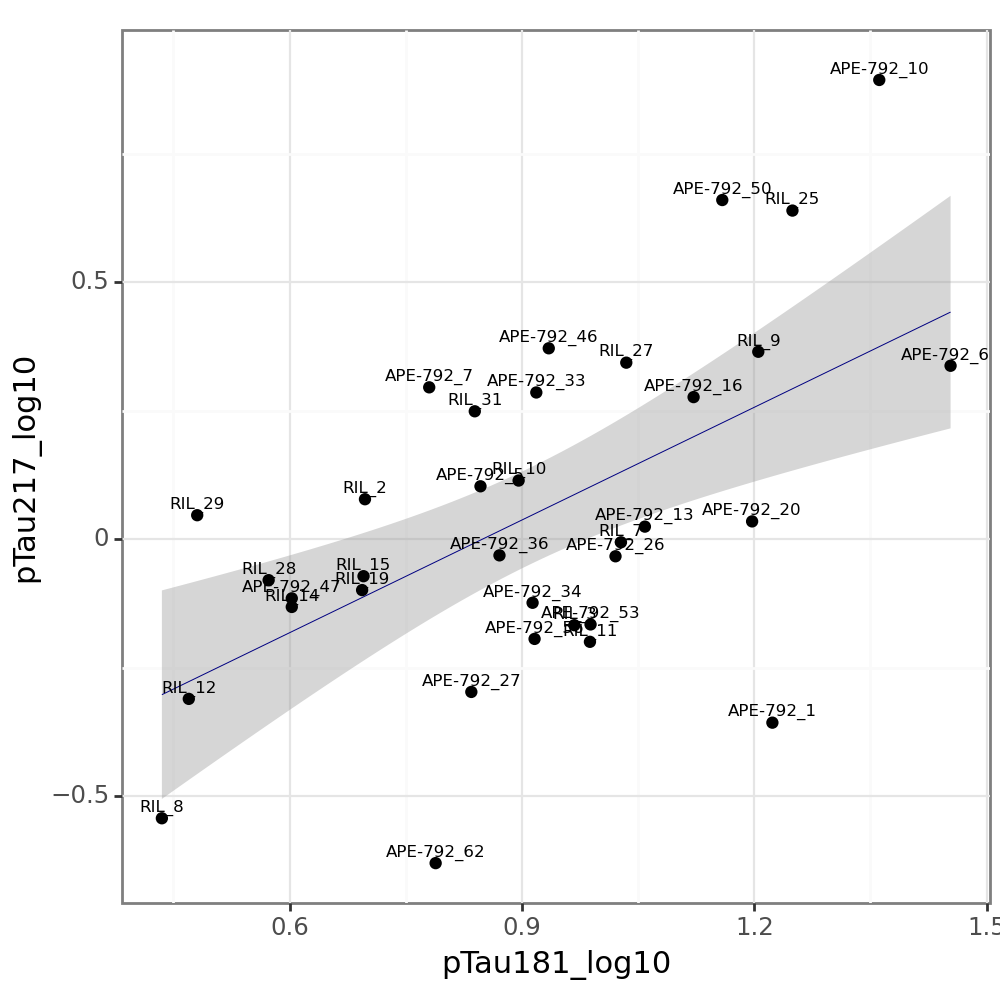

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 7 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 7 rows containing missing values.


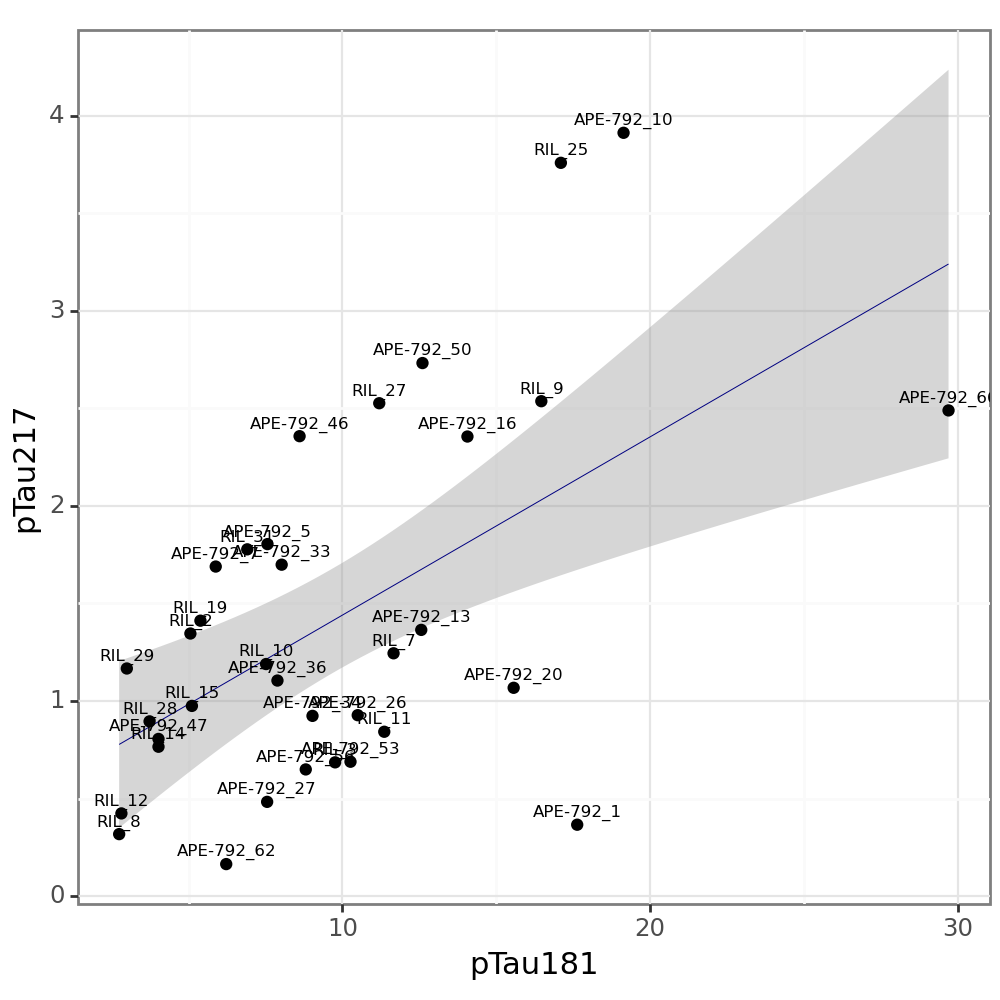

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 18 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 18 rows containing missing values.


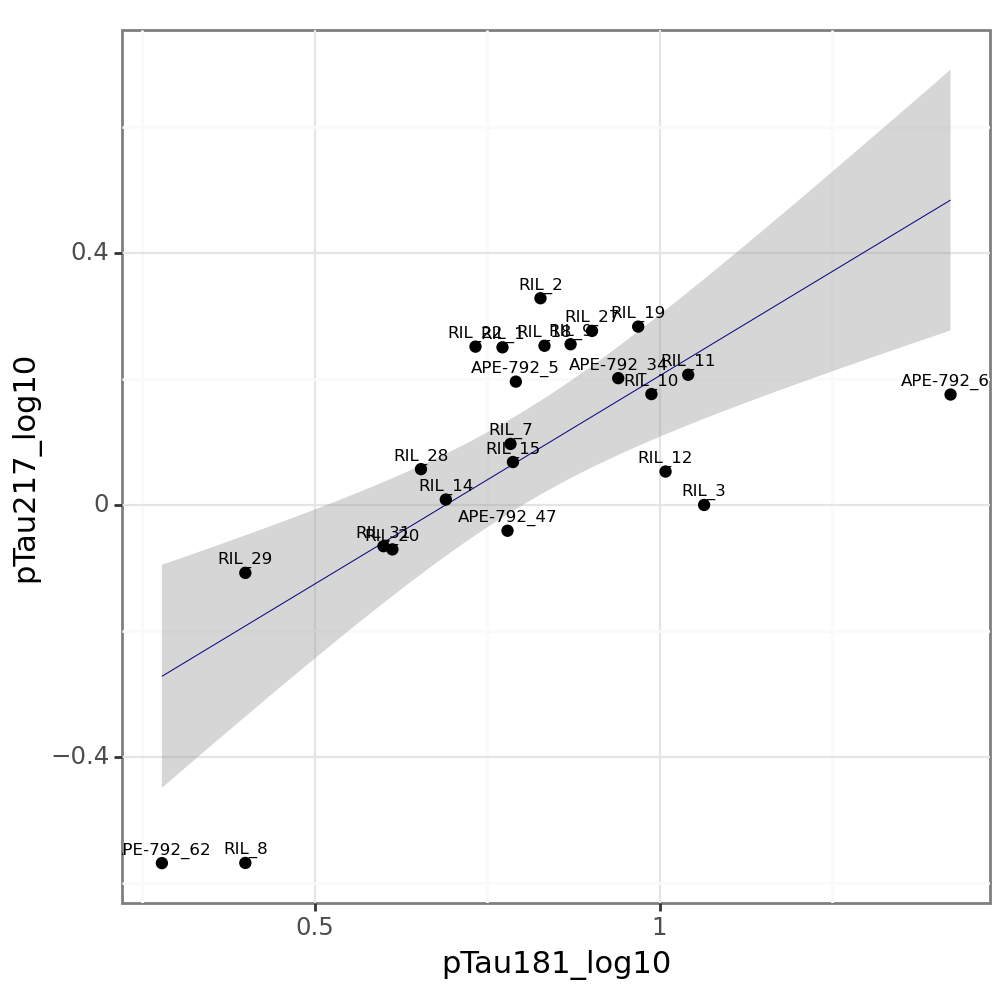

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 18 rows containing missing values.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_text : Removed 18 rows containing missing values.


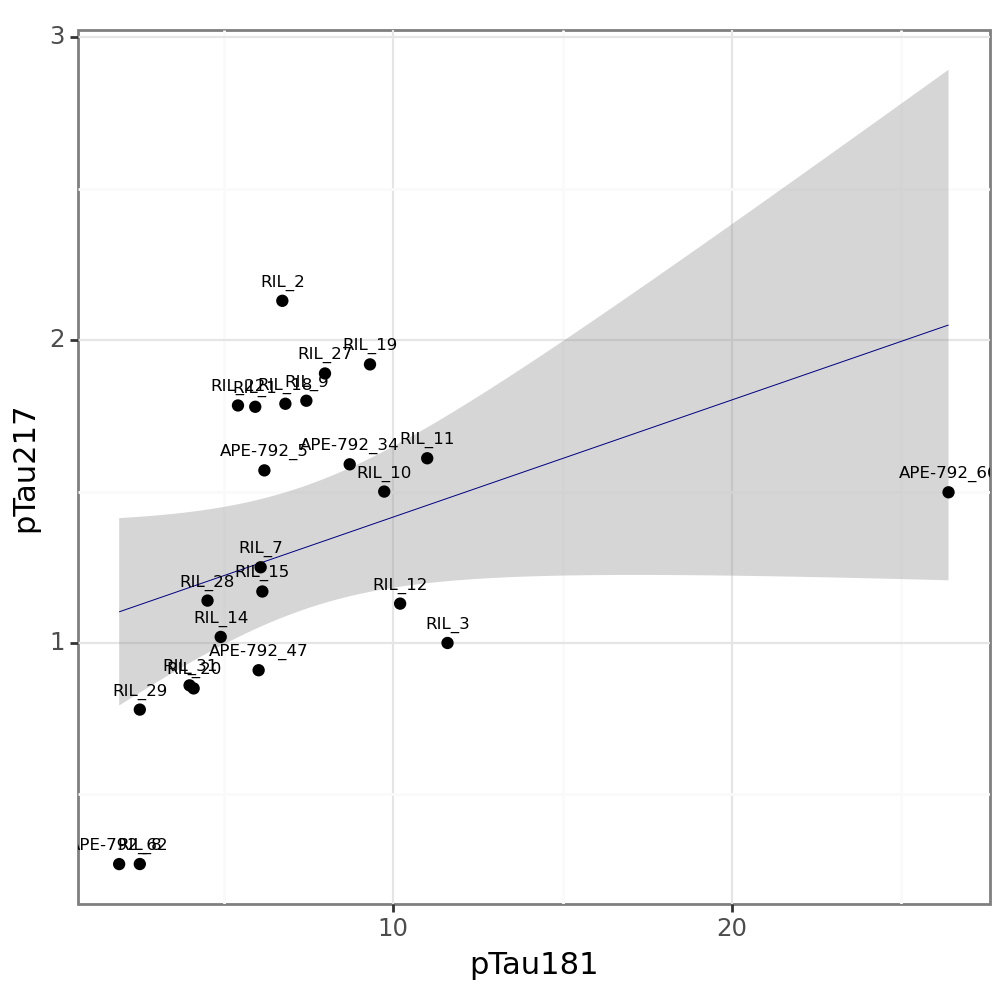

In [38]:
## labeled baseline

p9.options.figure_size = (5,5)  

print(p9.ggplot(baseline_data, p9.aes(x = 'pTau181_log10', y = 'pTau217_log10', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )


print(p9.ggplot(baseline_data, p9.aes(x = 'pTau181', y = 'pTau217', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.06)
             )


print(p9.ggplot(all_data[all_data['timepoint'].isin(['end'])], p9.aes(x = 'pTau181_log10', y = 'pTau217_log10', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )


print(p9.ggplot(all_data[all_data['timepoint'].isin(['end'])], p9.aes(x = 'pTau181', y = 'pTau217', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.06)
             )

# Selection of covariates - with age corrected data

## univariate

In [39]:
other_relationship_results = pd.DataFrame(columns = [
    'var1', 'var2',
 'lin_p_placebo', 
 'lin_p_baseline',
 'lin_p_plac_bl'
])

combinations = pd.DataFrame(list(itertools.product(plasma_columns + log10_plasma_columns, ['age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])))
for idx in range(combinations[0].size):
    var0 = combinations[0][idx]
    var1 = combinations[1][idx]
    temp_df_placebo = placebo_data.dropna(subset = [var0, var1])
    temp_df_baseline =  baseline_data.dropna(subset = [var0, var1])
    temp_df_plac_bl = placebo_baseline_data.copy().dropna(subset = [var0, var1])

    # z-score data
    temp_df_placebo[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_placebo[[var0]])
    temp_df_baseline[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0]])
    temp_df_plac_bl[[var0]] = preprocessing.StandardScaler().fit_transform(temp_df_plac_bl[[var0]])


    # univariate linear model just within the placebo data
    model = smf.mixedlm(formula = var0 + ' ~ ' + var1, data = temp_df_placebo, groups= temp_df_placebo["ID_ADM"]).fit()
    lin_p_placebo = model.pvalues[1:-1].min()

    # univariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var0 + ' ~ ' + var1, data = temp_df_baseline).fit()
    lin_p_baseline = model.pvalues[1:].min()

    # univariate linear model just within the placebo data
    model = smf.mixedlm(formula = var0 + ' ~ ' + var1, data = temp_df_plac_bl, groups= temp_df_plac_bl["ID_ADM"]).fit()
    lin_p_plac_bl= model.pvalues[1:-1].min()
    
    
    # save results
    other_relationship_results.loc[len(other_relationship_results)] =  [var0, var1, 
    lin_p_placebo, lin_p_baseline, lin_p_plac_bl] 

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\pandas\core\frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\pandas\core\frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\pandas\core\frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_i

In [40]:
other_relationship_results.loc[(other_relationship_results[['lin_p_baseline']].min(axis = 1) < 0.05), :].sort_values(['var2', 'lin_p_plac_bl'])

,var1,var2,lin_p_placebo,lin_p_baseline,lin_p_plac_bl
75,pTau217_log10,age,1.967466e-10,0.000065,9.455104e-10
30,pTau217,age,2.535398e-05,0.000811,1.427203e-06
65,NFL_log10,age,2.577068e-04,0.001639,1.018858e-04
12,Ab42_40,sex,8.892348e-01,0.024665,7.596955e-02
57,Ab42_40_log10,sex,9.223682e-01,0.048911,7.718804e-02


## combined

In [41]:
other_relationship_results_multi = pd.DataFrame(columns = [
    'var',
    'age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline',
])

combinations = pd.DataFrame(list(itertools.product(plasma_columns + log10_plasma_columns, ['age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])))
for var in plasma_columns + log10_plasma_columns:
    temp_df_placebo = placebo_data.dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])
    temp_df_baseline =  baseline_data.dropna(subset = [var, 'age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])
    temp_df_plac_bl = placebo_baseline_data.copy().dropna(subset = [var,'age', 'apoe4_carrier', 'sex', 'race', 'Education_years'])

    # z-score data
    temp_df_placebo[[var0, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_placebo[[var0, 'Education_years', 'age']])
    temp_df_baseline[[var0, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0, 'Education_years', 'age']])
    temp_df_plac_bl[[var0, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_plac_bl[[var0, 'Education_years', 'age']])


    # multivariate linear model just within the baseline datapoints of the trial data
    model = smf.ols(formula = var + ' ~ age + apoe4_carrier + sex + Education_years', data = temp_df_baseline).fit()
    age_baseline = model.pvalues['age']
    apoe4_carrier_baseline = model.pvalues['apoe4_carrier[T.Yes]']
    sex_baseline = model.pvalues['sex[T.M]']
    Education_years_baseline = model.pvalues['Education_years']


    # save results
    other_relationship_results_multi.loc[len(other_relationship_results_multi)] =  [var,
    age_baseline,apoe4_carrier_baseline,sex_baseline, Education_years_baseline,
    ] 

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\pandas\core\frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\pandas\core\frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\pandas\core\frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_i

In [42]:
other_relationship_results_multi.loc[(other_relationship_results_multi[['age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline',]].min(axis = 1) < 0.05), :]

,var,age_baseline,apoe4_carrier_baseline,sex_baseline,Education_years_baseline
2,Ab42_40,0.305143,0.807898,0.041741,0.617835
6,pTau217,0.002952,0.429650,0.448211,0.955024
13,NFL_log10,0.008783,0.479882,0.743931,0.678073
15,pTau217_log10,0.000405,0.274326,0.237261,0.694564


In [43]:
(other_relationship_results_multi[[ 
    'age_baseline','apoe4_carrier_baseline','sex_baseline', 'Education_years_baseline',
]]<0.05).sum().sort_values()

apoe4_carrier_baseline      0
Education_years_baseline    0
sex_baseline                1
age_baseline                3
dtype: int64